# Intrusion Detection System (IDS) Using Machine Learning

### Project Overview

This project focuses on developing an Intrusion Detection System (IDS) utilizing machine learning techniques. The goal is to classify network traffic as either benign or other malicious types, leveraging the **LycoS-Unicas-IDS2018 dataset**, which addresses limitations in earlier IDS datasets. The project integrates advanced data preprocessing, feature engineering, and machine learning algorithms to achieve high accuracy and efficient detection rates.
### Objectives

- Preprocess and analyze the dataset to ensure data quality and consistency.
- Apply memory optimization techniques for handling large datasets.
- Use data scaling and dimensionality reduction methods to improve model performance.
- Train and evaluate various machine learning models, including Decision Trees, Random Forest, Extra Trees, and XGBoost.
- Evaluate performance using metrics like accuracy, precision, recall, F1-score, confusion matrix and ROC-AUC.

### Dataset

The **LycoS-Unicas-IDS2018 dataset** is used in this project, offering significant improvements over the widely used CIC-IDS2018 dataset. The dataset contains various attack scenarios and benign traffic, enabling robust model training and testing.


## **Notebook Structure**
1. **Dataset Preparation**
   - Importing and exploring the dataset.
   - Handling missing values and data cleaning.
   - Feature engineering and dimensionality reduction.
2. **Exploratory Data Analysis (EDA)**
   - Visualizations to understand data distributions.
   - Statistical summaries and insights.
3. **Data Preprocessing**
   - Applying techniques like Random under-sampling (RU) and Stacking Feature Embeded -Principal Component Analysis (SFE-PCA).
   - **rewrite** apply balancing in two approaches: make all classes have the same number of instances(artifically balancec), handling imbalnce while maintaining the same distribution.
   - Splitting the dataset into 10 fols using K-fold cross-validation.
4. **Model Training**
   - Selecting and training machine learning models.
   - train models for both Multiclass classificaion and binary classification.
   - **rewrite** for each of Multiclass and binary class classification train the both approaches I did 
     to handle imbalance making dataset artifivally imbalanced or preserve the original distribution.
   - Hyperparameter tuning for optimal performance.
5. **Model Evaluation**
   - Performance metrics: detection rate, false alarm rate, precision, recall, and F1 score.
   - Confusion matrix and ROC-AUC analysis.
6. **Conclusion**
   - Summary of results and findings.


## **Code Execution Guide**
Each code cell is accompanied by comments explaining its functionality. Follow the notebook sequentially for smooth execution.


### Importing Necessary Libraries

In this section, I import all the required libraries for data preprocessing, feature engineering, and machine learning. The libraries include tools for memory optimization, data manipulation, visualization, machine learning algorithms, and performance evaluation.


### Loading Resampled Data
The resampled data and corresponding labels are loaded back into the environment for further analysis or training.


In [2]:
#Importing all the neccessary libraries
import joblib
from collections import Counter
import gc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.under_sampling import RandomUnderSampler
# from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.utils import shuffle

from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score

import os
# from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import StratifiedKFold, cross_val_score
# from sklearn.model_selection import train_test_split
from scipy.sparse import csr_matrix
import dask.dataframe as dd
from sklearn.model_selection import KFold

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay
# from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
import lightgbm as lgb



## **1. Dataset Preparation**

### Loading the Dataset and Memory Optimization

The **LycoS-Unicas-IDS2018 dataset** is loaded in chunks to manage memory usage efficiently,columns are converted to more memory-efficient data types based on their value ranges.The `reduce_memory_usage` function is applied to each chunk, and duplicates are dropped to ensure data integrity. 


In [ ]:
# Function to reduce memory usage of DataFrame
def reduce_memory_usage(df):
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type == "float64":
            # Convert to float16 only if values fit in the range
            if df[col].max() < np.finfo(np.float16).max and df[col].min() > np.finfo(np.float16).min:
                df[col] = df[col].astype("float16")
            else:
                df[col] = df[col].astype("float32")
        elif col_type == "int64":
            # Convert to int16 only if values fit in the range
            if df[col].max() < np.iinfo(np.int16).max and df[col].min() > np.iinfo(np.int16).min:
                df[col] = df[col].astype("int16")
            else:
                df[col] = df[col].astype("int32")
    return df

# Step 1: Load Dataset in Chunks
chunk_size = 1000000  # Process 1,000,000 rows at a time
# download the dataset from https://www.kaggle.com/datasets/solarmainframe/ids-intrusion-csv
# store the csv file in the same directory as this script
reader = pd.read_csv('../data/LycoS-Unicas-IDS2018.csv', chunksize=chunk_size)
df = pd.concat([reduce_memory_usage(chunk) for chunk in reader], ignore_index=True).drop_duplicates(keep="first")


### Joblib Serialization for the dataframe containg the dataset

The following cells serialize the df using `joblib` for efficient storage and retrieval:

In [ ]:
joblib.dump(df, 'last_df.pkl')

### Loading Dataset 
The dataset is loaded back into the environment for further analysis 


In [4]:
df = joblib.load('last_df.pkl')

In [5]:
df.dtypes

dst_port                    int32
ip_prot                     int16
flow_duration               int32
down_up_ratio             float16
pkt_len_max               float16
                           ...   
bwd_subflow_bytes_mean    float32
bwd_subflow_pkt_mean      float16
fwd_tcp_init_win_bytes      int32
bwd_tcp_init_win_bytes      int32
label                      object
Length: 78, dtype: object

In [6]:
df.dtypes.unique()

array([dtype('int32'), dtype('int16'), dtype('float16'), dtype('float32'),
       dtype('O')], dtype=object)

### **2. Exploratory Data Analysis (EDA)**

#### Dataset Summary

The shape and basic information of the loaded dataset are displayed to provide an overview of its structure, including the number of rows, columns, and data types. This step ensures that the dataset is loaded correctly and is ready for preprocessing.


In [7]:
print(f"Dataset shape: {df.shape}")
print(df.info())

Dataset shape: (10468590, 78)
<class 'pandas.core.frame.DataFrame'>
Index: 10468590 entries, 0 to 13691267
Data columns (total 78 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   dst_port                int32  
 1   ip_prot                 int16  
 2   flow_duration           int32  
 3   down_up_ratio           float16
 4   pkt_len_max             float16
 5   pkt_len_min             float16
 6   pkt_len_mean            float16
 7   pkt_len_var             float32
 8   pkt_len_std             float16
 9   bytes_per_s             float32
 10  pkt_per_s               float32
 11  fwd_pkt_per_s           float32
 12  bwd_pkt_per_s           float32
 13  fwd_pkt_cnt             int32  
 14  fwd_pkt_len_tot         int32  
 15  fwd_pkt_len_max         float16
 16  fwd_pkt_len_min         float16
 17  fwd_pkt_len_mean        float16
 18  fwd_pkt_len_std         float16
 19  fwd_pkt_hdr_len_tot     int32  
 20  fwd_pkt_hdr_len_min     int16  
 21  fwd_

2. **Exploratory Data Analysis (EDA)**
   - Visualizations to understand data distributions.
   - Statistical summaries and insights.
   - Handling missing values and data cleaning.


In [8]:
df.head()

d:\Besan_Programs\new programs\python program installation\Lib\site-packages\pandas\io\formats\format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()
d:\Besan_Programs\new programs\python program installation\Lib\site-packages\pandas\io\formats\format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()


,dst_port,ip_prot,flow_duration,down_up_ratio,pkt_len_max,pkt_len_min,pkt_len_mean,pkt_len_var,pkt_len_std,bytes_per_s,...,bwd_bulk_bytes_mean,bwd_bulk_pkt_mean,bwd_bulk_rate_mean,fwd_subflow_bytes_mean,fwd_subflow_pkt_mean,bwd_subflow_bytes_mean,bwd_subflow_pkt_mean,fwd_tcp_init_win_bytes,bwd_tcp_init_win_bytes,label
0,443,6,158046,0.666504,200.0,0.0,40.000000,8000.000000,89.4375,1265.454346,...,0.0,0.0,0.0,200.0,3.0,0.0,2.0,8192,8192,Benign
1,443,6,158048,0.666504,58.0,0.0,11.601562,672.799988,25.9375,366.977112,...,0.0,0.0,0.0,58.0,3.0,0.0,2.0,8192,8192,Benign
2,80,6,1021,1.333008,488.0,0.0,92.687500,33982.238281,184.3750,635651.312500,...,0.0,0.0,0.0,161.0,3.0,488.0,4.0,8192,17922,Benign
3,80,6,17646,1.333008,488.0,0.0,92.687500,33982.238281,184.3750,36778.875000,...,0.0,0.0,0.0,161.0,3.0,488.0,4.0,8192,17922,Benign
4,3389,6,1661321,0.875000,1149.0,0.0,165.375000,96467.968750,310.5000,1493.389893,...,0.0,0.0,0.0,1052.0,8.0,1429.0,7.0,8192,64000,Benign


In [9]:
df.head().T

,0,1,2,3,4
dst_port,443,443,80,80,3389
ip_prot,6,6,6,6,6
flow_duration,158046,158048,1021,17646,1661321
down_up_ratio,0.666504,0.666504,1.333008,1.333008,0.875
pkt_len_max,200.0,58.0,488.0,488.0,1149.0
...,...,...,...,...,...
bwd_subflow_bytes_mean,0.0,0.0,488.0,488.0,1429.0
bwd_subflow_pkt_mean,2.0,2.0,4.0,4.0,7.0
fwd_tcp_init_win_bytes,8192,8192,8192,8192,8192
bwd_tcp_init_win_bytes,8192,8192,17922,17922,64000


#### Checking for Missing Values

Missing values in the dataset are identified, and their counts are displayed. This step is crucial to ensure data completeness and handle any potential missing entries before proceeding to feature engineering and model training.


In [10]:
print(df.isnull().sum())
print(f' number of null columns is {df.isnull().sum().sum()}')

dst_port                  0
ip_prot                   0
flow_duration             0
down_up_ratio             0
pkt_len_max               0
                         ..
bwd_subflow_bytes_mean    0
bwd_subflow_pkt_mean      0
fwd_tcp_init_win_bytes    0
bwd_tcp_init_win_bytes    0
label                     0
Length: 78, dtype: int64
 number of null columns is 0


In [11]:
print(df.isna().sum())
print(f' number of NaN columns is {df.isna().sum().sum()}')

dst_port                  0
ip_prot                   0
flow_duration             0
down_up_ratio             0
pkt_len_max               0
                         ..
bwd_subflow_bytes_mean    0
bwd_subflow_pkt_mean      0
fwd_tcp_init_win_bytes    0
bwd_tcp_init_win_bytes    0
label                     0
Length: 78, dtype: int64
 number of NaN columns is 0


In [12]:
X = df.drop(columns=['label'])  
y = df['label'].astype('category')

In [ ]:
joblib.dump(X, 'last_X_notscaled.pkl')

In [13]:
def check_standardization(X):
    X_mean = X.mean()
    X_std = X.std()

    print("Feature Means:")
    print(X_mean)

    print("\nFeature Standard Deviations:")
    print(X_std)

    # Check if features are approximately standardized
    is_standardized = (X_mean.abs() < 1e-5) & (abs(X_std - 1) < 1e-5)
    return is_standardized
    

In [14]:
is_standardized = check_standardization(X)
print("\nAre features standardized?")
print(is_standardized)

d:\Besan_Programs\new programs\python program installation\Lib\site-packages\pandas\core\nanops.py:1496: RuntimeWarning: overflow encountered in cast
  return count.astype(dtype, copy=False)
d:\Besan_Programs\new programs\python program installation\Lib\site-packages\numpy\_core\_methods.py:52: RuntimeWarning: overflow encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Feature Means:
dst_port                  1.062049e+03
ip_prot                   7.755907e+00
flow_duration             1.280982e+07
down_up_ratio                      NaN
pkt_len_max                        NaN
                              ...     
fwd_subflow_pkt_mean      3.106607e+01
bwd_subflow_bytes_mean    2.794340e+03
bwd_subflow_pkt_mean               NaN
fwd_tcp_init_win_bytes    1.656293e+04
bwd_tcp_init_win_bytes    2.736085e+04
Length: 77, dtype: float64

Feature Standard Deviations:
dst_port                  3.155358e+03
ip_prot                   4.050562e+00
flow_duration             3.252427e+07
down_up_ratio             0.000000e+00
pkt_len_max               0.000000e+00
                              ...     
fwd_subflow_pkt_mean      1.844118e+03
bwd_subflow_bytes_mean    8.288722e+04
bwd_subflow_pkt_mean      0.000000e+00
fwd_tcp_init_win_bytes    1.947557e+04
bwd_tcp_init_win_bytes    2.173733e+04
Length: 77, dtype: float64

Are features standardized?
dst_port       

### As shown X is not standarized

### rewrite the classes in the y (target) in the dataset

In [33]:
y.unique()

['Benign', 'Web Attack - Brute Force', 'Web Attack - XSS', 'Web Attack - Sql Injection', 'DDoS HOIC', ..., 'DoS Slowloris', 'FTP-Patator', 'SSH-Patator', 'DoS Slowhttptest', 'DoS Hulk']
Length: 14
Categories (14, object): ['Benign', 'Bot', 'DDoS HOIC', 'DDoS LOIC-HTTP', ..., 'SSH-Patator', 'Web Attack - Brute Force', 'Web Attack - Sql Injection', 'Web Attack - XSS']


### Feature Scaling

Standardization is applied to ensure that all features have a mean of 0 and a standard deviation of 1, which is essential for many machine learning algorithms, while it is not required for Tree-based models that I will utilize, it is essential for PCA and Gaussian Mixture(GM) clustering and Kmeans Clustering which I will use them in a new innivative approach named Stacking feature embeded with (SFE-PCA)

In [32]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [35]:
X = pd.DataFrame(X_scaled, columns=X.columns)
X.dtypes

dst_port                  float64
ip_prot                   float64
flow_duration             float64
down_up_ratio             float64
pkt_len_max               float64
                           ...   
fwd_subflow_pkt_mean      float64
bwd_subflow_bytes_mean    float64
bwd_subflow_pkt_mean      float64
fwd_tcp_init_win_bytes    float64
bwd_tcp_init_win_bytes    float64
Length: 77, dtype: object

### Saving the Scaled input features
In this step, Scaled input features (`X_scaled`) is saved using `joblib.dump` to persist it for later use.


In [ ]:
joblib.dump(X_scaled, 'last_scaled_X64.pkl') ##as a dataframe 

#### Number of flows per attack type

The following plots the number of flows accounting for the different attack types. 

* 1 DDoS HOIC
* 2 DoS Hulk
* 3 DDoS LOIC-HTTP
* 4  FTP-Patator
* 5 DoS Slowhttptest
* 6  Bot
* 7 SSH-Patator
* 8 DoS GoldenEye 
* 9 DDoS LOIC-UDP
* 10 'Web Attack - XSS'
* 11 'Web Attack - Brute Force'
* 12 Web Attack - Sql Injection
* 13 DoS Slowloris



In [3]:
df = joblib.load('last_df.pkl')
y = df['label'].astype('category')
X = joblib.load('last_scaled_X64.pkl') ##as a dataframe 


In [8]:
def class_distribution_sampling(y, title):
    """
    Plots a bar chart showing the class distribution with original labels on the x-axis.

    Args:
        y (pd.Series): Encoded target labels.
        title (str): Title for the plot.
    """
    # Get class counts
    class_counts = Counter(y)

    # Create the bar chart
    plt.figure(figsize=(12, 7))
    sns.barplot(
        # x=[label_mapping[label] for label in class_counts.keys()],  # Map encoded labels to original labels
        x=[label for label in class_counts.keys()],  # Map encoded labels to original labels
        y=list(class_counts.values()),
        palette="viridis"
    )

    # Customize the plot
    plt.title(title, fontsize=16)
    plt.xlabel("Class Labels", fontsize=14)
    plt.ylabel("Number of Samples", fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    # plt.yticks(fontsize=12)
    plt.yticks(ticks=range(0, max(class_counts.values()) + 1, int(max(class_counts.values()) / 10)),
               labels=[str(i) for i in range(0, max(class_counts.values()) + 1, int(max(class_counts.values()) / 10))],
               fontsize=12)
    plt.tight_layout()

    # Show the plot
    plt.show()


C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_12208\2306889082.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


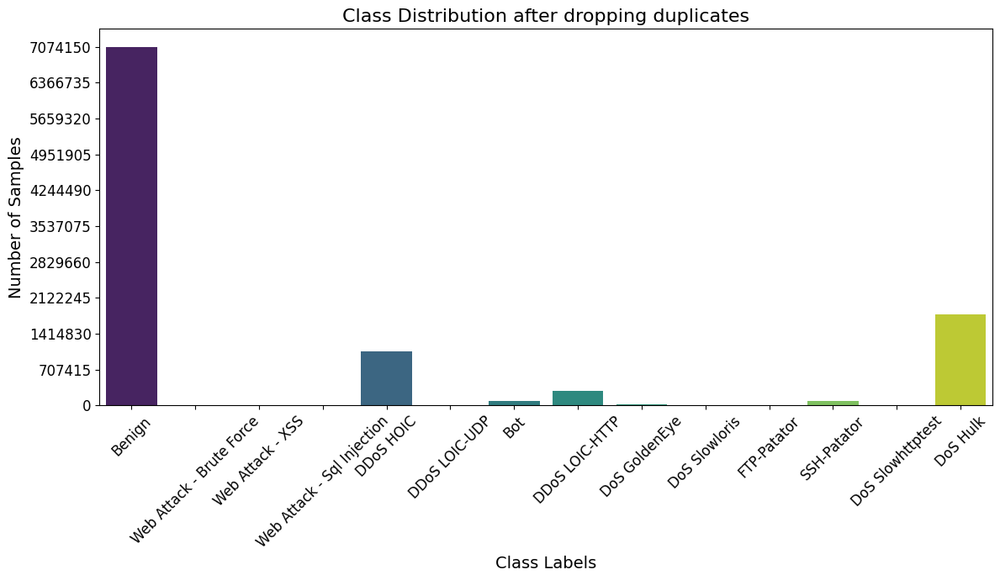

In [9]:
class_distribution_sampling(y, title="Class Distribution after dropping duplicates")

C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_12208\1507925097.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


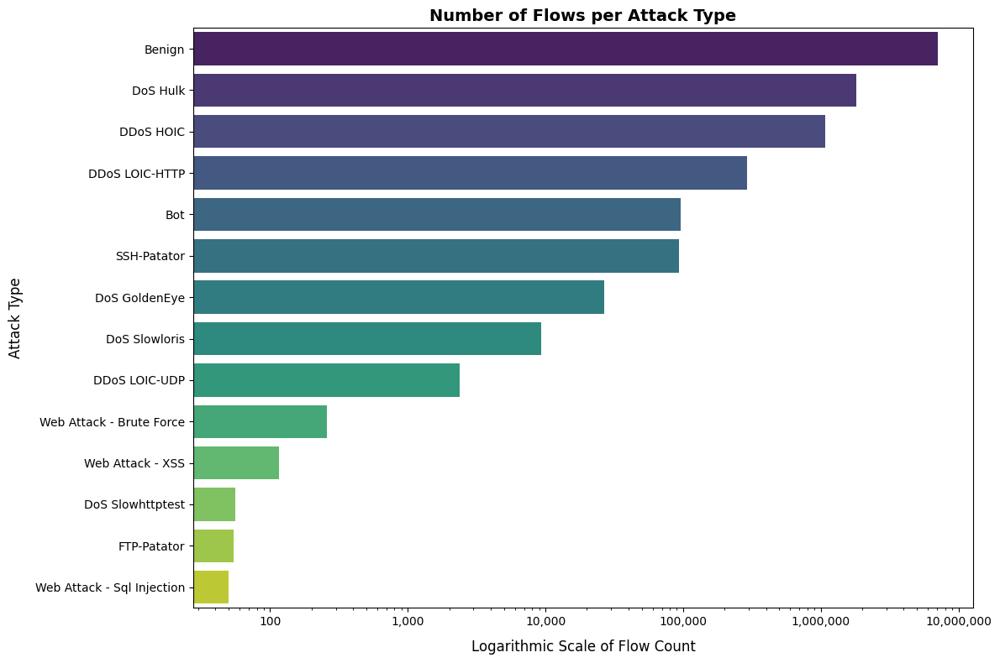

In [17]:
def ClassDistribution1():
    fig, ax = plt.subplots(figsize=(12, 8))  # Adjust figure size for better readability

    sns.countplot(
        y='label', 
        data=df, 
        order=df['label'].value_counts().index, 
        ax=ax, 
        palette='viridis'
    )

    # Apply logarithmic scale to the x-axis
    ax.set_xscale('log')

    # Add informative labels and title
    ax.set_xlabel('Logarithmic Scale of Flow Count', fontsize=12, labelpad=10)
    ax.set_ylabel('Attack Type', fontsize=12, labelpad=10)
    ax.set_title('Number of Flows per Attack Type', fontsize=14, weight='bold')

    # Customize the x-axis ticks to include counts with commas
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

    # Adjust layout for better readability
    plt.tight_layout()

    # Show the plot
    plt.show()
ClassDistribution1()

### Label Preprocessing
rewrite(as seen in theplots there aremany classes thar are underrepresented and consider as noise)so to .
To address class imbalance, labels with extremely low instance counts are merged into a single class labeled as "Other." This step ensures that the model focuses on classes with significant representation while still accounting for rare events.
rewrite add how these classes are considered noise

In [18]:
# Define threshold for merging extremely rare classes
threshold = 500

# Create a DataFrame from the previously combined labels
df_labels = pd.DataFrame(y, columns=['label'])

# Count the number of instances for each label
label_counts = df_labels['label'].value_counts()
print("Original label counts:\n", label_counts)

# Identify classes with low instance counts
low_instance_classes = label_counts[label_counts < threshold].index

# Merge these classes into "Other"
df_labels['label'] = df_labels['label'].replace(low_instance_classes, 'Other')
y = df_labels['label']  # Reassign back to y if needed


# Count the new number of instances for each label after merging
new_label_counts = df_labels['label'].value_counts()
print("\nNew label counts after merging low-instance classes:\n", new_label_counts)


Original label counts:
 label
Benign                        7074151
DoS Hulk                      1802966
DDoS HOIC                     1074376
DDoS LOIC-HTTP                 289328
Bot                             96100
SSH-Patator                     92625
DoS GoldenEye                   26861
DoS Slowloris                    9265
DDoS LOIC-UDP                    2382
Web Attack - Brute Force          260
Web Attack - XSS                  116
DoS Slowhttptest                   56
FTP-Patator                        54
Web Attack - Sql Injection         50
Name: count, dtype: int64

New label counts after merging low-instance classes:
 label
Benign            7074151
DoS Hulk          1802966
DDoS HOIC         1074376
DDoS LOIC-HTTP     289328
Bot                 96100
SSH-Patator         92625
DoS GoldenEye       26861
DoS Slowloris        9265
DDoS LOIC-UDP        2382
Other                 536
Name: count, dtype: int64


C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_12208\2660975801.py:15: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df_labels['label'] = df_labels['label'].replace(low_instance_classes, 'Other')


In [37]:
X.dtypes.unique()

array([dtype('float64')], dtype=object)

**rewrite** 
#### Label Encoding

In [19]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y).astype(np.uint8)
y=pd.Series(y)
# Print the encoded labels and the mapping of classes to their encoded values
print("Encoded labels:\n", np.unique(y))
print(y.dtype)


Encoded labels:
 [0 1 2 3 4 5 6 7 8 9]
uint8


In [20]:
# Map each encoded label back to the original label
label_mapping = {encoded: original for encoded, original in enumerate(label_encoder.classes_)}
print("Label mapping (encoded to original):\n", label_mapping)

Label mapping (encoded to original):
 {0: 'Benign', 1: 'Bot', 2: 'DDoS HOIC', 3: 'DDoS LOIC-HTTP', 4: 'DDoS LOIC-UDP', 5: 'DoS GoldenEye', 6: 'DoS Hulk', 7: 'DoS Slowloris', 8: 'Other', 9: 'SSH-Patator'}


In [9]:
joblib.dump(y,'last_y_encoded.pkl')

['last_y_encoded.pkl']

In [74]:
def check_classification_type(y):
    """
    Determines if the classification problem is multiclass or multi-label.

    Parameters:
        y: Target labels (pandas Series)

    Returns:
        str: 'Multiclass' or 'Multi-label'
    """
    y = np.array(y)  # Convert to NumPy array if not already

    if len(y.shape) == 1:  # If y is 1D, it's a single label per sample
        return "Multiclass"
    
    if len(y.shape) == 2 and y.shape[1] > 1:  # If y is 2D with multiple columns
        if np.all((y == 0) | (y == 1)):  # If it's binary (0/1) per class
            return "Multi-label"
    
    return "Unknown format"

# Example usage:
classification_type = check_classification_type(y)
print(f"Classification Type: {classification_type}")


Classification Type: Multiclass


In [21]:
y = pd.Series(y)

#### Class Distribution

The distribution of classes in the dataset is analyzed both before and after RU. This analysis helps in understanding the dataset's balance and guides model training and evaluation.


In [7]:
# Assuming y contains the encoded class labels

def class_distribution_sampling(y, label_mapping, title):
    """
    Plots a bar chart showing the class distribution with original labels on the x-axis.

    Args:
        y (pd.Series): Encoded target labels.
        label_mapping (dict): Mapping of encoded labels to original labels.
        title (str): Title for the plot.
    """
    # Get class counts
    class_counts = Counter(y)

    # Create the bar chart
    plt.figure(figsize=(12, 7))
    sns.barplot(
        x=[label_mapping[label] for label in class_counts.keys()],  # Map encoded labels to original labels
        y=list(class_counts.values()),
        palette="viridis"
    )

    # Customize the plot
    plt.title(title, fontsize=16)
    plt.xlabel("Class Labels", fontsize=14)
    plt.ylabel("Number of Samples", fontsize=14)
    plt.xticks(rotation=45, fontsize=12)
    # plt.yticks(fontsize=12)
    plt.yticks(ticks=range(0, max(class_counts.values()) + 1, int(max(class_counts.values()) / 10)),
               labels=[str(i) for i in range(0, max(class_counts.values()) + 1, int(max(class_counts.values()) / 10))],
               fontsize=12)
    plt.tight_layout()

    # Show the plot
    plt.show()


rewrite - rerun to remove hybrid sampling in title

C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_12208\1309644443.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


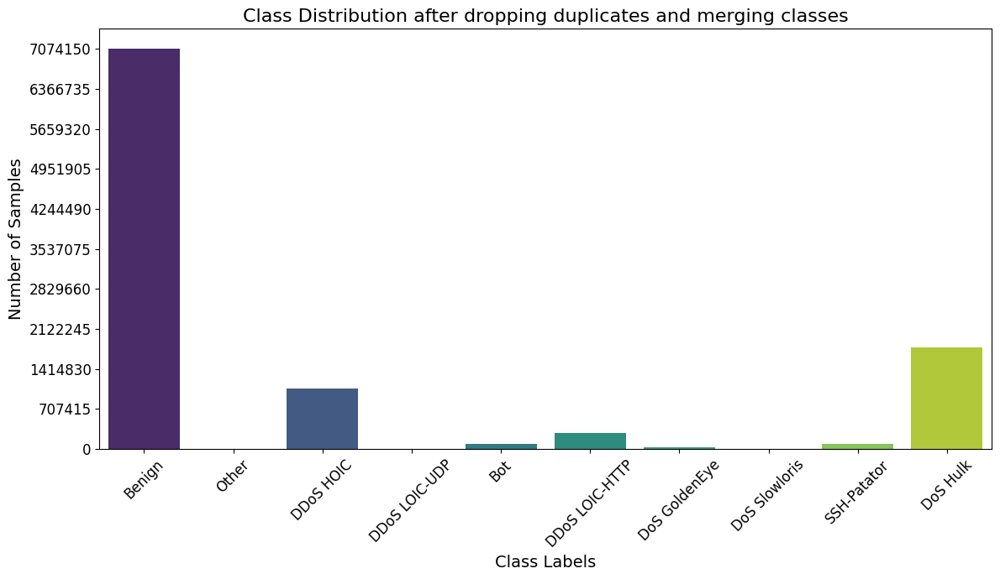

In [23]:
# Call the function to plot class distribution
# class_distribution_sampling(y, label_mapping, title="Class Distribution Before Hybrid  Sampling")
class_distribution_sampling(y, label_mapping, title="Class Distribution after dropping duplicates and merging classes")

#### **rewrite** The graph reveals an under-representation of some attack types, and reveals that the dataset is extremely imbalanced.

I reached here in revising code, comments and markdowns

In [33]:
def ClassDistribution1(X, y, label_mapping):
    # Create a DataFrame from the 'y' series and map numeric labels to original names
    label_df = pd.DataFrame({'label': y.map(label_mapping)})

    # Ensure all class labels are included, even if their count is zero
    label_df['label'] = pd.Categorical(label_df['label'], categories=list(label_mapping.values()))

    # Count occurrences of each label
    class_counts = Counter(label_df['label'])

    # Plot the countplot
    fig, ax = plt.subplots(figsize=(12, 8))  # Adjust figure size for readability

    sns.countplot(
        y='label',  # y-axis represents the label names
        data=label_df,
        # order=label_df['label'].value_counts().index,  # Ensure proper order
        ax=ax,
        palette='viridis',
    )

    # Apply logarithmic scale to the x-axis
    ax.set_xscale('log')

    # Add informative labels and title
    ax.set_xlabel('Logarithmic Scale of Flow Count', fontsize=12, labelpad=10)
    ax.set_ylabel('Attack Type', fontsize=12, labelpad=10)
    ax.set_title('Number of Flows per Attack Type', fontsize=14, weight='bold')

    # Customize the x-axis ticks to include counts with commas
    ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x):,}'))

    # Adjust y-axis ticks to include all classes
    ax.set_yticks(range(len(label_mapping)))
    ax.set_yticklabels(list(label_mapping.values()))

    # Improve spacing and readability
    plt.tight_layout()

    # Show the plot
    plt.show()



C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_12208\2277607822.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


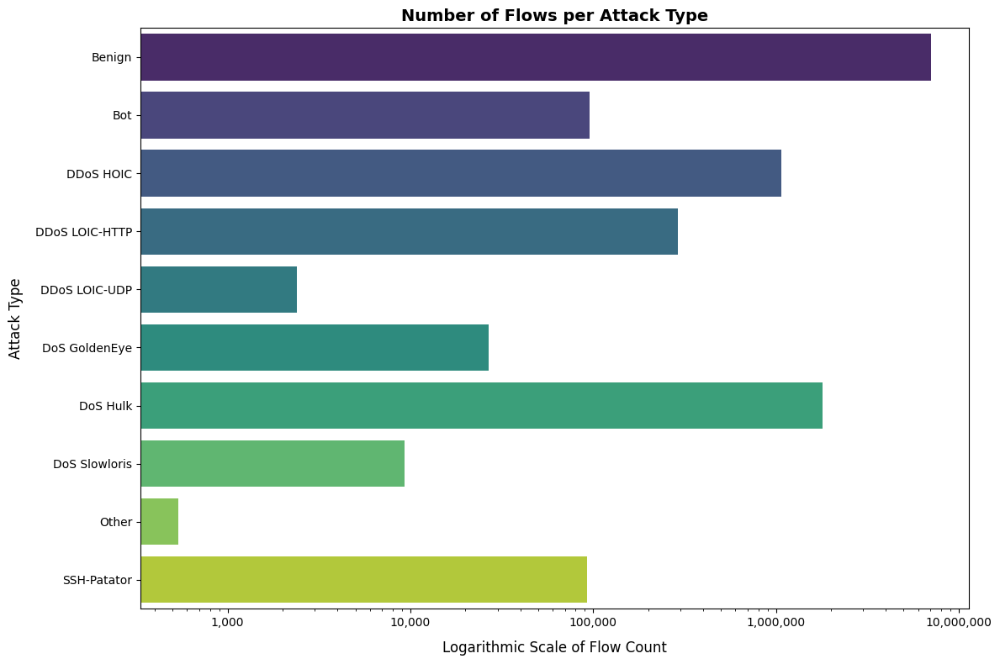

In [34]:
ClassDistribution1(X, pd.Series(y), label_mapping)


### **3. Data Preprocessing**
#### Objective:
To prepare the data for machine learning by addressing class imbalances using Random under-sampling (RUS), reducing dimensionality with SFE-PCA

   - **rewrite** apply balancing using two different approaches: 
   1-Equal class distribution Under-Sampling: make all classes have the same number of classes as the least
   class (make dataset artifically imbalanced)
   2-Stratified RUS: handle imbalance while maintaing the proportional representation of each class this is 
   better reflect real-wold data where imbalance occur so it will reflect more reliable trusted results

I will do both multiclass classification and binary classification so there will be 4 sections 

1- **Multiclass classification - Equal class distribution Under-Sampling**

2- **Multiclass classification - Stratified RUS**

3- **Binary class classification - Equal class distribution Under-Sampling**

4- **Binary class classification - Stratified RUS**

## *Multiclass classification - Equal class distribution Under-Sampling*

In [4]:
undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)
X_under_sampled, y_under_sampled = undersampler.fit_resample(X, y)

In [44]:
print('Original class distribution:\n', Counter(y))
print('Sampled class distribution:\n', Counter(y_under_sampled))

Original class distribution:
 Counter({0: 7074151, 6: 1802966, 2: 1074376, 3: 289328, 1: 96100, 9: 92625, 5: 26861, 7: 9265, 4: 2382, 8: 536})
Sampled class distribution:
 Counter({0: 536, 1: 536, 2: 536, 3: 536, 4: 536, 5: 536, 6: 536, 7: 536, 8: 536, 9: 536})


In [45]:
joblib.dump(X_under_sampled, 'last_X_under_sampled.pkl')
joblib.dump(y_under_sampled,'last_y_under_sampled.pkl')

['last_y_under_sampled.pkl']

C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_1852\1309644443.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


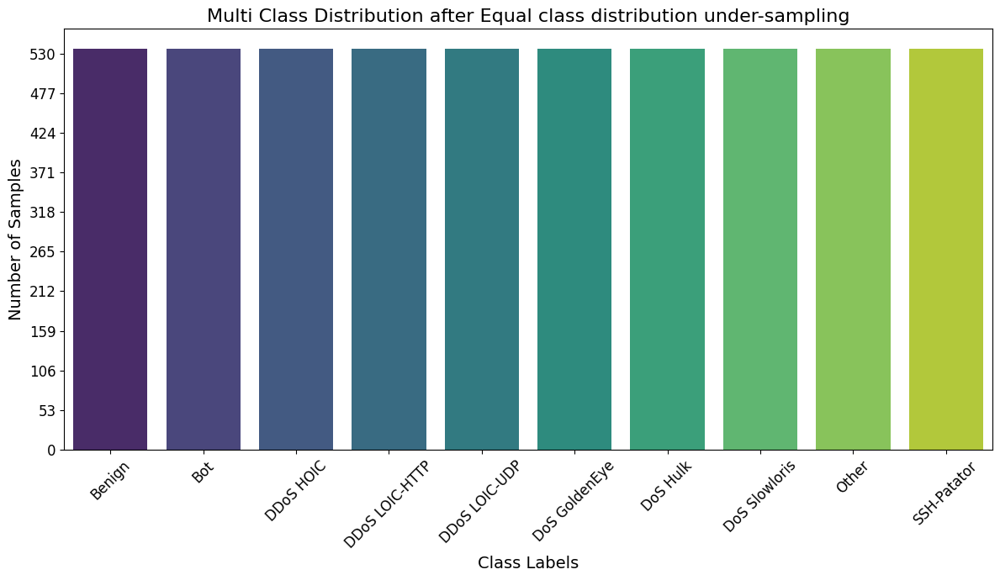

In [10]:
class_distribution_sampling(y_under_sampled, label_mapping, title="Multi Class Distribution after Equal class distribution under-sampling")


#### PCA: Determining Optimal Components

The `determine_optimal_components` function identifies the minimum number of PCA components required to retain a specified amount of variance (default: 95%). It:

1. Computes cumulative explained variance for all components.
2. Finds the number of components that preserve the desired variance.
3. Plots the cumulative explained variance for decision-making.

This ensures dimensionality reduction while retaining the most critical dataset information.

---

#### Applying PCA with IncrementalPCA

The dataset is transformed using `IncrementalPCA`, a memory-efficient method suitable for large datasets. The PCA-transformed dataset is converted into a DataFrame for further analysis, with columns representing principal components.


In [4]:

# Determine the number of components using explained variance ratio
def determine_optimal_components(X, variance_threshold=0.95):
    pca = PCA()
    pca.fit(X)
    explained_variance = np.cumsum(pca.explained_variance_ratio_)

    # Find the number of components that explain the desired variance
    optimal_components = np.argmax(explained_variance >= variance_threshold) + 1
    print(f"Number of components to retain {variance_threshold * 100}% variance: {optimal_components}")

    # Plot explained variance
    
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
    plt.axvline(optimal_components, color='r', linestyle='--', label=f"{optimal_components} Components")
    plt.title("Explained Variance by Number of PCA Components")
    plt.xlabel("Number of Components")
    plt.ylabel("Cumulative Explained Variance")
    plt.legend()
    plt.show()

    return optimal_components


### Function to determine the optimal number of clusters
The following function determines the optimal number of clusters using the silhouette score. It iterates over a range of cluster values, calculates the silhouette score for each, and plots the silhouette score against the number of clusters. The optimal number of clusters is selected based on the highest silhouette score.


In [5]:
# Function to determine the optimal number of clusters
def determine_optimal_clusters(X, max_clusters=15):
    silhouette_scores = []
    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(X)
        # Calculate Silhouette Score
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_scores.append(silhouette_avg)

    # Plot Silhouette Scores
    plt.figure(figsize=(10, 5))
    plt.plot(range(2, max_clusters + 1), silhouette_scores, marker='o', linestyle='--', label="Silhouette Score")
    plt.title("Silhouette Score to Determine Optimal Clusters")
    plt.xlabel("Number of Clusters")
    plt.ylabel("Silhouette Score")
    plt.legend()
    plt.show()

    # Select the optimal number of clusters
    optimal_clusters = np.argmax(silhouette_scores) + 2
    print(f"Optimal number of clusters based on silhouette score: {optimal_clusters}")

    return optimal_clusters


In [49]:
X_under_sampled.shape

(5360, 77)

Number of components to retain 95.0% variance: 2


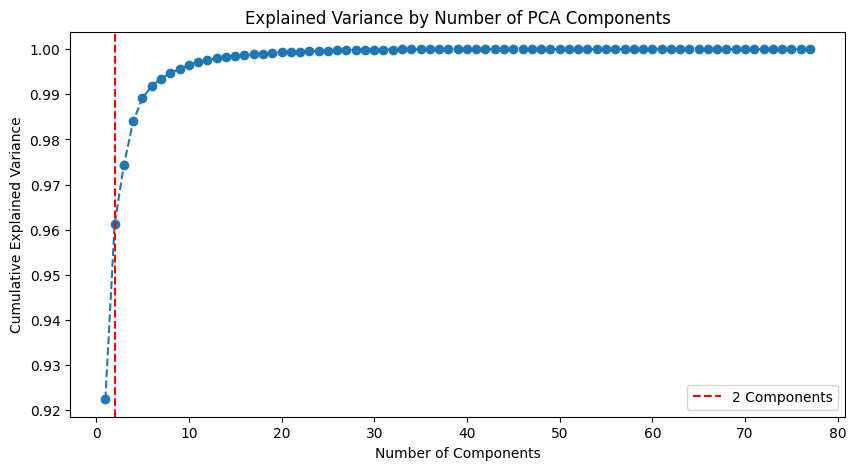

Shape of dataset after PCA: (5360, 2)


In [50]:
optimal_components = determine_optimal_components(X_under_sampled)

# Step 3: Apply PCA with the optimal number of components
pca = IncrementalPCA(n_components=optimal_components)  # Use IncrementalPCA to reduce memory usage
X_under_sampled_pca = pca.fit_transform(X_under_sampled)

# Step 4: Convert PCA-transformed datasets back to DataFrames
pca_columns = [f"PC{i+1}" for i in range(optimal_components)]
X_under_sampled_pca = pd.DataFrame(X_under_sampled_pca, columns=pca_columns)

# Print the shape of the transformed datasets
print(f"Shape of dataset after PCA: {X_under_sampled_pca.shape}")




### Feature Contribution Analysis for Principal Components

The contributions of original features to each principal component are analyzed to understand their importance. The top contributing features for each component are identified, providing insights into the dataset's most influential variables.

In [51]:
# Print the original features most associated with the principal components
feature_names = X_under_sampled.columns  
components = pd.DataFrame(
    pca.components_, 
    columns=feature_names, 
    index=[f"PC{i+1}" for i in range(optimal_components)]
)

# Display the top contributing features for each principal component
for i in range(optimal_components):
    print(f"\nTop contributing features for Principal Component {i+1}:")
    top_features = components.iloc[i].sort_values(ascending=False).head(10)  # Top 10 features
    print(top_features)



Top contributing features for Principal Component 1:
fwd_non_empty_pkt_cnt     0.428705
fwd_pkt_cnt               0.428401
fwd_bulk_pkt_mean         0.428142
fwd_subflow_pkt_mean      0.428117
fwd_pkt_hdr_len_tot       0.425774
fwd_subflow_bytes_mean    0.186490
fwd_bulk_bytes_mean       0.162699
fwd_pkt_len_tot           0.143470
fwd_iat_tot               0.020089
flow_duration             0.019865
Name: PC1, dtype: float64

Top contributing features for Principal Component 2:
fwd_iat_min     0.574745
fwd_iat_mean    0.423358
bwd_iat_min     0.326294
bwd_iat_mean    0.321632
iat_mean        0.246152
iat_std         0.242993
bwd_iat_max     0.162674
idle_max        0.149930
fwd_iat_max     0.149148
iat_max         0.146459
Name: PC2, dtype: float64


In [52]:
joblib.dump(X_under_sampled_pca,'last_X_under_sampled_pca.pkl')

['last_X_under_sampled_pca.pkl']

4. **Model Training**
   - Selecting and training machine learning models.
   - train models for both Multiclass classificaion and binary classification each one with both RUS strtegies  used  
   - Hyperparameter tuning for optimal performance.
5. **Model Evaluation**
   After training the model, we evaluate its performance using a variety of metrics. This is an important step to measure the model's ability to generalize to unseen data.

   - Performance metrics: accuracy, precision, recall, and F1 score.
   - Confusion matrix and ROC-AUC analysis.
   > **Accuracy**: The ratio of correctly predicted instances to the total instances.

   > **Precision**: The ability of the model to return only relevant instances for each class.

   > **Recall**: The ability of the model to identify all relevant instances for each class.

   > **F1-Score**: The harmonic mean of precision and recall.

In [2]:

def evaluate_model_with_roc(skf, X, y, model, classes):
    """
    Evaluates a model with Stratified K-Fold cross-validation, calculating metrics including ROC AUC.

    Parameters:
        skf: StratifiedKFold object
        X: Features dataframe
        y: Target series
        model: ML model (e.g., DecisionTreeClassifier)
        classes: List of class labels

    Returns:
        Metrics (accuracy, precision, recall, F1, confusion matrices, mean ROC) and a dictionary for ROC plotting.
    """
    # Initialize lists to store metrics
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    conf_matrices = []

    # For ROC
    y_binarized = label_binarize(y, classes=classes)
    n_classes = len(classes)
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []
    aucs = []

    for train_index, test_index in skf.split(X, y):
        # Split data
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Fit the model
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Calculate metrics
        accuracy_scores.append(accuracy_score(y_test, y_pred))
        precision_scores.append(precision_score(y_test, y_pred, average="weighted"))
        recall_scores.append(recall_score(y_test, y_pred, average="weighted"))
        f1_scores.append(f1_score(y_test, y_pred, average="weighted"))
        conf_matrices.append(confusion_matrix(y_test, y_pred, labels=classes))

        ##added for binary classification 
        
        if hasattr(model, "predict_proba"):
            y_prob = model.predict_proba(X_test)

            if n_classes == 2:  # Binary classification
                fpr, tpr, _ = roc_curve(y_test, y_prob[:, 1])  # Use only class 1 probability
                tpr_interp = np.interp(mean_fpr, fpr, tpr)
                tpr_interp[0] = 0.0
                tprs.append(tpr_interp)
                aucs.append(auc(fpr, tpr))
            else:  # Multi-class classification
                for i in range(n_classes):
                    fpr, tpr, _ = roc_curve(y_binarized[test_index][:, i], y_prob[:, i])
                    tpr_interp = np.interp(mean_fpr, fpr, tpr)
                    tpr_interp[0] = 0.0
                    tprs.append(tpr_interp)
                    aucs.append(auc(fpr, tpr))

    # Compute mean ROC
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)

    roc_data = {
        "mean_fpr": mean_fpr,
        "mean_tpr": mean_tpr,
        "mean_auc": mean_auc,
        "std_auc": std_auc
    }

    return (accuracy_scores, precision_scores, recall_scores, f1_scores, conf_matrices, roc_data)


In [3]:
def plot_roc_curve(roc_data, model):
    """
    Plots the ROC curve using precomputed ROC data.

    Parameters:
        roc_data: Dictionary with ROC metrics (mean FPR, mean TPR, mean AUC, std AUC).

    Returns:
        None
    """
    plt.figure(figsize=(10, 7))
    
    # Plot mean ROC curve
    plt.plot(
        roc_data["mean_fpr"], roc_data["mean_tpr"], color='b',
        label=f'Mean ROC (AUC = {roc_data["mean_auc"]:.2f} ± {roc_data["std_auc"]:.2f})', lw=2
    )
    
    # Plot chance line
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Chance', lw=2)
    
    # Customize plot
    plt.title(f'ROC Curve of {model}')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()


In [ ]:
# X_under_sampled_pca = joblib.load('last_X_under_sampled_pca.pkl')
# y_under_sampled = joblib.load('last_y_under_sampled.pkl')

In [10]:
print(X_under_sampled_pca.shape)

(5360, 4)
(5360,)


### k-Fold Cross-Validation Setup
This section sets up a 10-fold Stratified Cross-Validation with `StratifiedKFold`. The target variable will be used for stratified sampling to ensure that each fold has a similar distribution of classes.


In [55]:
# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_under_sampled.unique()  # List of unique classes (should be 10)
print(f"Number of classes: {len(classes)}")

Number of classes: 10


 ### **rewrite I will first evaluate the model with just using PCA not SFE-PCA**

### Decision Tree Classifier (DT)
The Decision Tree is a supervised learning algorithm used for classification and regression. It works by recursively splitting the dataset into subsets based on feature values. Key advantages include:
- **Interpretability**: Trees can be easily visualized and understood.
- **No Need for Feature Scaling**: It handles raw feature values without requiring normalization.


Decision Tree Metrics (Average over 10 Folds):
Accuracy: 0.9819
Precision: 0.9821
Recall: 0.9819
F1 Score: 0.9817


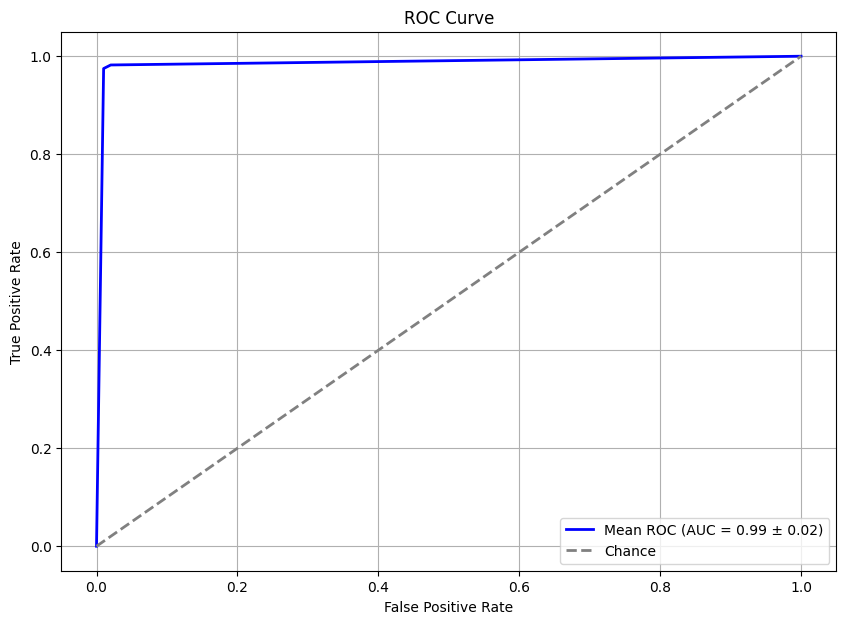

In [56]:
dt_model = DecisionTreeClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_pca, y_under_sampled, dt_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("Decision Tree Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve
plot_roc_curve(roc_data)


### Confusion Matrix Visualization
This section provides a function to plot confusion matrices The confusion matrix is a summary of prediction results on a classification task. It shows:
- **True Positives (TP)**: Correctly predicted positive instances.
- **True Negatives (TN)**: Correctly predicted negative instances.
- **False Positives (FP)**: Incorrectly predicted positive instances.
- **False Negatives (FN)**: Incorrectly predicted negative instances.

#### Function: Plot Multiclass Confusion Matrices
The `plot_multiclass_matrices` function is used to visualize the confusion matrices for a specific model (e.g., Decision Tree) across all cross-validation folds. This helps evaluate the performance of a model on a fold-by-fold basis. 
By visualizing confusion matrices for each fold, we gain insight into the performance of the model for each class across different data splits.

In [4]:
# Plot confusion matrices for each fold
def plot_conf_matrices(conf_matrices, title):
    for i, cm in enumerate(conf_matrices, 1):
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
        disp.plot(cmap=plt.cm.Blues)
        plt.title(f"{title}- Fold {i}")
        plt.show()


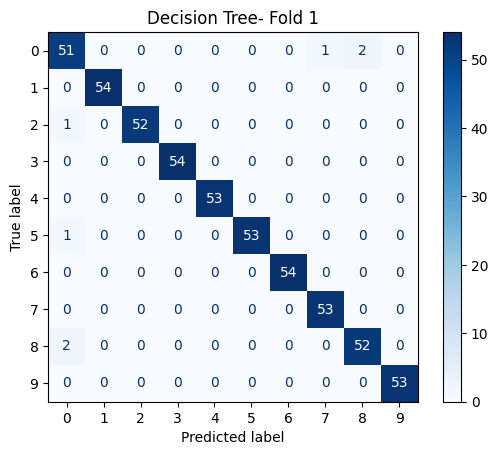

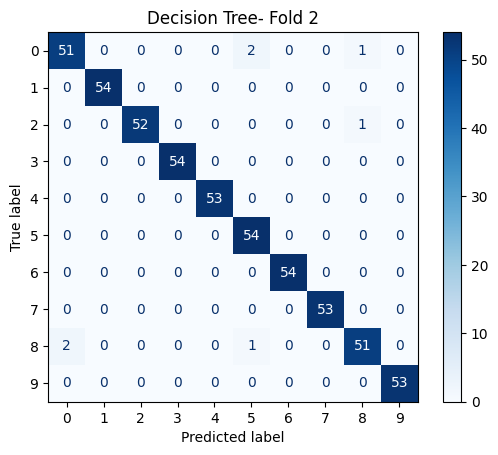

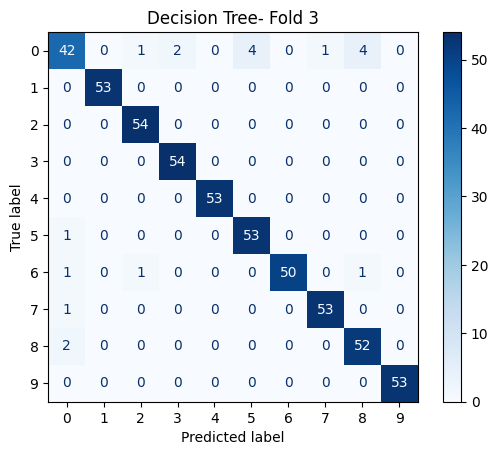

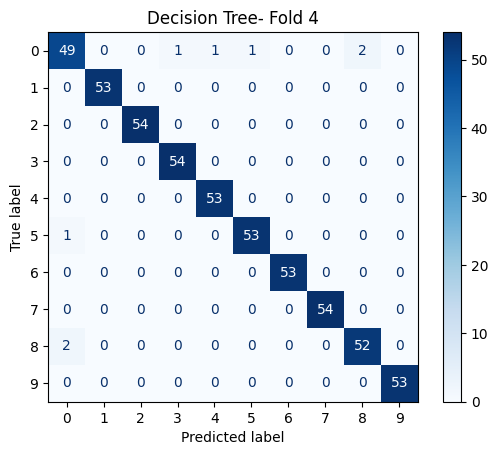

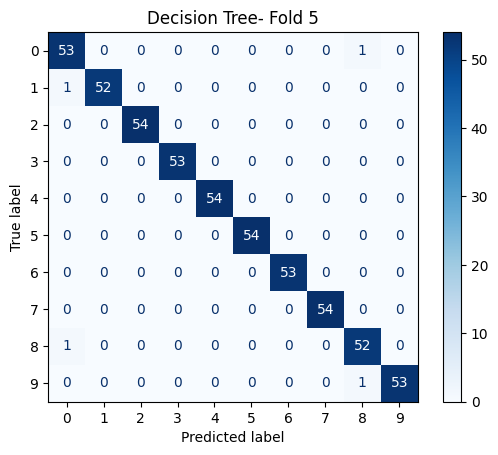

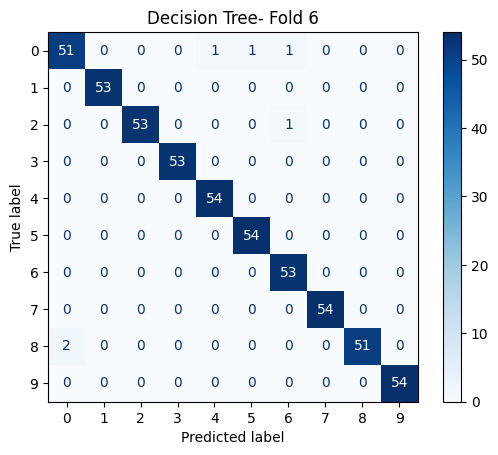

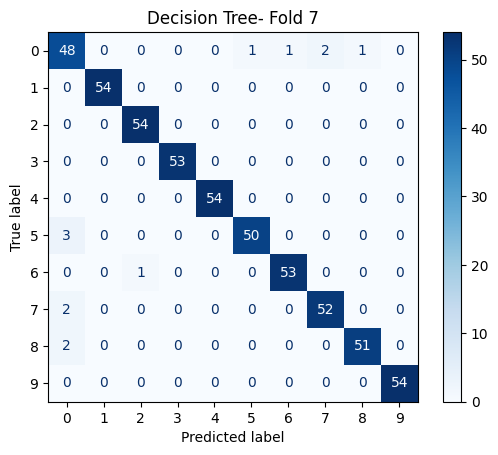

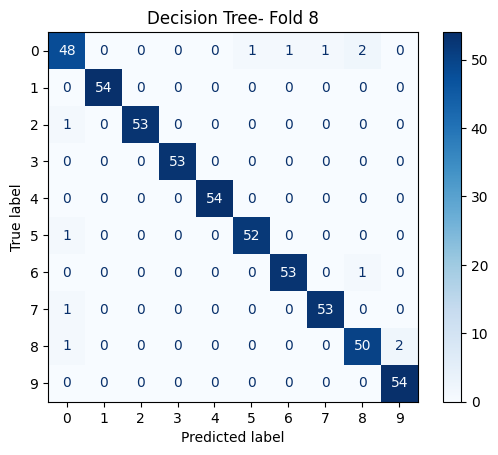

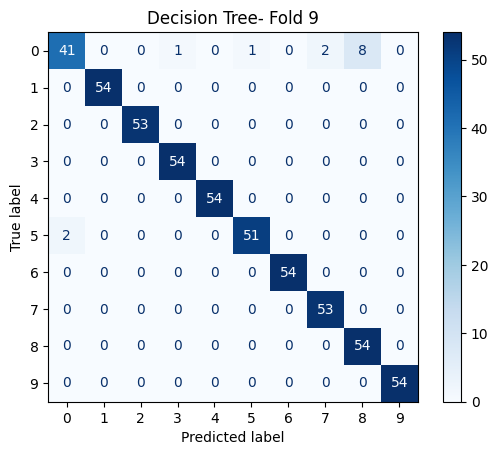

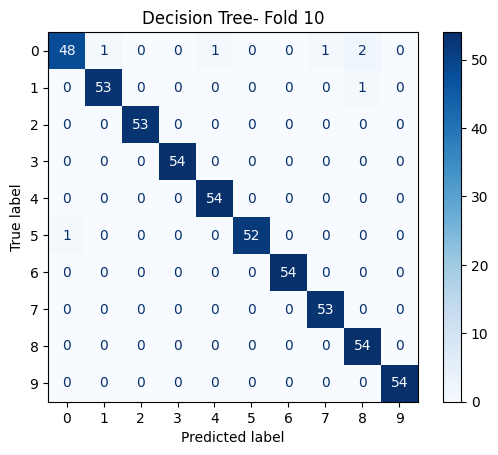

In [58]:
plot_conf_matrices(conf_matrices, "Decision Tree")


#### Aggregate Confusion Matrices Across Folds
To evaluate the overall performance of a model across all folds, we aggregate the confusion matrices by summing them up.


In [59]:
# Aggregate the confusion matrices from all folds
def aggregate_conf_matrices(conf_matrices):
# Initialize an empty confusion matrix to accumulate the results
    final_cm = np.zeros((len(classes), len(classes)), dtype=int)

    # Sum up all the confusion matrices
    for cm in conf_matrices:
        final_cm += cm
    return final_cm

In [5]:

# Plot the final confusion matrix
def plot_final_confusion_matrix(cm, title):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    fig, ax = plt.subplots(figsize=(12, 12))  # Adjust size for clarity
    disp.plot(cmap=plt.cm.Blues, ax=ax)
    
    # Adjust font size for better readability
    for text in ax.texts:
        text.set_fontsize(14)

    plt.title(title, fontsize=16)
    plt.xlabel("Predicted Labels", fontsize=14)
    plt.ylabel("True Labels", fontsize=14)
    plt.tight_layout()
    plt.show()


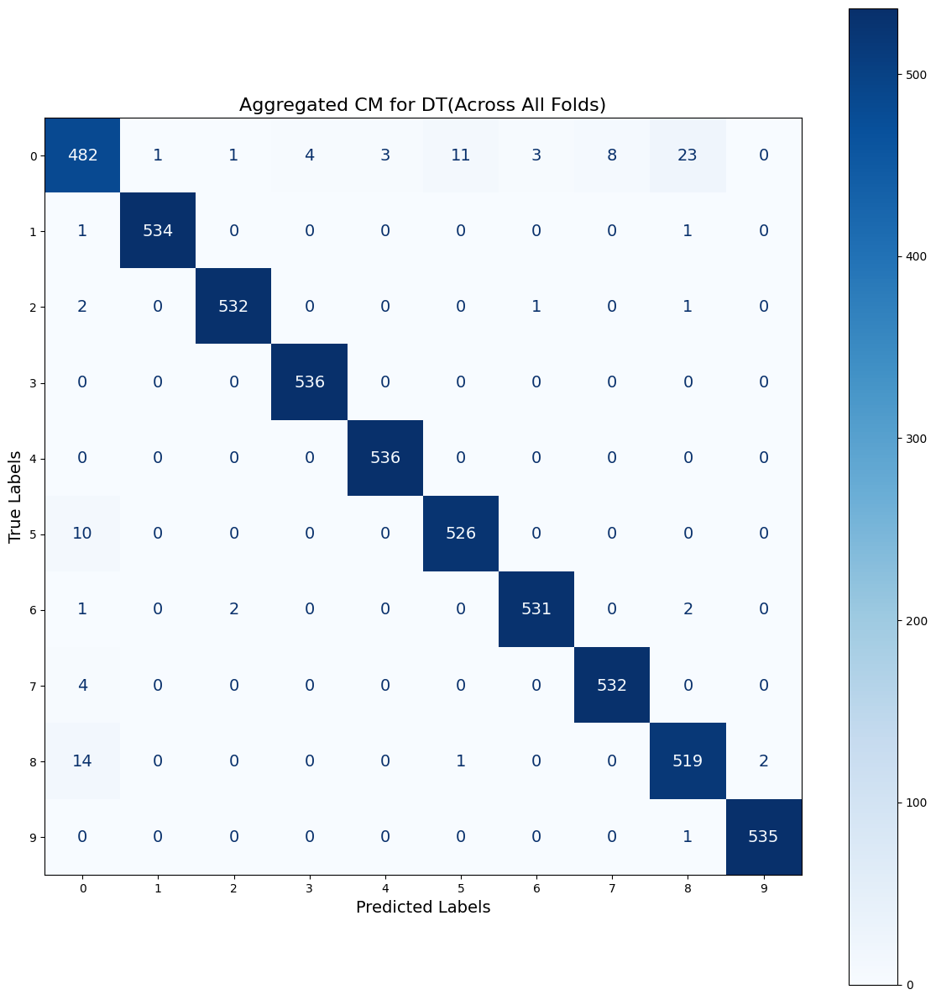

In [61]:
final_cm = aggregate_conf_matrices(conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "Aggregated CM for DT(Across All Folds)")


#### **rewrite Now I will evalute the model using SFE-PCA by using kmeans clustering**

### Determine Optimal Clusters using Silhouette Score

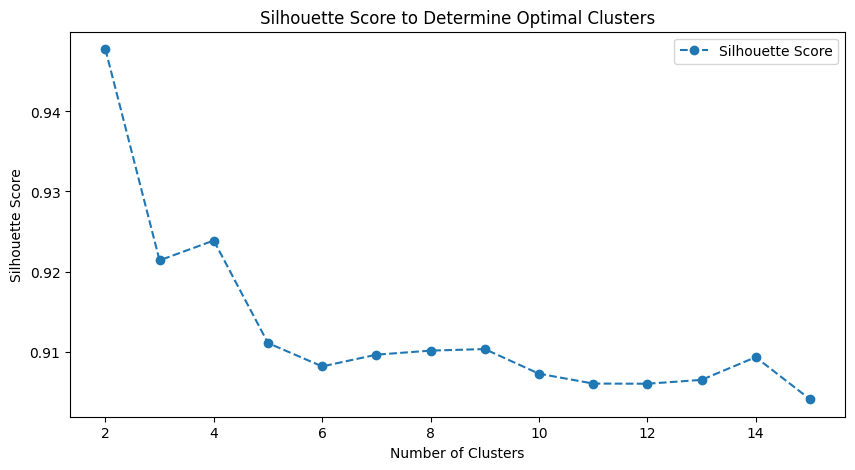

Optimal number of clusters based on silhouette score: 2
Cluster distribution in the data set: Kmeans_Cluster_Label
0    4849
1     511
Name: count, dtype: int64
shape after adding Kmeans Cluster label (5360, 3)


['last_X_under_sampled_SFE_PCA']

In [62]:
# Determine the optimal number of clusters
optimal_clusters = determine_optimal_clusters(X_under_sampled_pca)

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_under_sampled_pca['Kmeans_Cluster_Label'] = kmeans.fit_predict(X_under_sampled_pca)

# Print cluster distribution
print("Cluster distribution in the data set:", X_under_sampled_pca['Kmeans_Cluster_Label'].value_counts())
print(f'shape after adding Kmeans Cluster label {X_under_sampled_pca.shape}')
joblib.dump(X_under_sampled_pca,'last_X_under_sampled_SFE_PCA')


In [63]:
joblib.load('last_X_under_sampled_SFE_PCA').shape


(5360, 3)

Decision Tree Metrics (Average over 10 Folds):
Accuracy: 0.9821
Precision: 0.9824
Recall: 0.9821
F1 Score: 0.9819


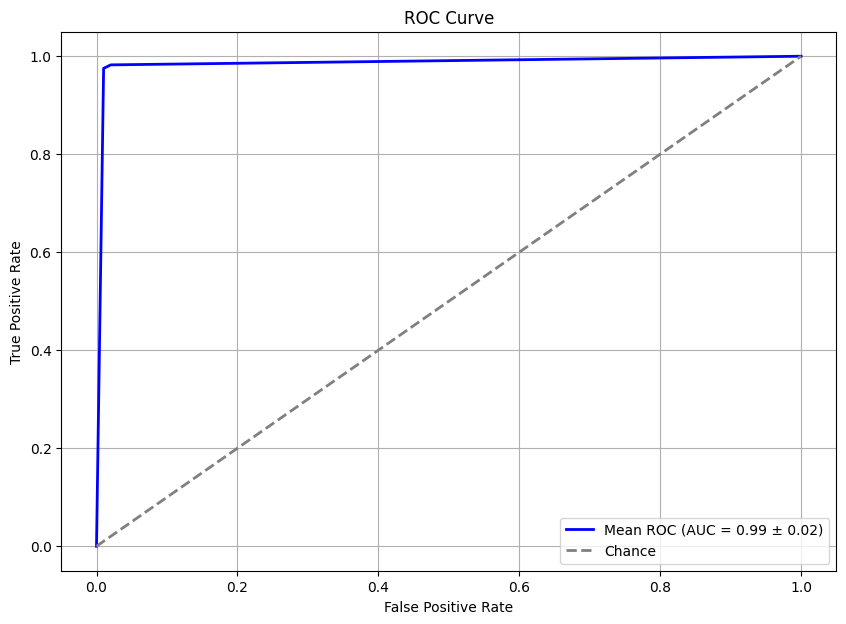

In [64]:
dt_model = DecisionTreeClassifier(random_state=42)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_pca, y_under_sampled, dt_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("Decision Tree Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve
plot_roc_curve(roc_data)


**rewrite results after using Kmeans clustering are slightly higher**
**now I would try adding also ** Gaussian Mixture (GM) ** clustering**

In [65]:
gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)

# Fit and predict cluster labels
X_under_sampled_pca['GMM_Cluster_Label'] = gmm.fit_predict(X_under_sampled_pca)

# Print cluster distribution
print("Gaussian Mixture cluster distribution in the dataset:\n", X_under_sampled_pca['GMM_Cluster_Label'].value_counts())
print(f'Shape after adding GM Cluster label: {X_under_sampled_pca.shape}')  # Should be (,6)

# Save the dataset with labels
joblib.dump(X_under_sampled_pca, 'last_X_under_sampled_SFE_PCA2')


Gaussian Mixture cluster distribution in the dataset:
 GMM_Cluster_Label
0    4849
1     511
Name: count, dtype: int64
Shape after adding GM Cluster label: (5360, 4)


['last_X_under_sampled_SFE_PCA2']

In [66]:
print(X_under_sampled_pca.nunique())


PC1                     5307
PC2                     5307
Kmeans_Cluster_Label       2
GMM_Cluster_Label          2
dtype: int64


**rewrite I will evaluate the model using 2 clustering methods (kmeans and GM clustering) in the SFE-PCA approach**

Decision Tree Metrics (Average over 10 Folds):
Accuracy: 0.9828
Precision: 0.9830
Recall: 0.9828
F1 Score: 0.9827


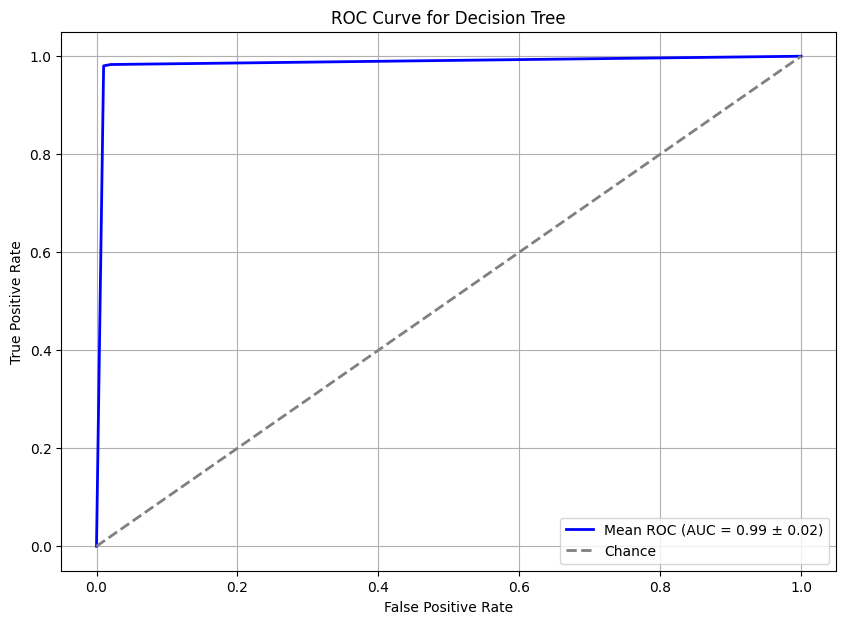

In [120]:
dt_model = DecisionTreeClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_pca, y_under_sampled, dt_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("Decision Tree Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve
plot_roc_curve(roc_data, 'Decision Tree')


**rewrite training the model using GM cluster with Kmeans cluster provide a higher mertices(accuracy, f1, recall, precision)**
so I willnow plot the CM for DT, and then apply other tree based models (RF,ET,XGB) using the SFE-PCA with 2 clustering which have a 2 more features(Kmeans_Cluster_Label, GMM_Cluster_Label ) 

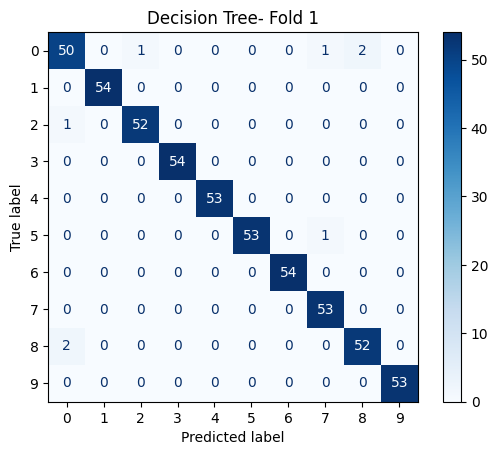

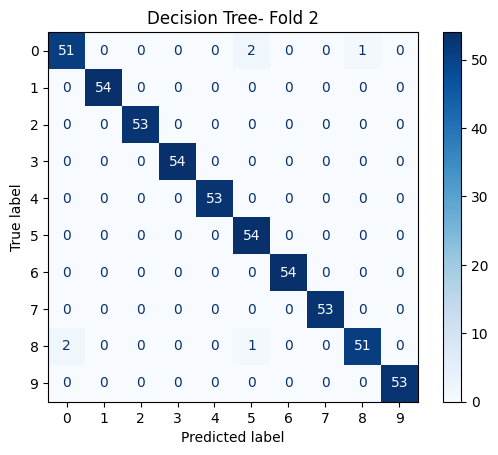

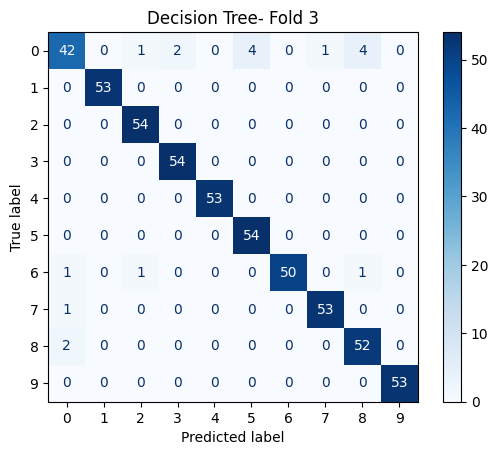

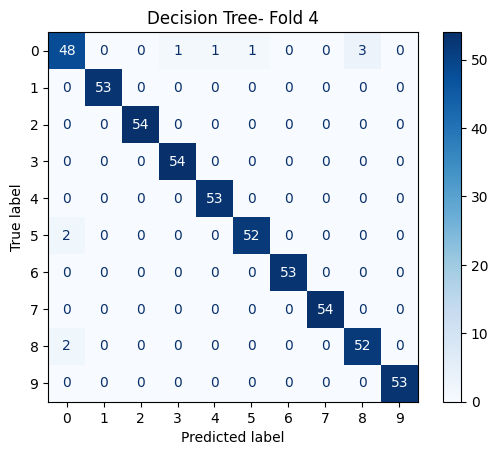

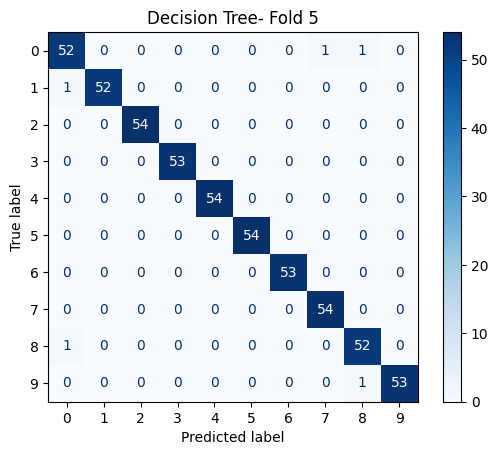

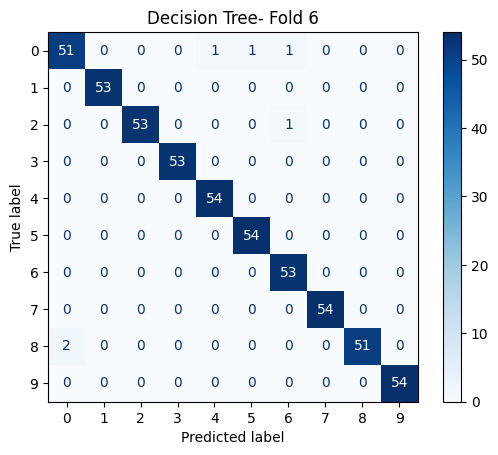

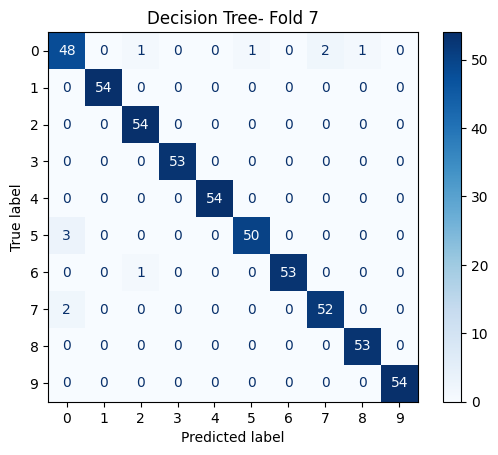

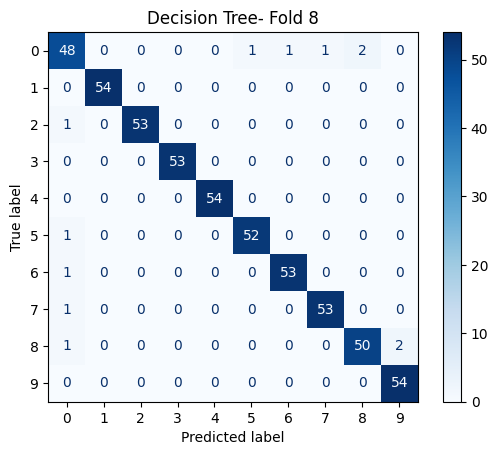

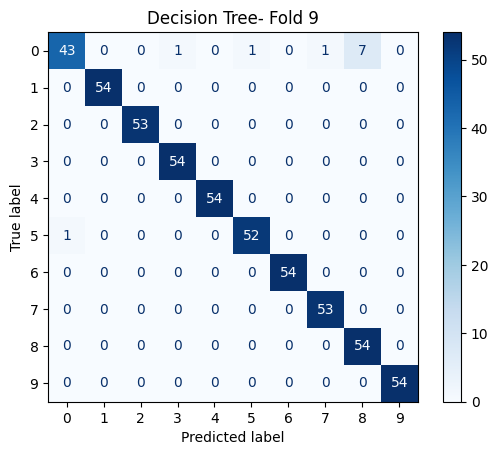

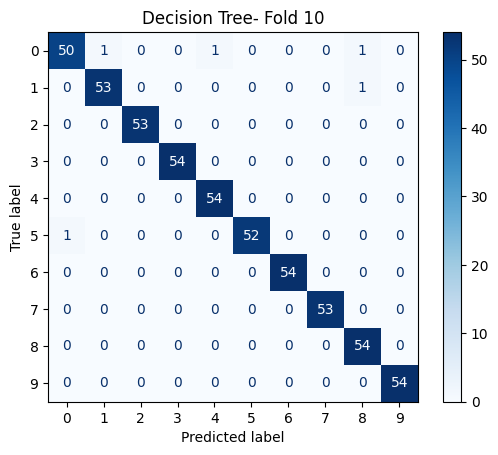

In [91]:
plot_conf_matrices(conf_matrices, "Decision Tree")

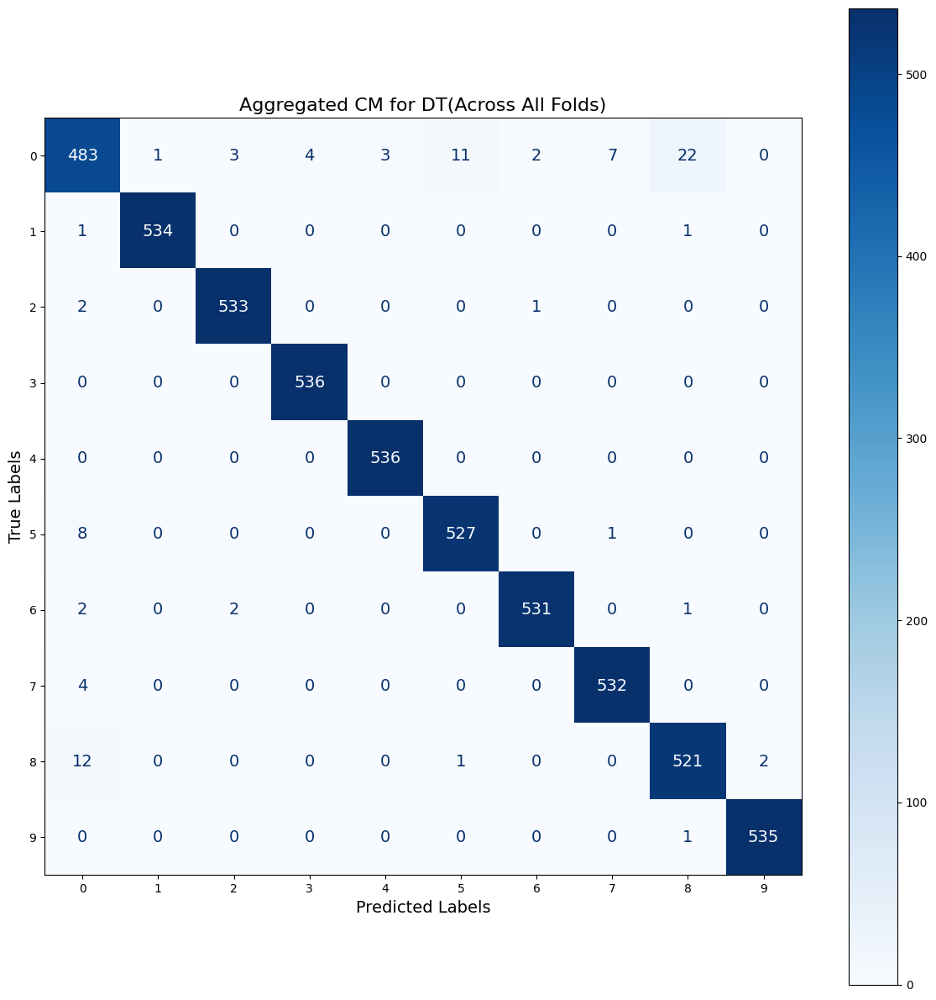

In [121]:
final_cm = aggregate_conf_matrices(conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "Aggregated CM for DT(Across All Folds)")

### Random Forest Classifier
Random Forest is an ensemble learning algorithm that combines multiple Decision Trees to improve performance and reduce overfitting. It operates by:
1. Randomly sampling subsets of the data (with replacement) to train individual trees (Bagging).
2. Using random subsets of features for each split in the trees.

Random Forest builds a "forest" of Decision Trees, where each tree votes on the final prediction. Key advantages include:
- **Reduced Overfitting**: Averaging across trees reduces variance.
- **High Performance**: It performs well on large datasets with complex relationships.

However, Random Forests are more computationally expensive than individual Decision Trees and less interpretable.


Random Forest Metrics (Average over 10 Folds):
Accuracy: 0.9871
Precision: 0.9873
Recall: 0.9871
F1 Score: 0.9870


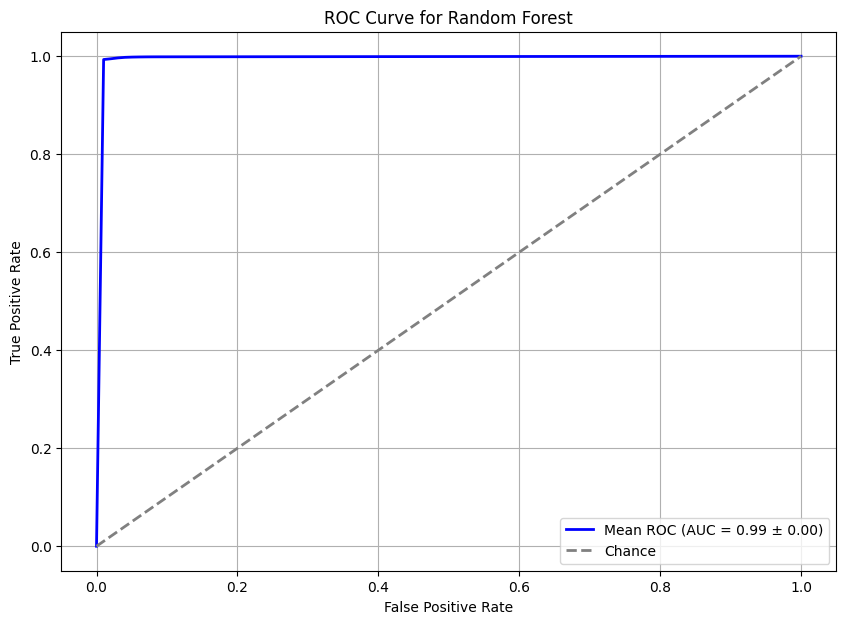

In [122]:
rf_model = RandomForestClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_pca, y_under_sampled, rf_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("Random Forest Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve
plot_roc_curve(roc_data, 'Random Forest')


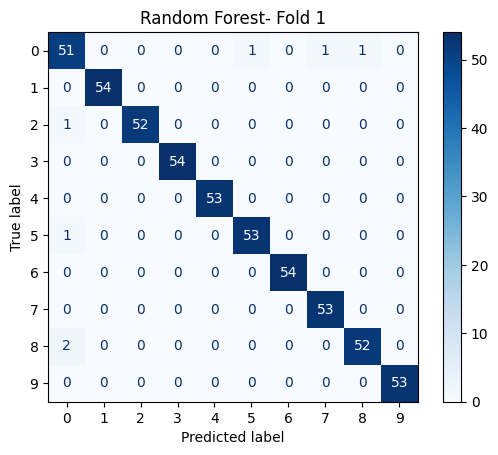

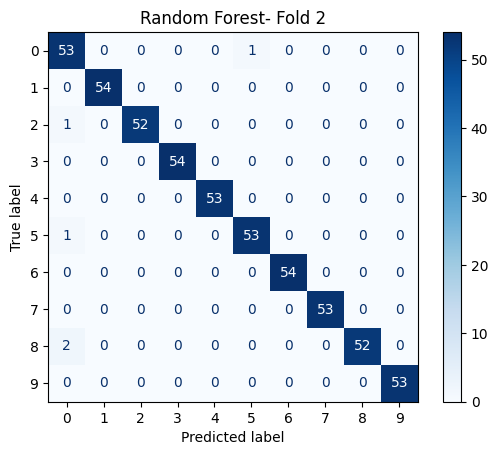

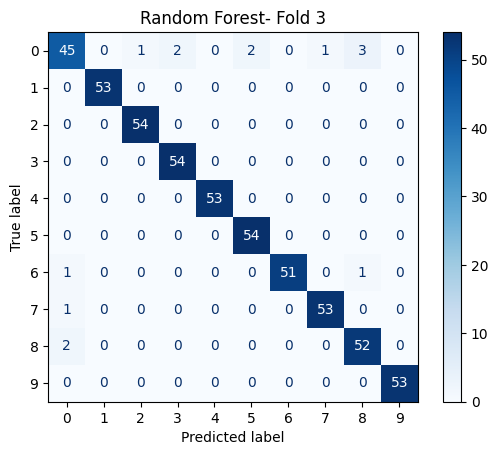

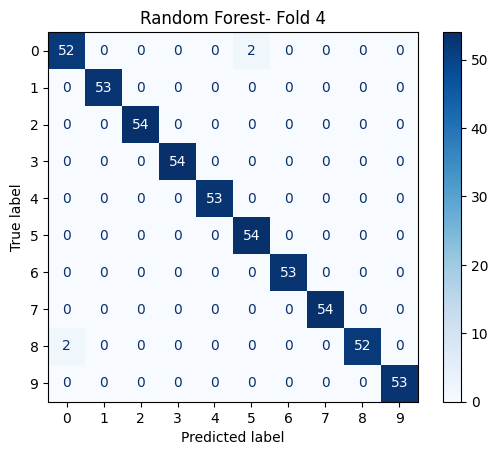

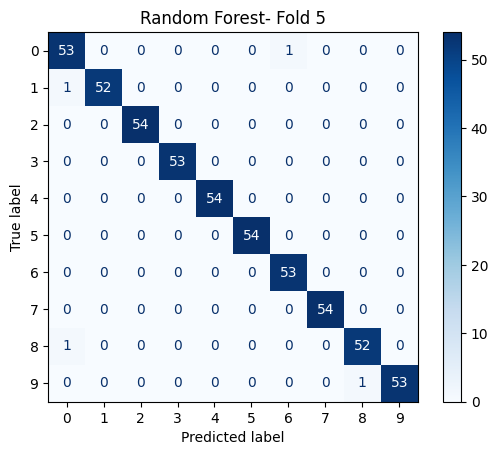

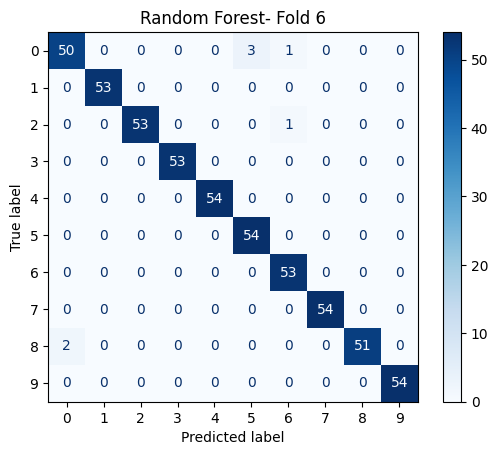

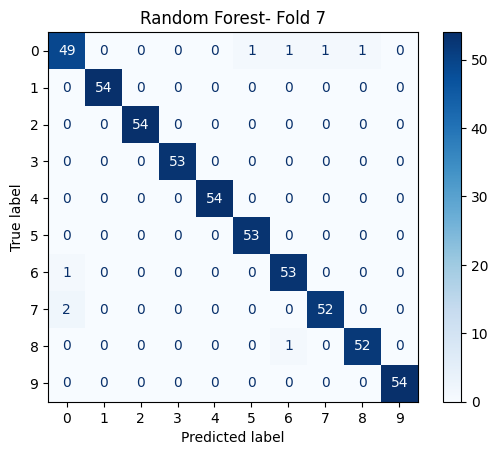

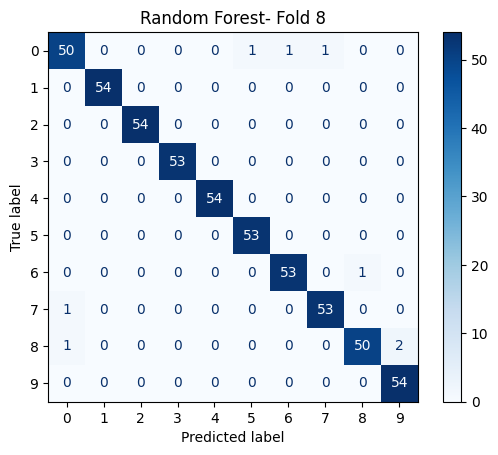

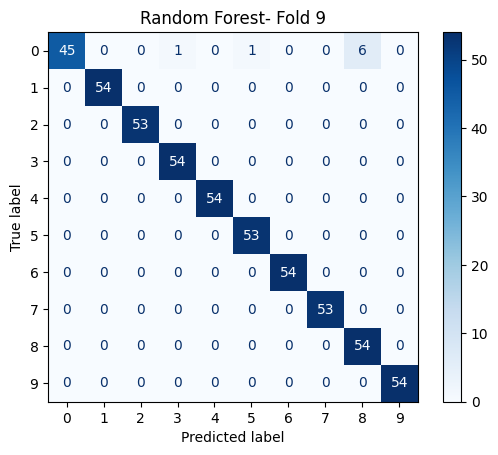

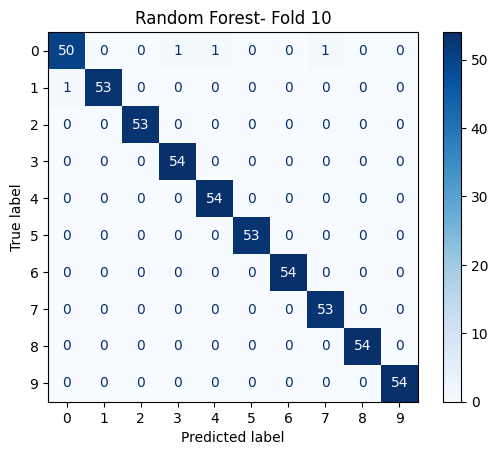

In [101]:
plot_conf_matrices(conf_matrices, "Random Forest")

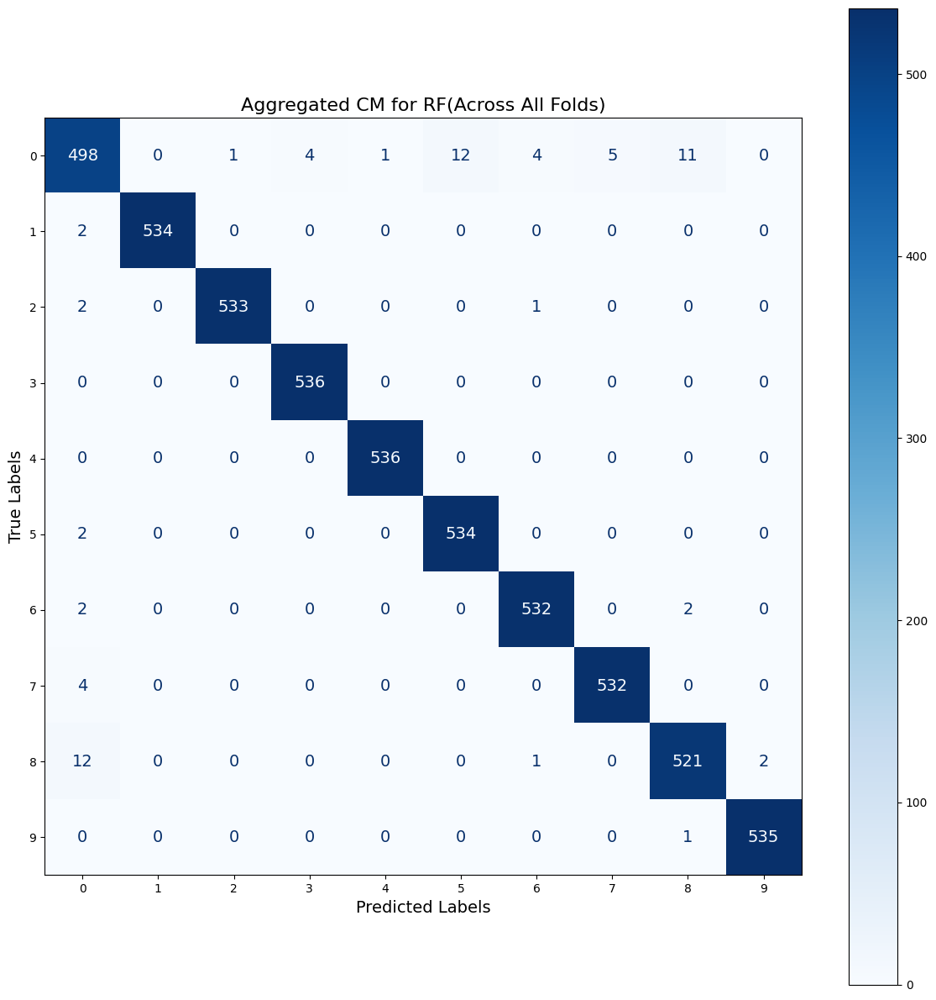

In [110]:
final_cm = aggregate_conf_matrices(conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "Aggregated CM for RF(Across All Folds)")

In [20]:
X_under_sampled_pca = joblib.load('last_X_under_sampled_SFE_PCA2')
y_under_sampled = joblib.load('last_y_under_sampled.pkl')

In [21]:
print(X_under_sampled_pca.shape)
print(y_under_sampled.shape)

(5360, 4)
(5360,)


In [30]:
# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_under_sampled.unique()  # List of unique classes (should be 10)

#### **Extra Trees**
The Extra Trees classifier enhances Random Forest by introducing more randomness during the tree-building process. Key strengths include:
- **Efficiency**: Faster than Random Forest due to simplified split computations.
- **Robustness**: Reduces variance and overfitting compared to individual Decision Trees.
1. Splitting data using stratified k-fold cross-validation.
2. Training the ET model on each fold and evaluating its predictions.
3. Computing metrics like Accuracy, Precision, Recall, and F1-Score.
4. Analyzing confusion matrices to visualize model performance.

Extra Tree Metrics (Average over 10 Folds):
Accuracy: 0.9879
Precision: 0.9880
Recall: 0.9879
F1 Score: 0.9878


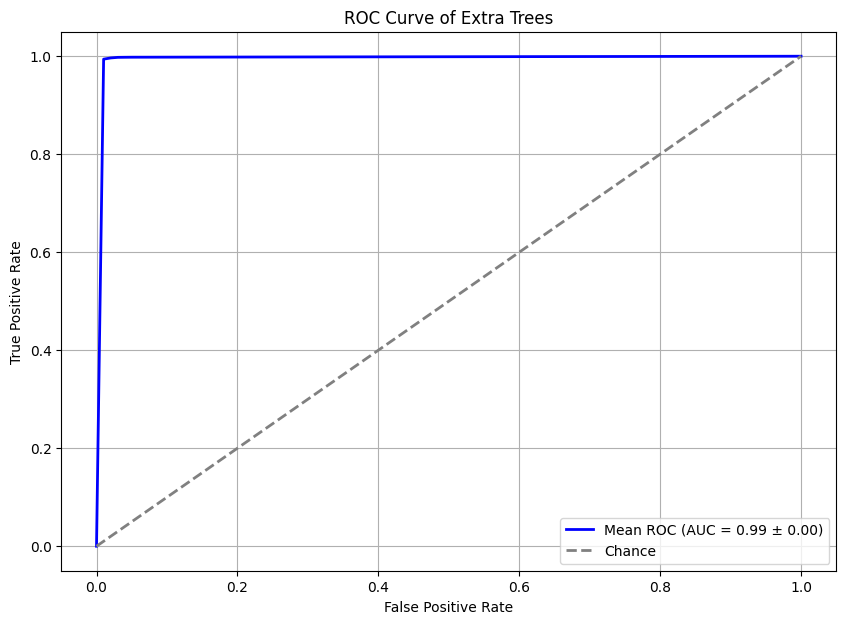

In [33]:
et_model = ExtraTreesClassifier(random_state=42)
# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_pca, y_under_sampled, et_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("Extra Tree Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve
plot_roc_curve(roc_data, 'Extra Trees')


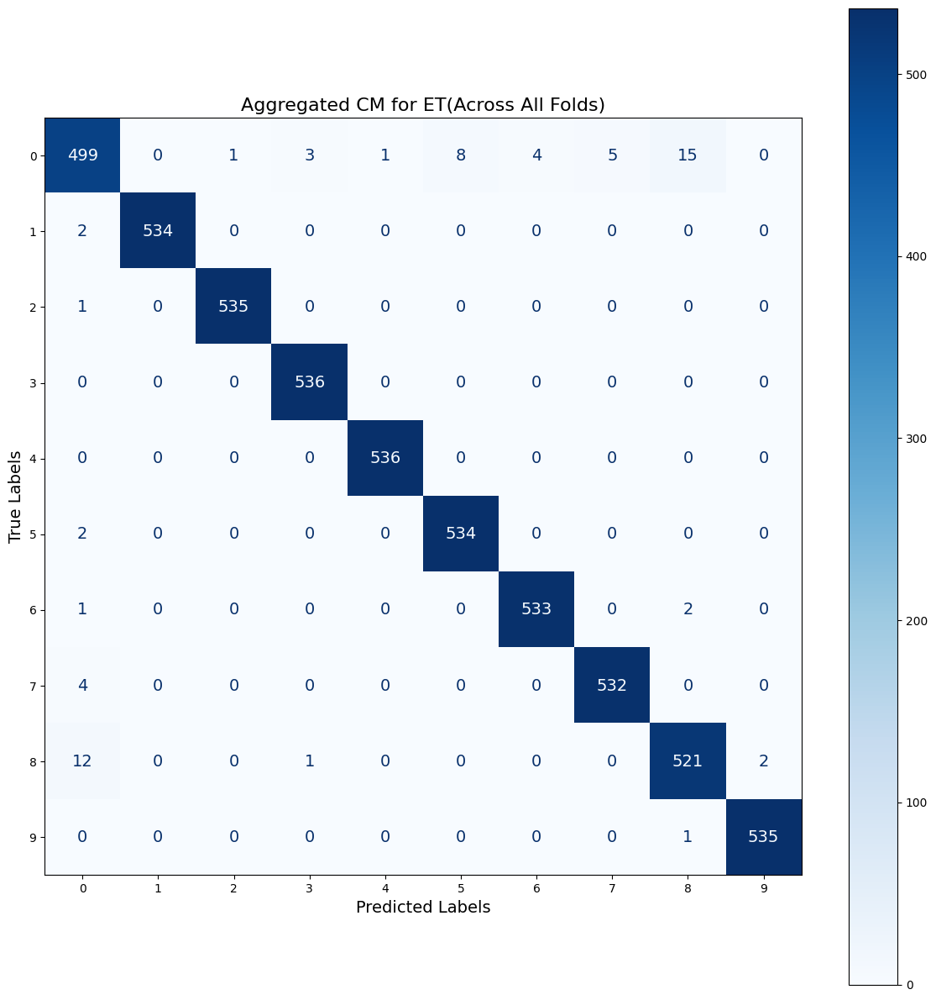

In [34]:
final_cm = aggregate_conf_matrices(conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "Aggregated CM for ET(Across All Folds)")

#### **Extreme Gradient Boosting (XGB) Training and Evaluation**
Extreme Gradient Boosting (XGBoost) is a powerful and efficient implementation of gradient-boosted Decision Trees. It builds models sequentially, where each tree corrects the errors of the previous one. Training and evaluation steps include:
 Key advantages include:
- **Performance**: Regularization techniques like L1/L2 penalties reduce overfitting.
- **Flexibility**: Handles missing data and sparse features seamlessly.
- **Speed**: Optimized for parallel computation.

XGBoost Metrics (Average over 10 Folds):
Accuracy: 0.9858
Precision: 0.9859
Recall: 0.9858
F1 Score: 0.9857


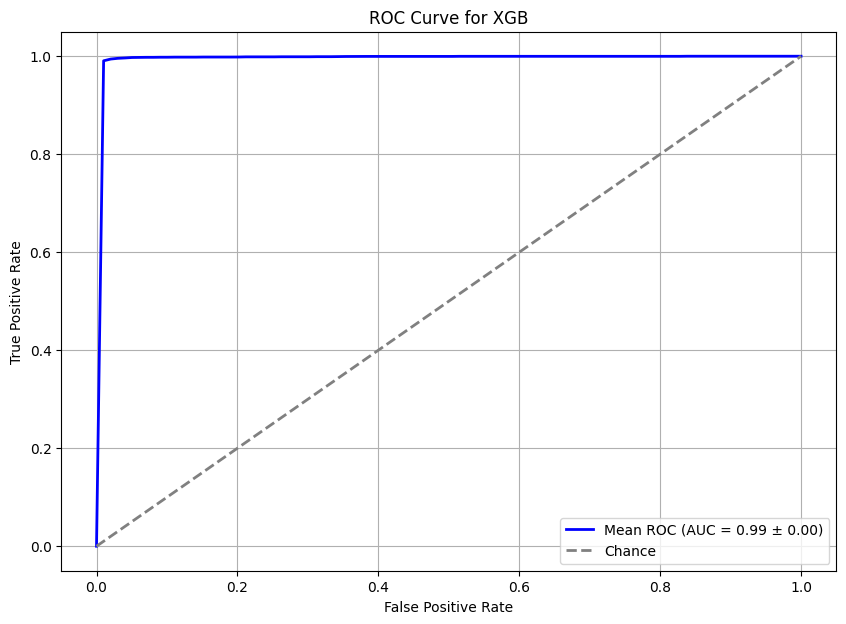

In [ ]:
xgb_model = XGBClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_pca, y_under_sampled, xgb_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("XGBoost Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve
plot_roc_curve(roc_data, 'XGB')


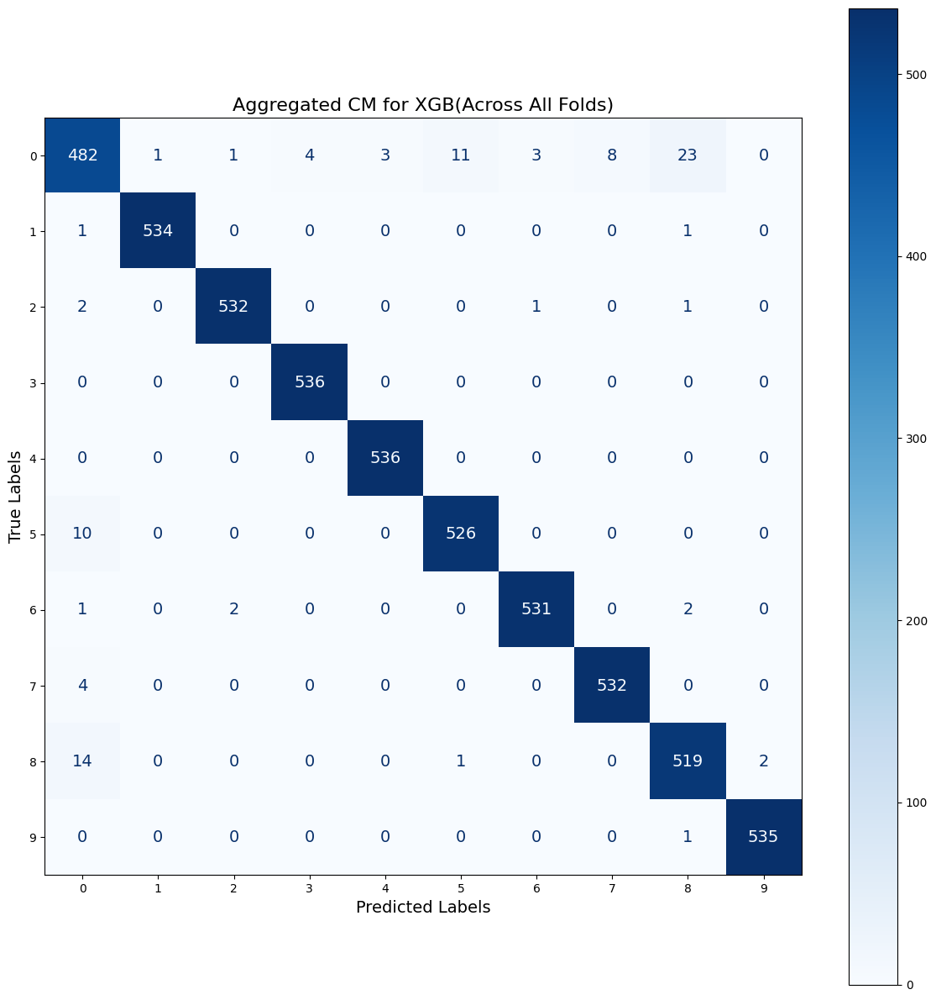

In [106]:
aggregate_conf_matrices(conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "Aggregated CM for XGB(Across All Folds)")


--- Outlier Summary ---
dst_port: 1905 outliers
ip_prot: 0 outliers
flow_duration: 36678 outliers
down_up_ratio: 2055 outliers
pkt_len_max: 13949 outliers
pkt_len_min: 3892 outliers
pkt_len_mean: 11362 outliers
pkt_len_var: 12048 outliers
pkt_len_std: 13600 outliers
bytes_per_s: 230 outliers
pkt_per_s: 211 outliers
fwd_pkt_per_s: 191 outliers
bwd_pkt_per_s: 368 outliers
fwd_pkt_cnt: 104 outliers
fwd_pkt_len_tot: 1165 outliers
fwd_pkt_len_max: 6929 outliers
fwd_pkt_len_min: 4014 outliers
fwd_pkt_len_mean: 4668 outliers
fwd_pkt_len_std: 6835 outliers
fwd_pkt_hdr_len_tot: 175 outliers
fwd_pkt_hdr_len_min: 92 outliers
fwd_non_empty_pkt_cnt: 90 outliers
bwd_pkt_cnt: 282 outliers
bwd_pkt_len_tot: 282 outliers
bwd_pkt_len_max: 7020 outliers
bwd_pkt_len_min: 731 outliers
bwd_pkt_len_mean: 7014 outliers
bwd_pkt_len_std: 7018 outliers
bwd_pkt_hdr_len_tot: 280 outliers
bwd_pkt_hdr_len_min: 0 outliers
bwd_non_empty_pkt_cnt: 269 outliers
iat_max: 26302 outliers
iat_min: 265 outliers
iat_mean: 7300

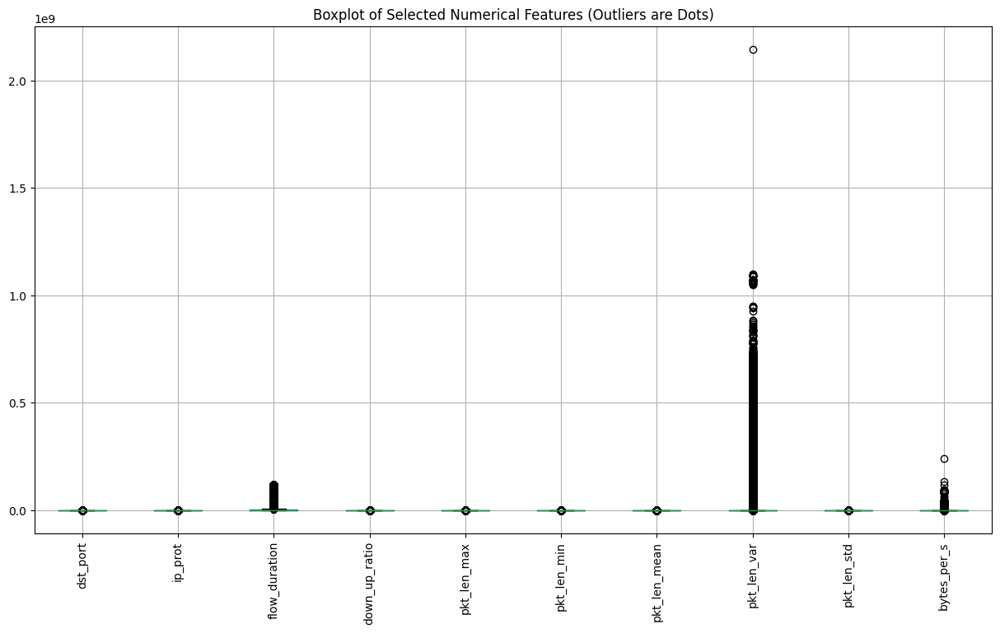


Total outliers detected: 476003 (95.20% of data)
⚠️ High number of outliers detected. Consider removing or transforming them.


In [4]:
from scipy.stats import zscore
# Define batch size for processing
BATCH_SIZE = 10  # Adjust based on memory availability

# Sample the dataset (optional, only if memory issues persist)
SAMPLE_SIZE = 500000  # Adjust based on dataset size
df_sample = df.sample(n=SAMPLE_SIZE, random_state=42) if len(df) > SAMPLE_SIZE else df

# Select only numerical features
numerical_features = df_sample.select_dtypes(include=[np.number])

# Dictionary to store outlier counts
outlier_info = {}

# Process columns in batches
num_columns = numerical_features.columns.tolist()
for i in range(0, len(num_columns), BATCH_SIZE):
    batch_columns = num_columns[i:i + BATCH_SIZE]
    batch_data = numerical_features[batch_columns]

    # Compute Z-score
    z_scores = np.abs(zscore(batch_data))

    # Identify outliers (Z-score threshold > 3)
    outliers = (z_scores > 3).sum(axis=0)

    # Store outlier counts
    outlier_info.update(dict(zip(batch_columns, outliers)))

# Print outlier summary
print("\n--- Outlier Summary ---")
total_outliers = sum(outlier_info.values())
for feature, count in outlier_info.items():
    print(f"{feature}: {count} outliers")

# Plot boxplots for a subset of numerical features (first 10 to reduce memory usage)
plt.figure(figsize=(15, 8))
df_sample[num_columns[:10]].boxplot(rot=90)
plt.title("Boxplot of Selected Numerical Features (Outliers are Dots)")
plt.show()

# Print recommendation on outlier removal
total_data = len(df_sample)
outlier_percentage = (total_outliers / total_data) * 100

print(f"\nTotal outliers detected: {total_outliers} ({outlier_percentage:.2f}% of data)")

if outlier_percentage > 5:
    print("⚠️ High number of outliers detected. Consider removing or transforming them.")
else:
    print("✅ Low number of outliers detected. Outlier removal may not be necessary.")


rewrite this isn't considered outliers in intrusions

## *Multiclass Classification - Stratified RUS*

In [15]:
X = joblib.load('last_scaled_X64.pkl')
y = joblib.load('last_y_encoded.pkl')

rewrite 
stratified RUS: maintain the representation of each class as it better relflects real world data where imbalance occurs

In [16]:
undersampling_strategy={}
for i in range(9):
    undersampling_strategy[i] = Counter(y)[i]//10
undersampling_strategy

{0: 707415,
 1: 9610,
 2: 107437,
 3: 28932,
 4: 238,
 5: 2686,
 6: 180296,
 7: 926,
 8: 53}

rewrite apply stratified under-sampling then apply SFE-PCA for SFE kmeans and GM clustering 
1- apply PCA
2- cluster formation
3- feature embedded
4- add clustering info as meat features for enhanced data representation

Original class distribution:
 Counter({0: 7074151, 6: 1802966, 2: 1074376, 3: 289328, 1: 96100, 9: 92625, 5: 26861, 7: 9265, 4: 2382, 8: 536})
Sampled class distribution:
 Counter({0: 707415, 6: 180296, 2: 107437, 9: 92625, 3: 28932, 1: 9610, 5: 2686, 7: 926, 4: 238, 8: 53})


C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_2940\2062140680.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


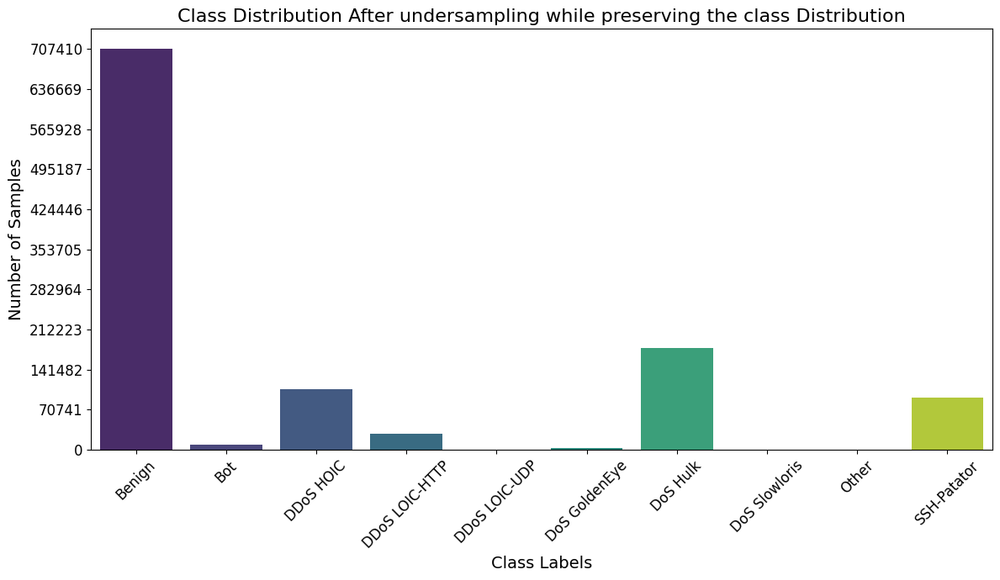

C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_2940\1494391586.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(


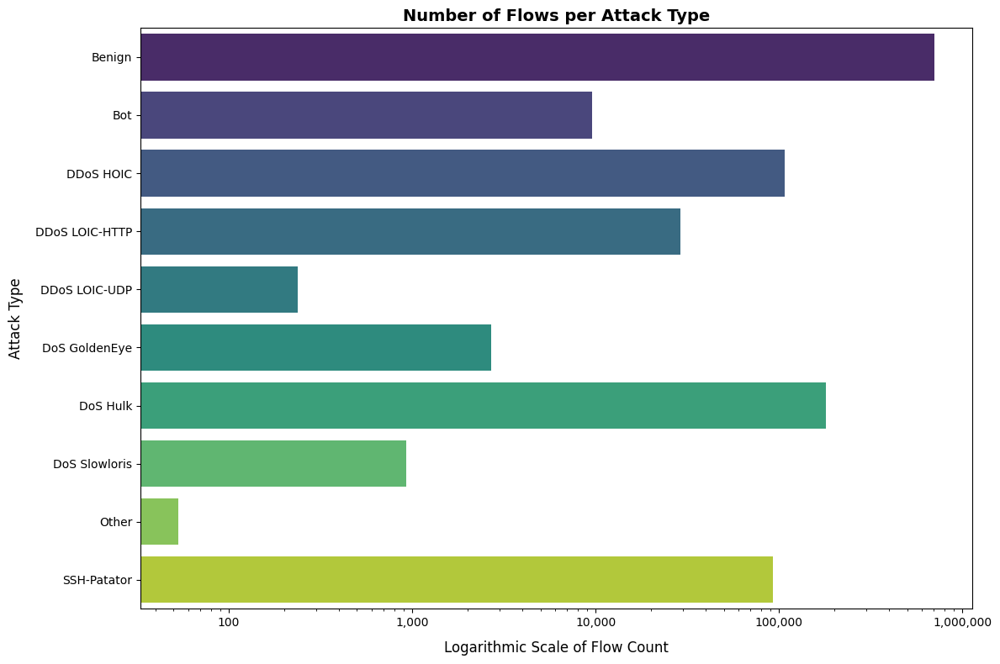

Number of components to retain 95.0% variance: 25


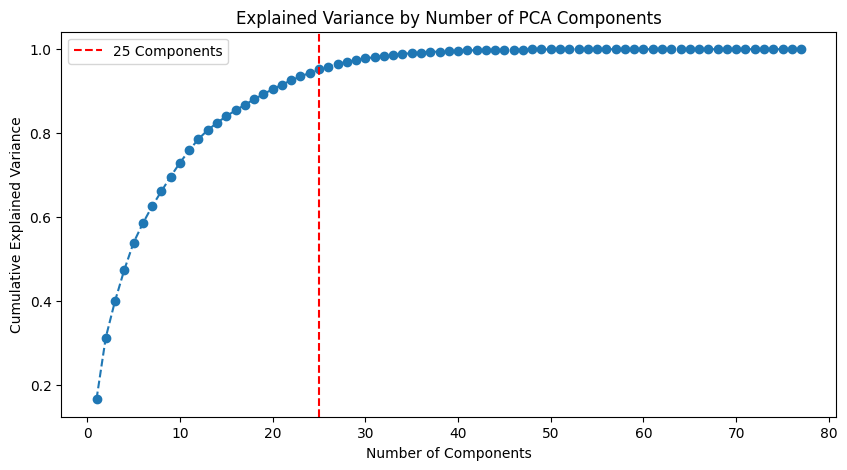

Shape of dataset after PCA: (1130218, 25)

Top contributing features for Principal Component 1:
bwd_flag_psh              0.369224
flag_psh                  0.345400
bwd_pkt_hdr_len_tot       0.305681
bwd_pkt_cnt               0.304915
bwd_non_empty_pkt_cnt     0.303368
bwd_pkt_len_tot           0.291213
flag_ack                  0.289227
bwd_subflow_pkt_mean      0.234200
bwd_subflow_bytes_mean    0.224948
bwd_bulk_pkt_mean         0.135067
Name: PC1, dtype: float64

Top contributing features for Principal Component 2:
idle_max         0.251732
idle_mean        0.250775
iat_max          0.250311
fwd_iat_max      0.248874
iat_std          0.247604
idle_min         0.246276
bwd_iat_max      0.245317
fwd_iat_std      0.239079
flow_duration    0.222915
fwd_iat_tot      0.220743
Name: PC2, dtype: float64

Top contributing features for Principal Component 3:
pkt_len_std         0.326110
pkt_len_var         0.318647
pkt_len_mean        0.315018
pkt_len_max         0.306733
fwd_pkt_len_mean  

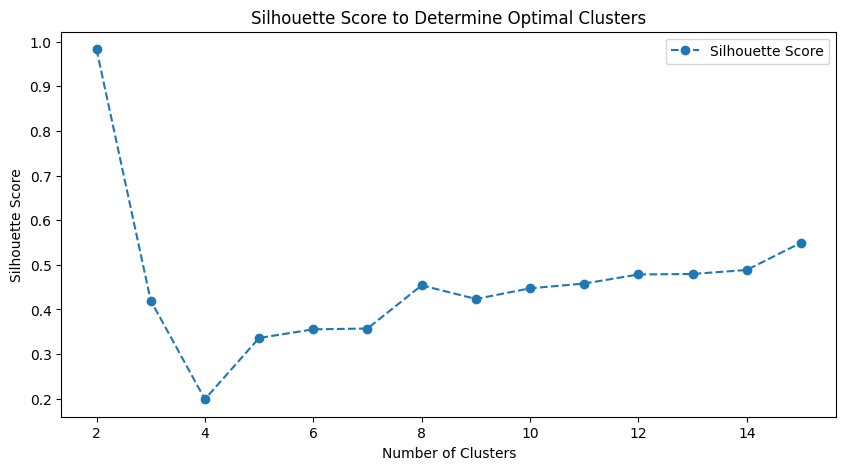

Optimal number of clusters based on silhouette score: 2
Kmeans Cluster distribution:
 Kmeans_Cluster_Label
1    1005021
0     125197
Name: count, dtype: int64
shape after adding Kmeans Cluster label (1130218, 26)
Gaussian Mixture cluster distribution:
 GMM_Cluster_Label
1    1005021
0     125197
Name: count, dtype: int64
Shape after adding GM Cluster label: (1130218, 27)


In [23]:
undersampler = RandomUnderSampler(sampling_strategy=undersampling_strategy, random_state=42)
X_under_sampled_preserve, y_under_sampled_preserve = undersampler.fit_resample(X, y)

print('Original class distribution:\n', Counter(y))
print('Sampled class distribution:\n', Counter(y_under_sampled_preserve))

label_mapping = {0: 'Benign', 1: 'Bot', 2: 'DDoS HOIC', 3: 'DDoS LOIC-HTTP', 4: 'DDoS LOIC-UDP', 5: 'DoS GoldenEye', 6: 'DoS Hulk', 7: 'DoS Slowloris', 8: 'Other', 9: 'SSH-Patator'}

class_distribution_sampling(y_under_sampled_preserve, label_mapping, title="Class Distribution After undersampling while preserving the class Distribution")
ClassDistribution1(X_under_sampled_preserve, y_under_sampled_preserve, label_mapping)

optimal_components = determine_optimal_components(X_under_sampled_preserve)

# Step 3: Apply PCA with the optimal number of components
pca = IncrementalPCA(n_components=optimal_components)  # Use IncrementalPCA to reduce memory usage
X_under_sampled_preserve_pca = pca.fit_transform(X_under_sampled_preserve)

# Step 4: Convert PCA-transformed datasets back to DataFrames
pca_columns = [f"PC{i+1}" for i in range(optimal_components)]
X_under_sampled_preserve_pca = pd.DataFrame(X_under_sampled_preserve_pca, columns=pca_columns)

# Print the shape of the transformed datasets
print(f"Shape of dataset after PCA: {X_under_sampled_preserve_pca.shape}")



# Print the original features most associated with the principal components
feature_names = X_under_sampled_preserve.columns  # Assuming X_resampled is a DataFrame with feature names
components = pd.DataFrame(
    pca.components_, 
    columns=feature_names, 
    index=[f"PC{i+1}" for i in range(optimal_components)]
)

# Display the top contributing features for each principal component
for i in range(optimal_components):
    print(f"\nTop contributing features for Principal Component {i+1}:")
    top_features = components.iloc[i].sort_values(ascending=False).head(10)  # Top 10 features
    print(top_features)

sample_size = 10000
X_sampled = X_under_sampled_preserve_pca.sample(n=sample_size, random_state=42)


# Determine the optimal number of clusters
# optimal_clusters = determine_optimal_clusters(X_resampled_pca)
optimal_clusters = determine_optimal_clusters(X_sampled)

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_under_sampled_preserve_pca['Kmeans_Cluster_Label'] = kmeans.fit_predict(X_under_sampled_preserve_pca)
# Print cluster distribution
print("Kmeans Cluster distribution:\n", X_under_sampled_preserve_pca['Kmeans_Cluster_Label'].value_counts())
print(f'shape after adding Kmeans Cluster label {X_under_sampled_preserve_pca.shape}')

gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
# Fit and predict cluster labels
X_under_sampled_preserve_pca['GMM_Cluster_Label'] = gmm.fit_predict(X_under_sampled_preserve_pca)

# Save the dataset with SFE-PCA
joblib.dump(X_under_sampled_preserve_pca, 'last_X_under_sampled_preserve_pca.pkl')
joblib.dump(y_under_sampled_preserve, 'last_y_under_sampled_preserve.pkl')

# Print cluster distribution
print("Gaussian Mixture cluster distribution:\n", X_under_sampled_preserve_pca['GMM_Cluster_Label'].value_counts())
print(f'Shape after adding GM Cluster label: {X_under_sampled_preserve_pca.shape}')  # Should be (,6)



In [18]:
# Save the dataset with SFE-PCA
X_under_sampled_preserve_pca = joblib.load('last_X_under_sampled_preserve_pca.pkl')
y_under_sampled_preserve = joblib.load('last_y_under_sampled_preserve.pkl')

Number of classes: 10
XGBoost Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):
Accuracy: 0.9989
Precision: 0.9990
Recall: 0.9989
F1 Score: 0.9989


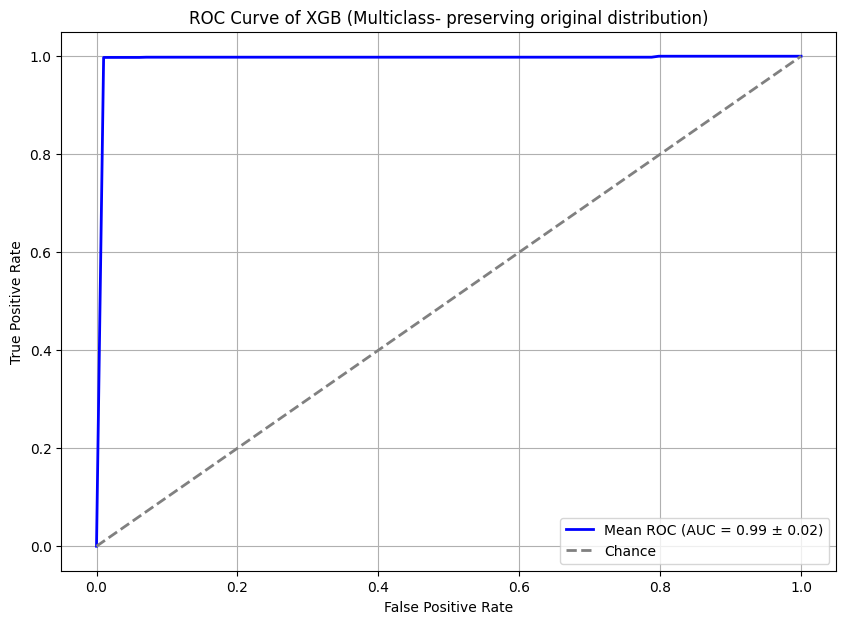

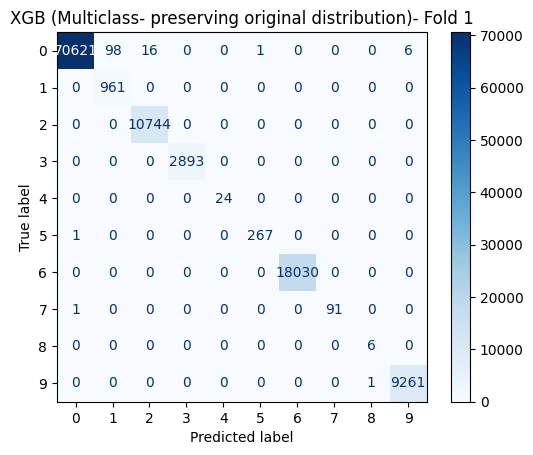

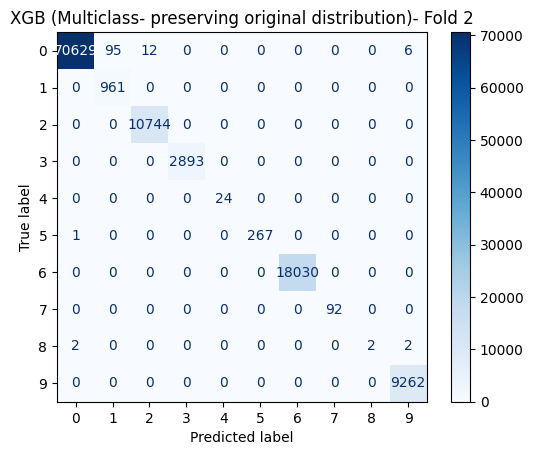

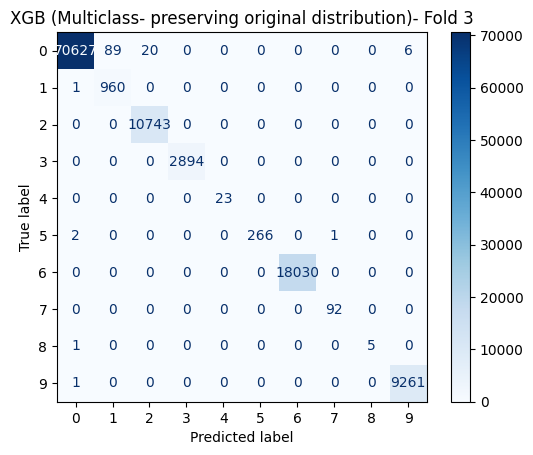

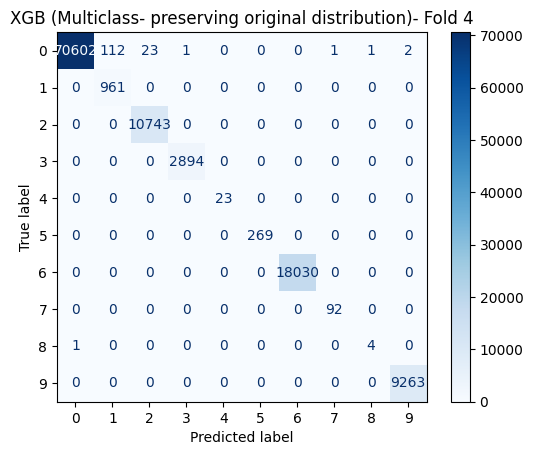

...

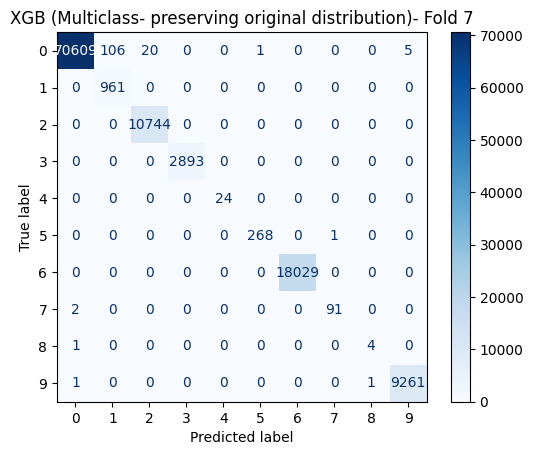

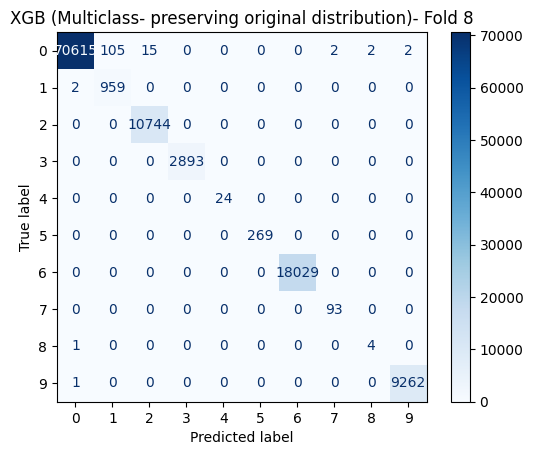

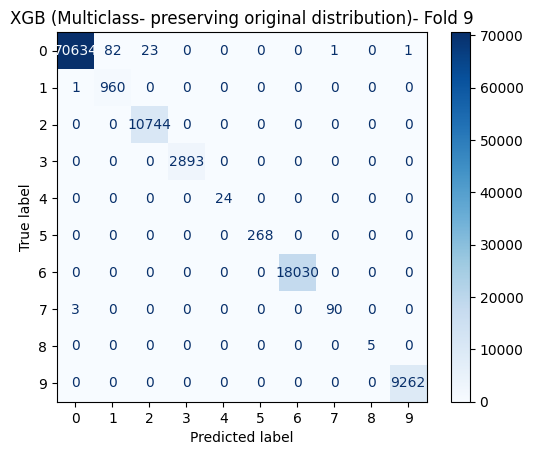

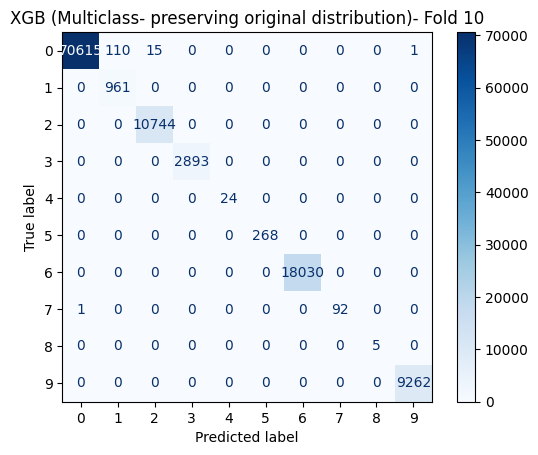

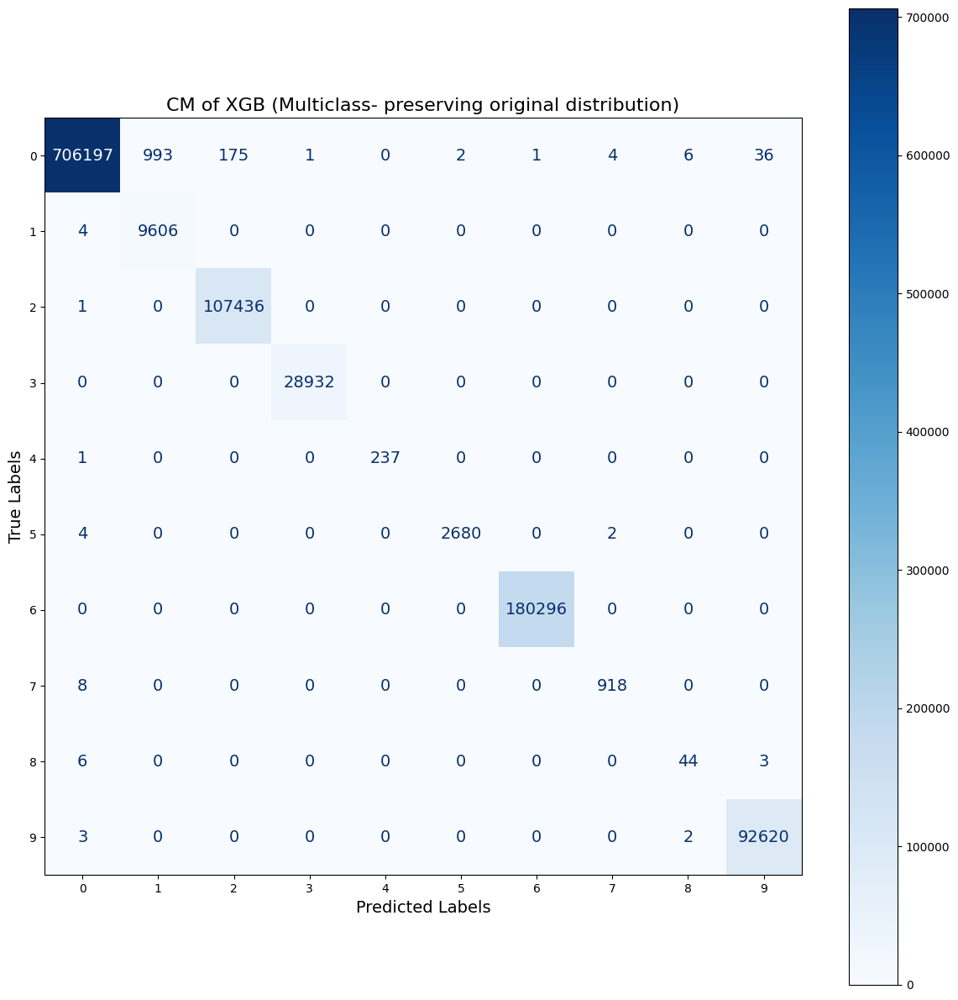

In [19]:
# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_under_sampled_preserve.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

xgb_model_2 = XGBClassifier(random_state=42)

# # Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_preserve_pca, y_under_sampled_preserve, xgb_model_2, classes)

# Unpack metrics
xgb_accuracy, xgb_precision, xgb_recall, xgb_f1, xgb_conf_matrices, xgb_roc_data = metrics
print("XGBoost Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):")
print(f"Accuracy: {np.mean(xgb_accuracy):.4f}")
print(f"Precision: {np.mean(xgb_precision):.4f}")
print(f"Recall: {np.mean(xgb_recall):.4f}")
print(f"F1 Score: {np.mean(xgb_f1):.4f}")


# # Save model and metrics 
model_xgb_results2 = {
    'model': xgb_model_2,
    'accuracy': xgb_accuracy,
    'precision': xgb_precision,
    'recall': xgb_recall,
    'f1': xgb_f1,
    'conf_matrices': xgb_conf_matrices,
}
joblib.dump(model_xgb_results2, 'last_model_xgb_results2.pkl')

# # Plot ROC curve
plot_roc_curve(xgb_roc_data, 'XGB (Multiclass- preserving original distribution)')

plot_conf_matrices(xgb_conf_matrices, "XGB (Multiclass- preserving original distribution)") 

final_cm = aggregate_conf_matrices(xgb_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of XGB (Multiclass- preserving original distribution)")

XGB takes 9 m

In [9]:

def plot_multiclass_matrices(conf_matrices, title):
    for i, cm in enumerate(conf_matrices, 1):
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
        
        # Plot with increased size and font size
        fig, ax = plt.subplots(figsize=(15, 10))  # Increase figure size for clarity
        disp.plot(cmap=plt.cm.Blues, ax=ax)
        
        # Adjust the font size of the labels and annotations for better readability
        for text in ax.texts:
            text.set_fontsize(14)  # Increase the font size for the annotations
        
        plt.title(f"{title}- Fold {i}", fontsize=16)  # Increase the title font size
        plt.xlabel('Predicted Labels', fontsize=14)
        plt.ylabel('True Labels', fontsize=14)
        
        # Adjust the spacing to ensure that the first and last digits are clear
        plt.tight_layout()
        plt.show()


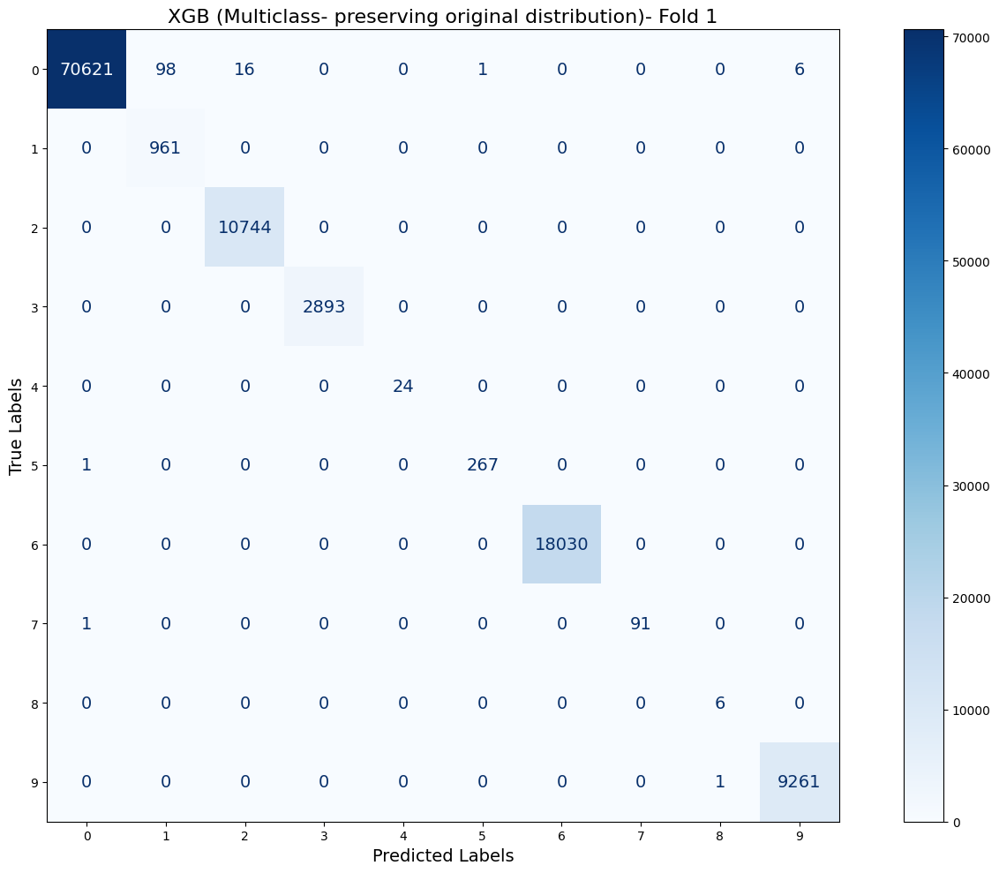

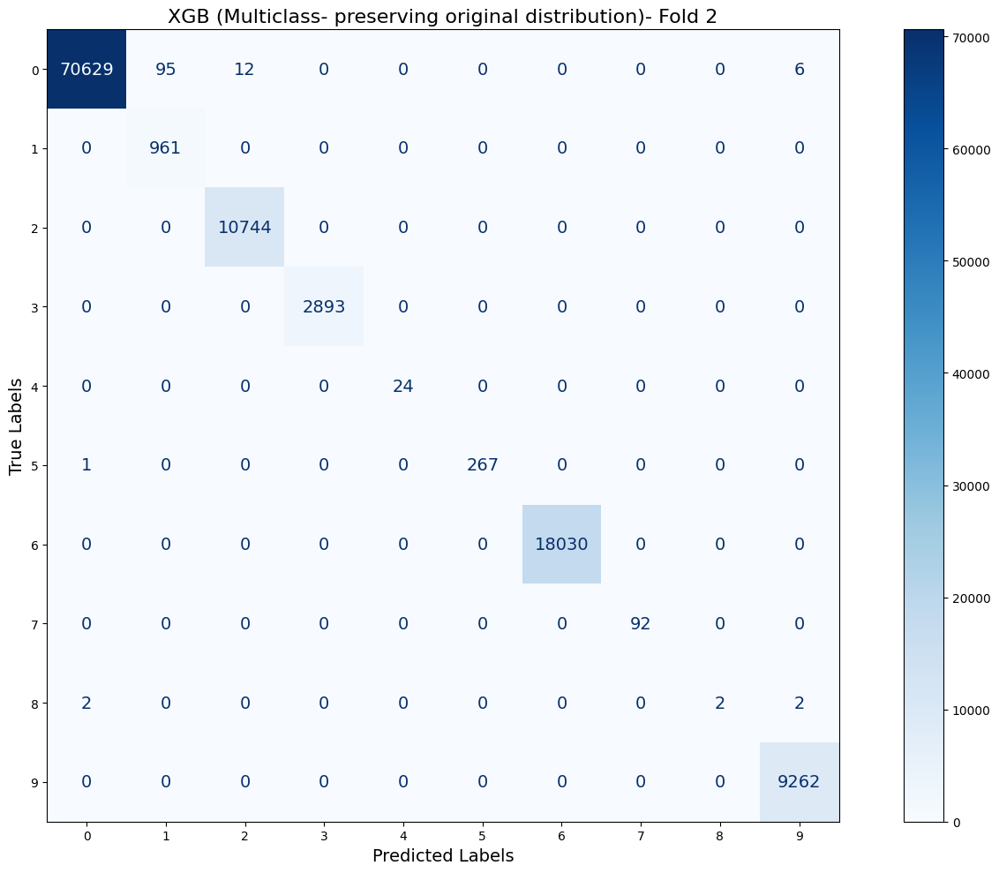

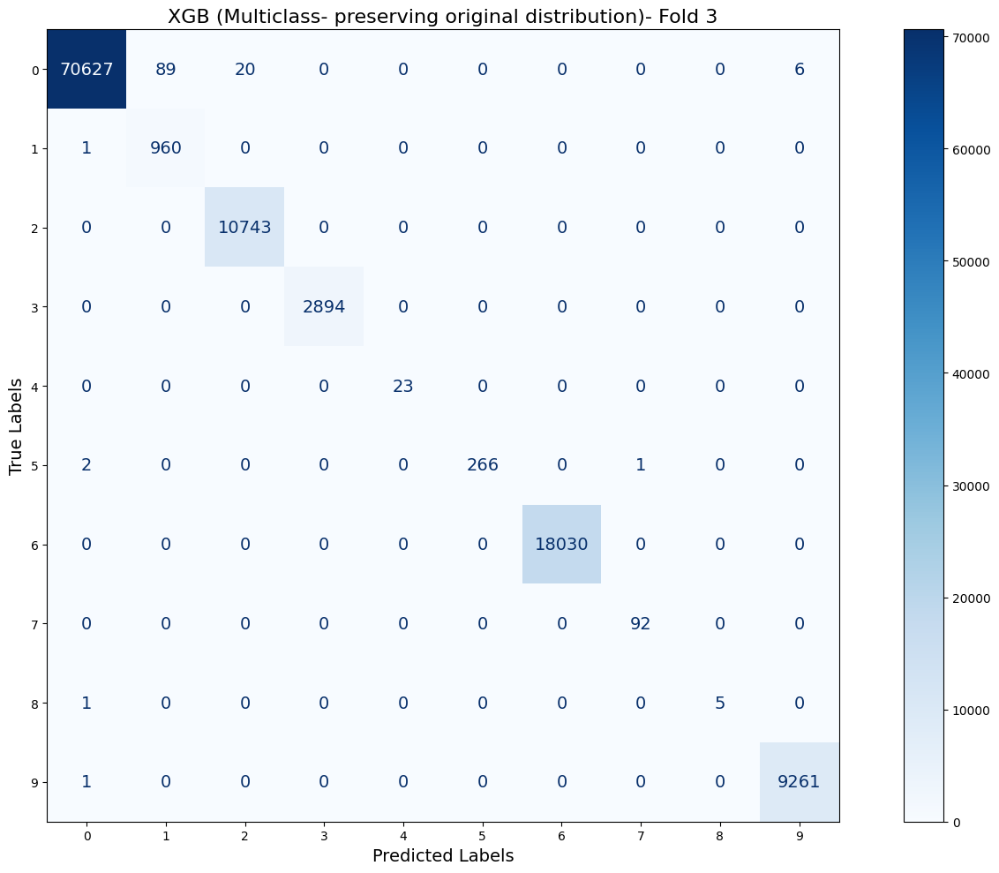

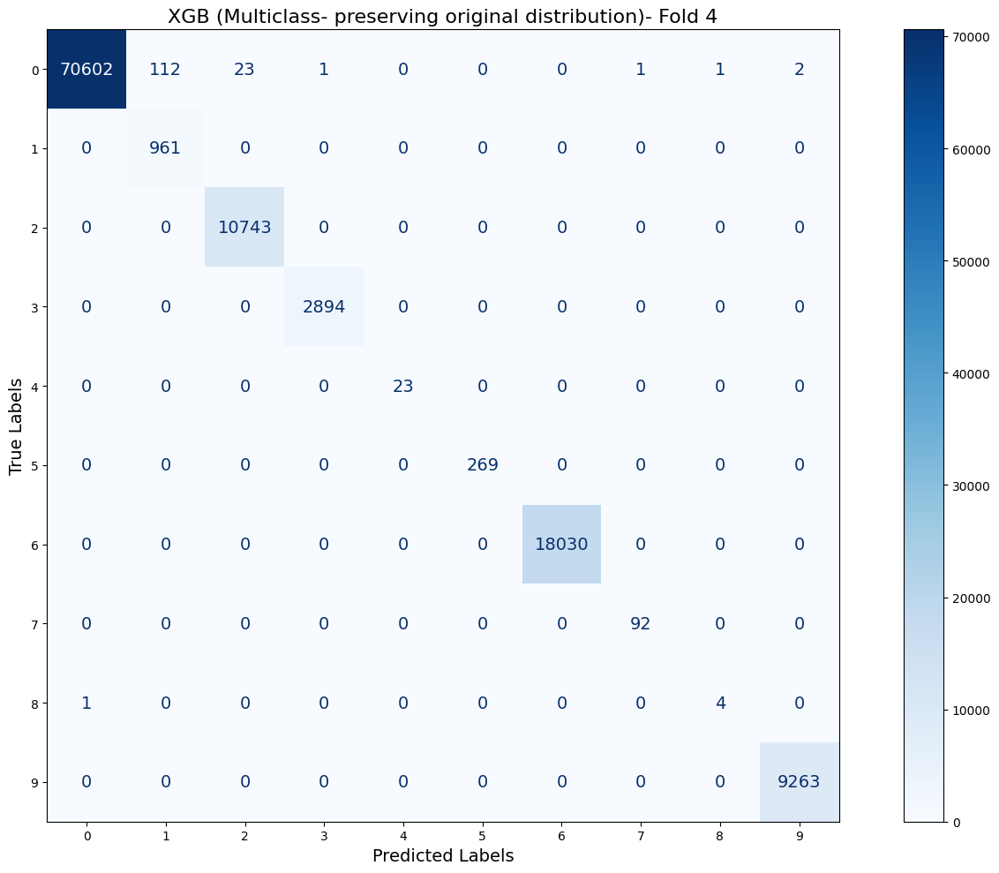

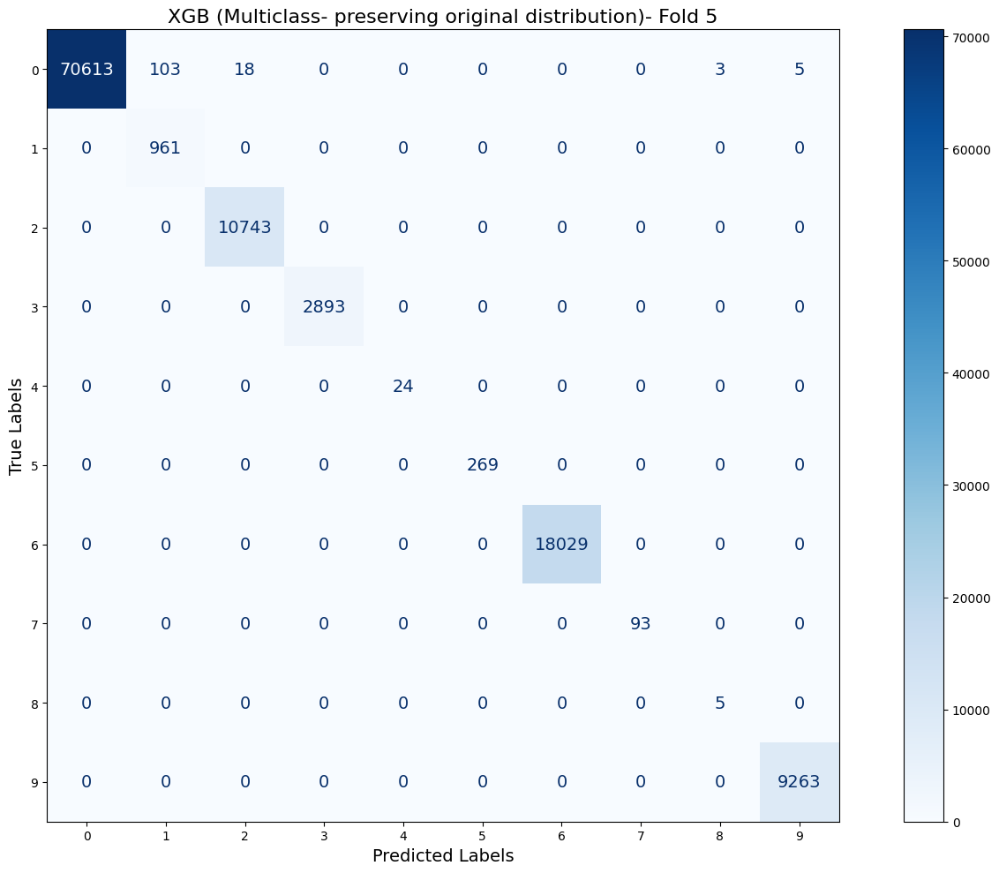

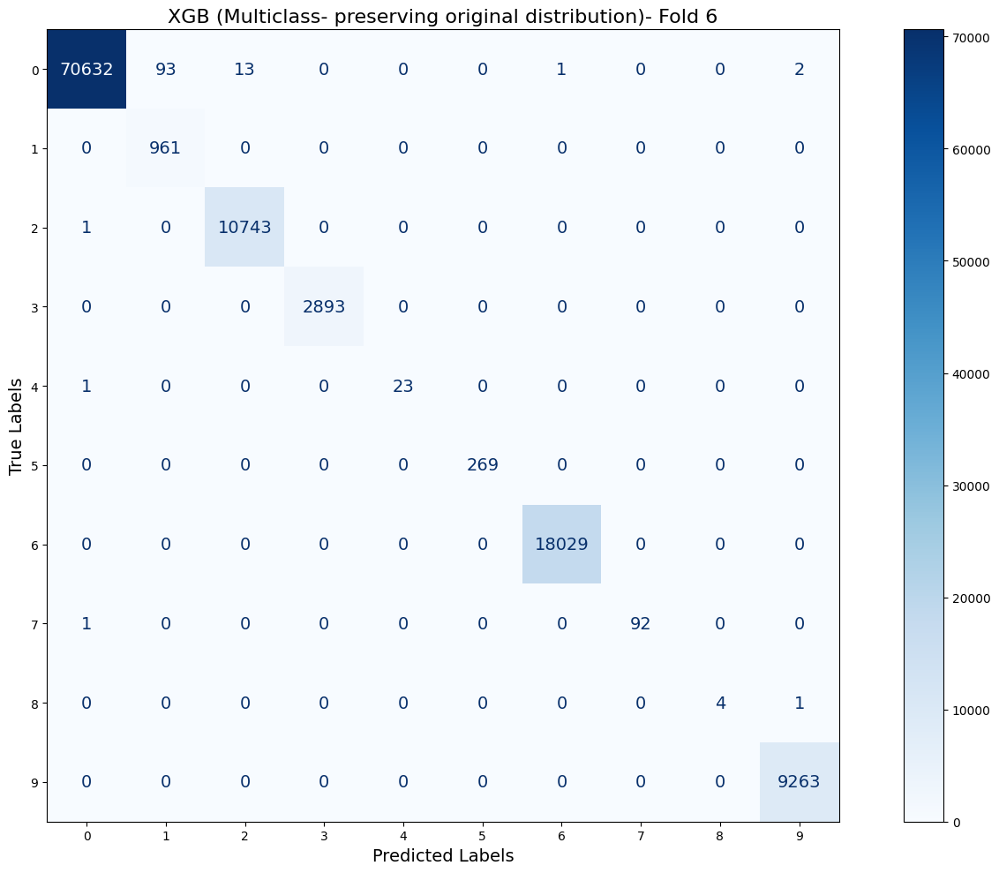

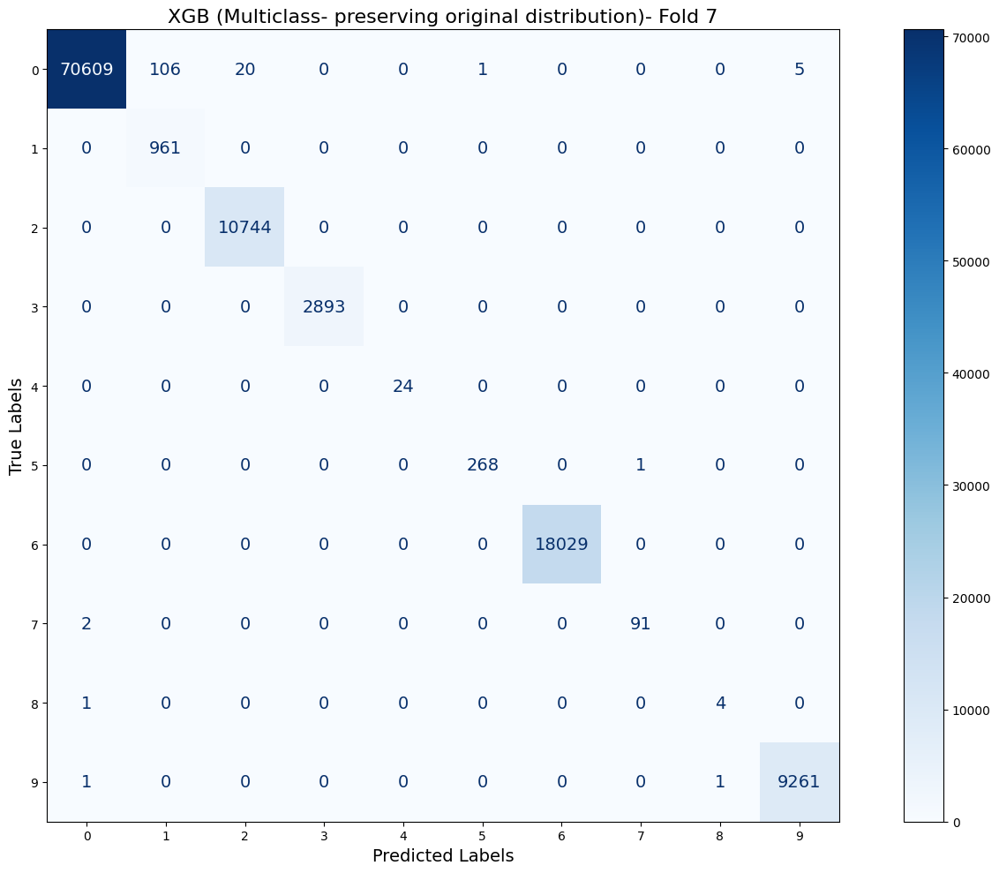

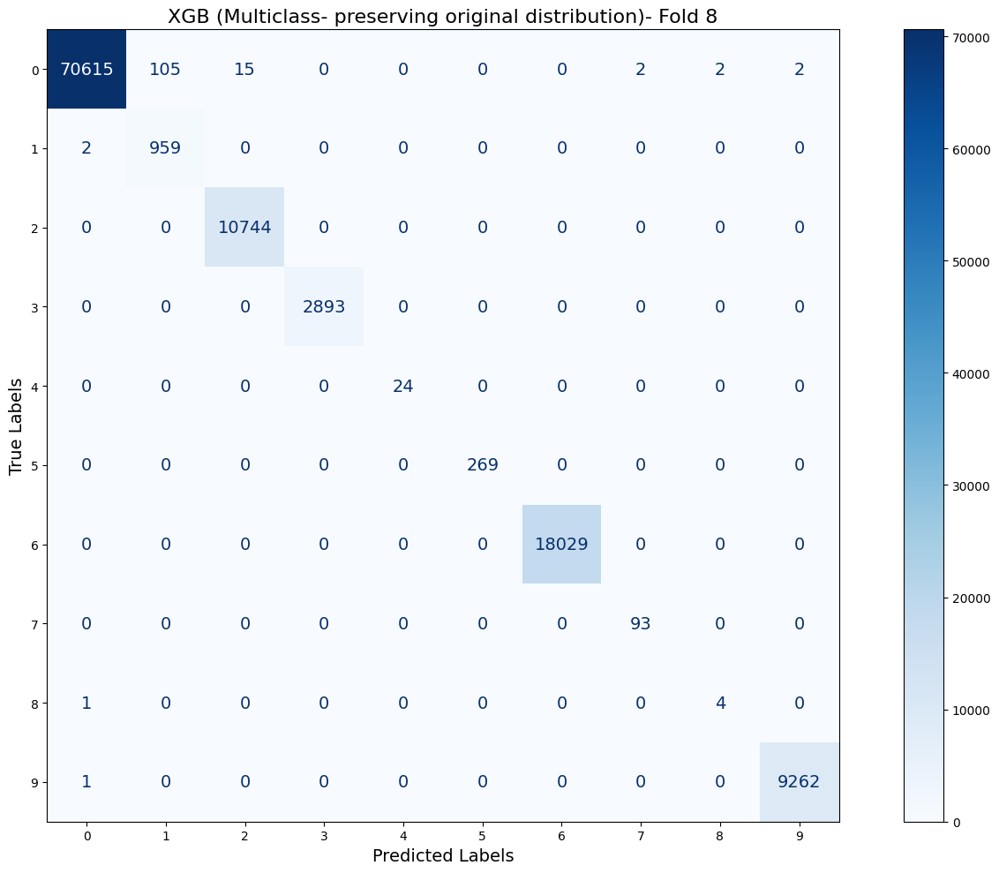

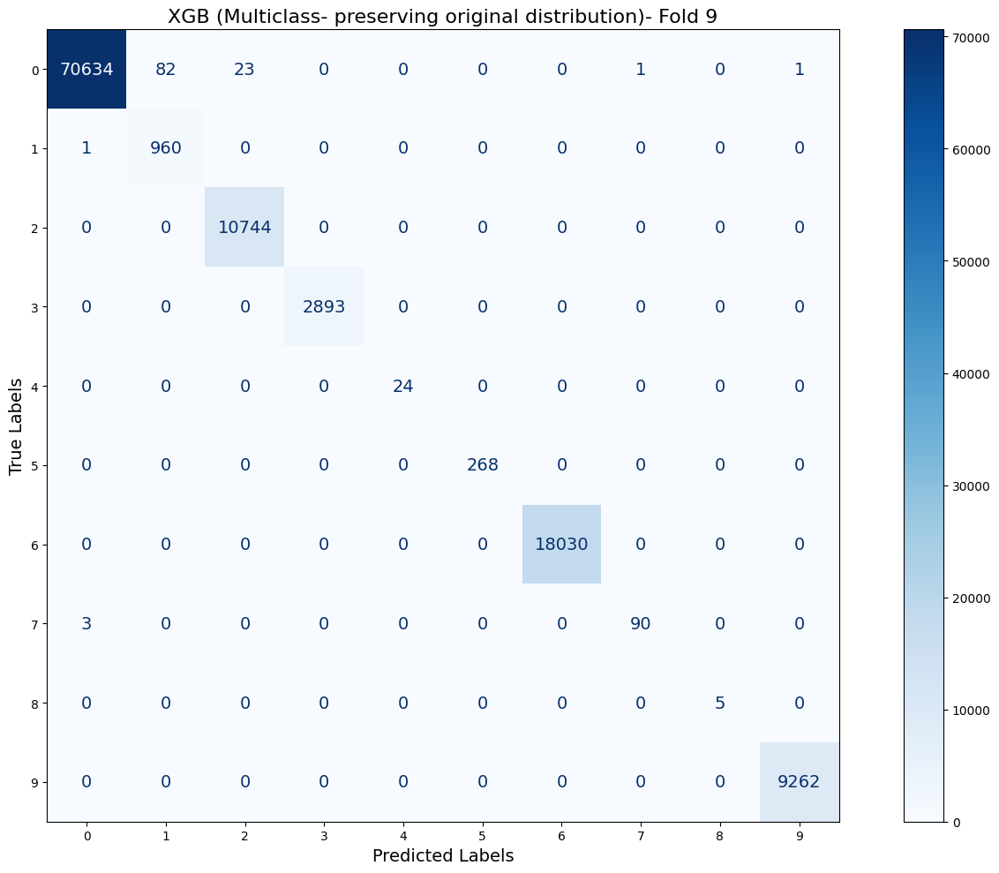

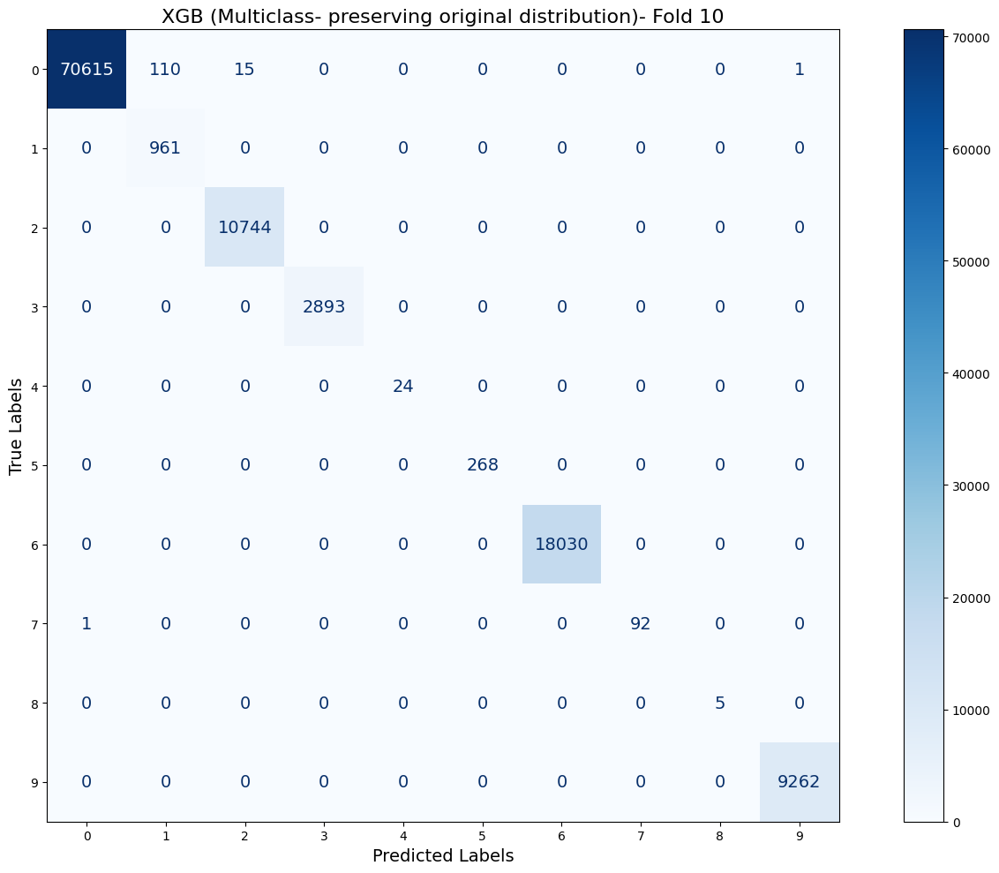

In [21]:
plot_multiclass_matrices(xgb_conf_matrices, "XGB (Multiclass- preserving original distribution)") 


xgb 9m 9.4s

Decision Tress  Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):
Accuracy: 0.9978
Precision: 0.9978
Recall: 0.9978
F1 Score: 0.9978


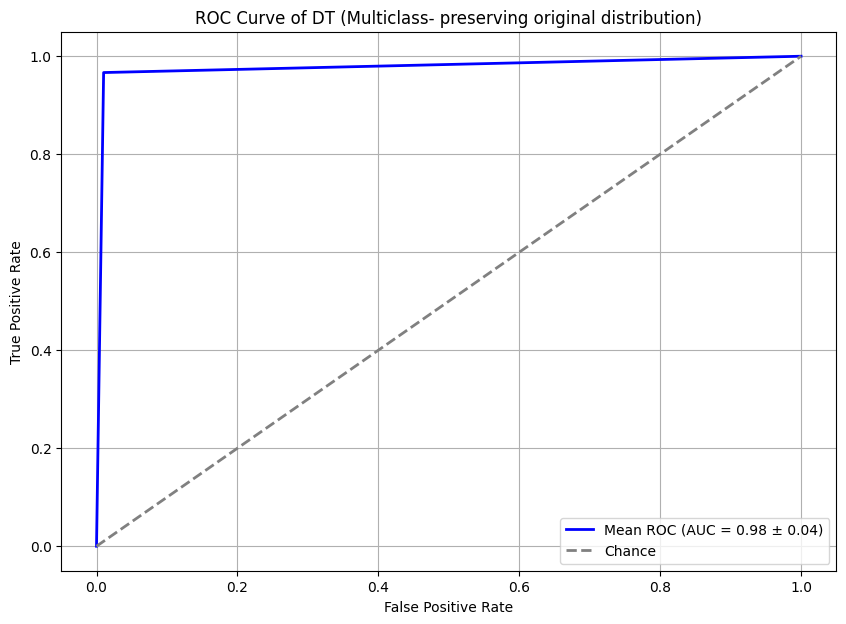

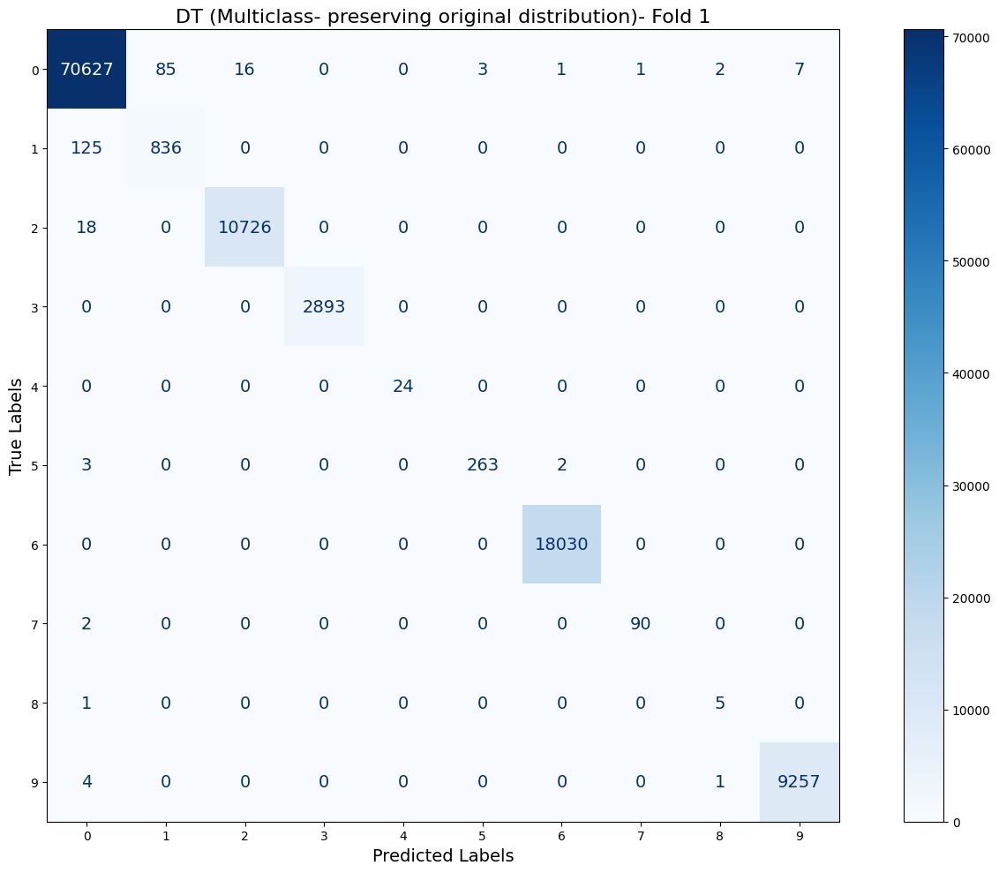

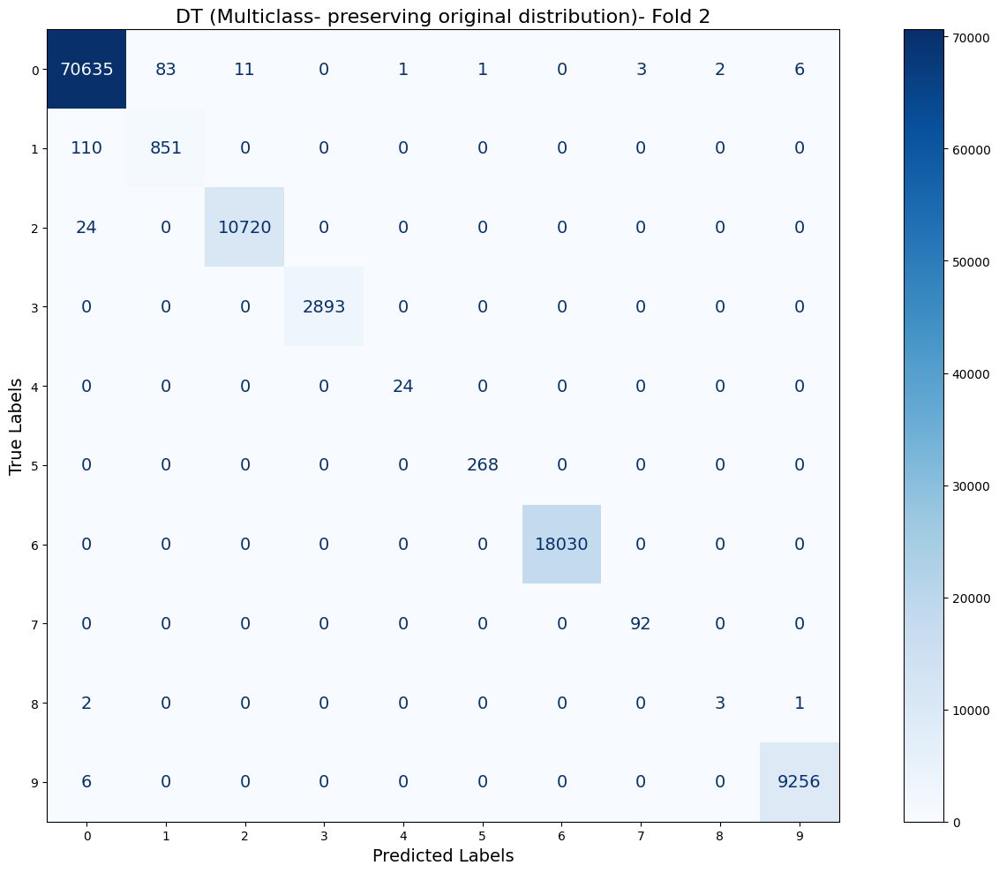

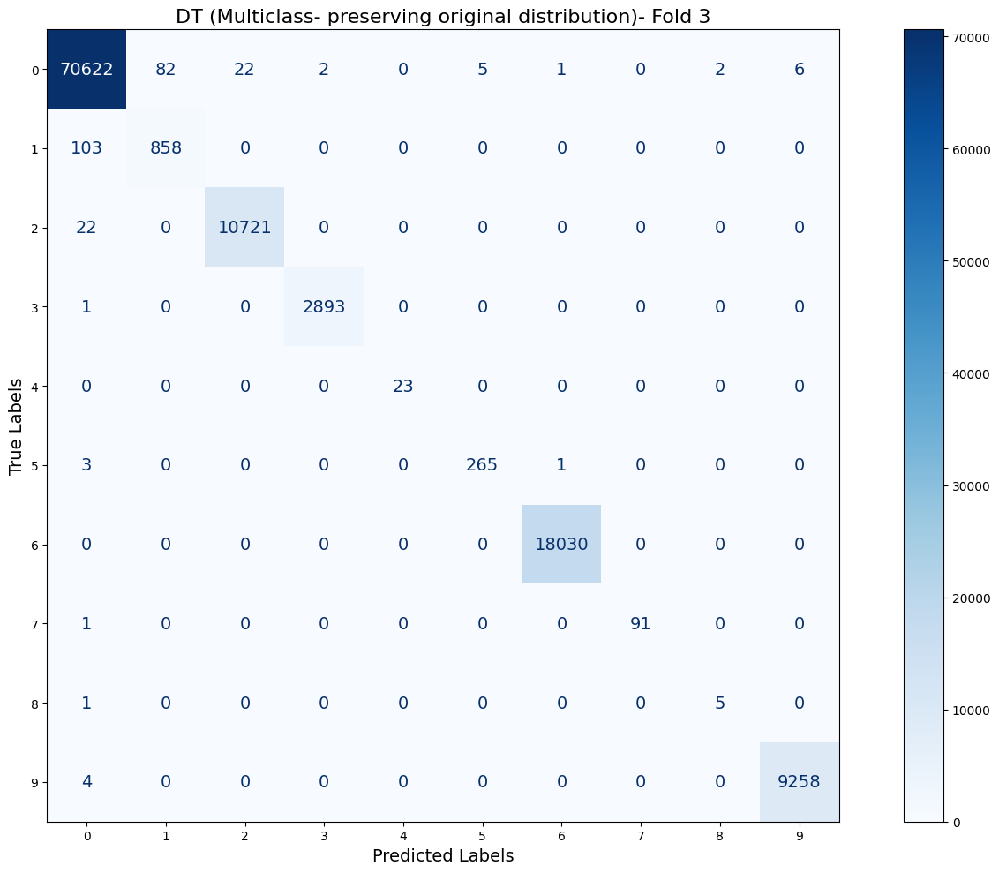

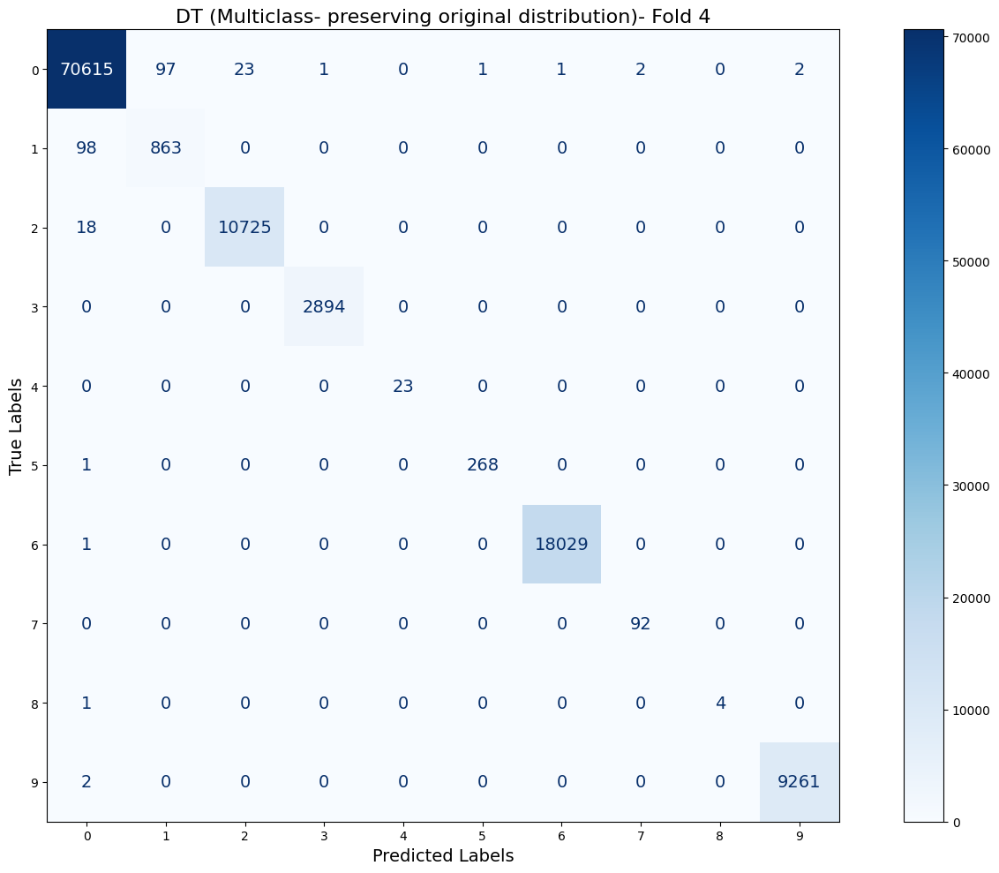

...

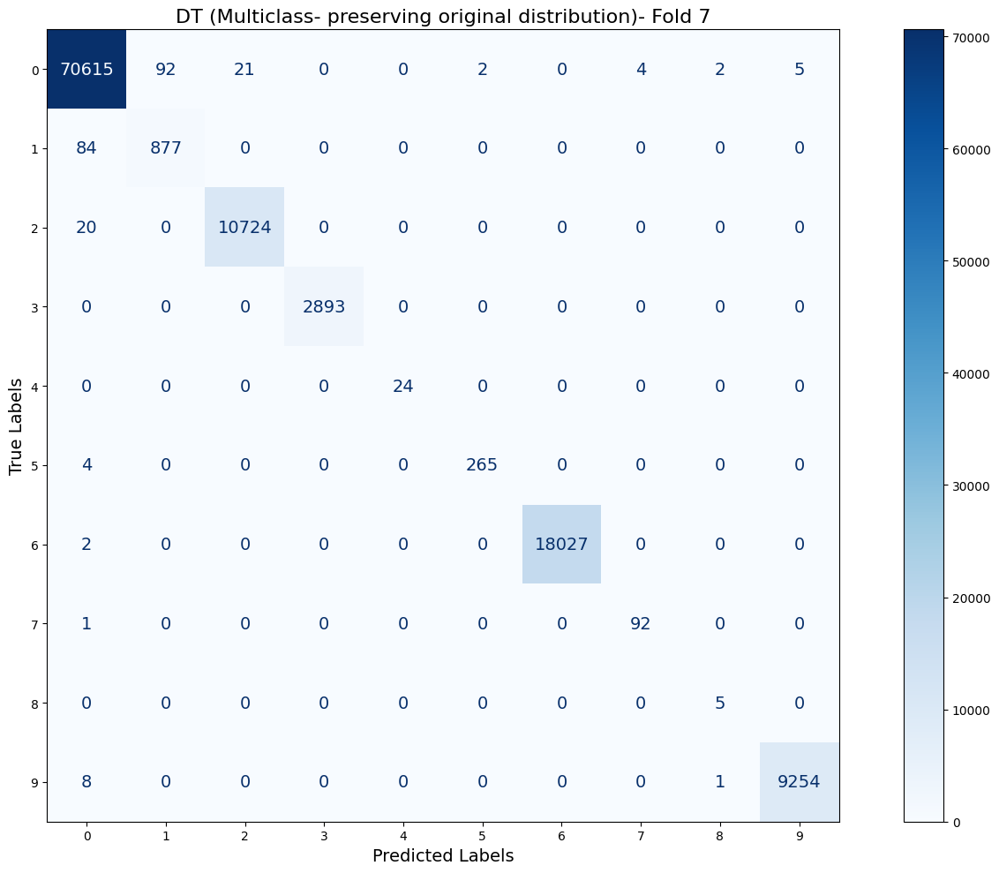

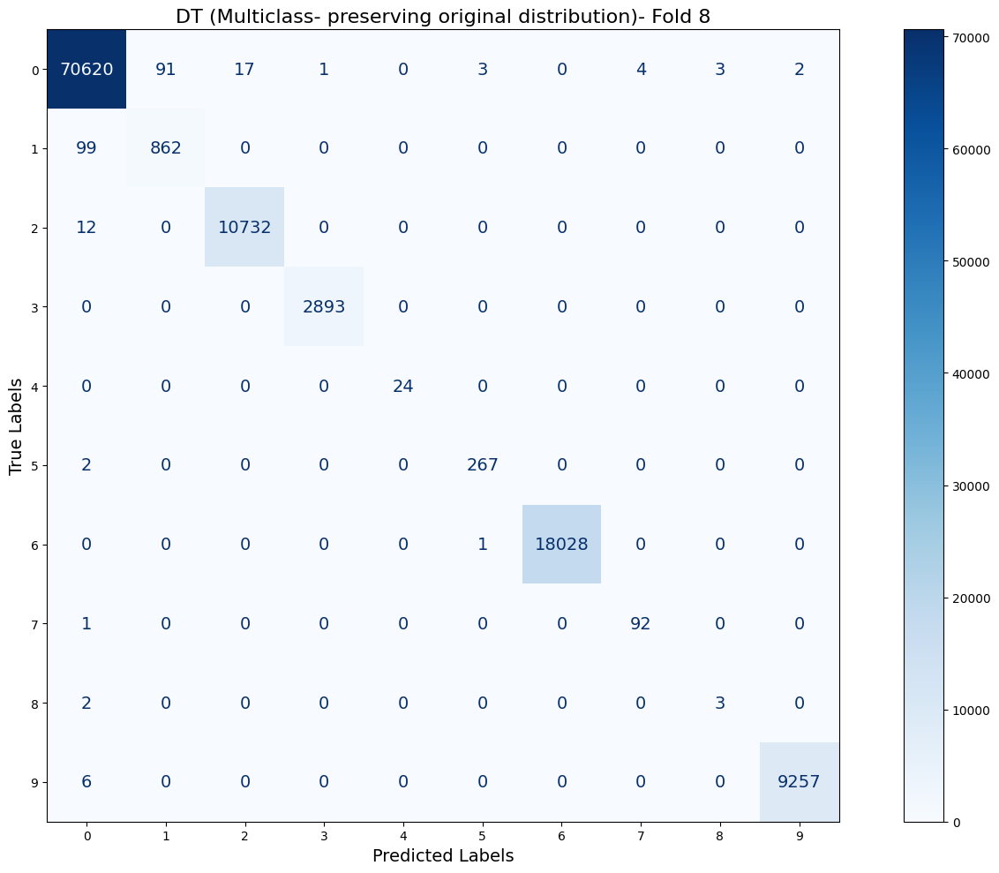

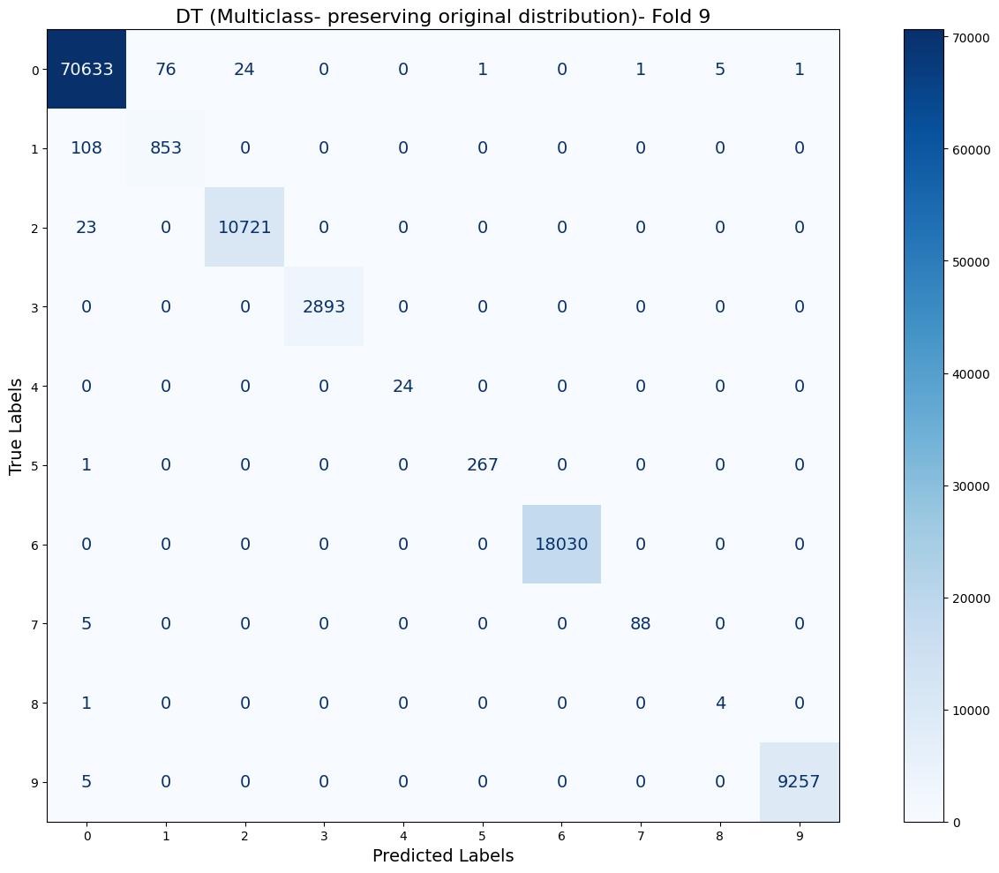

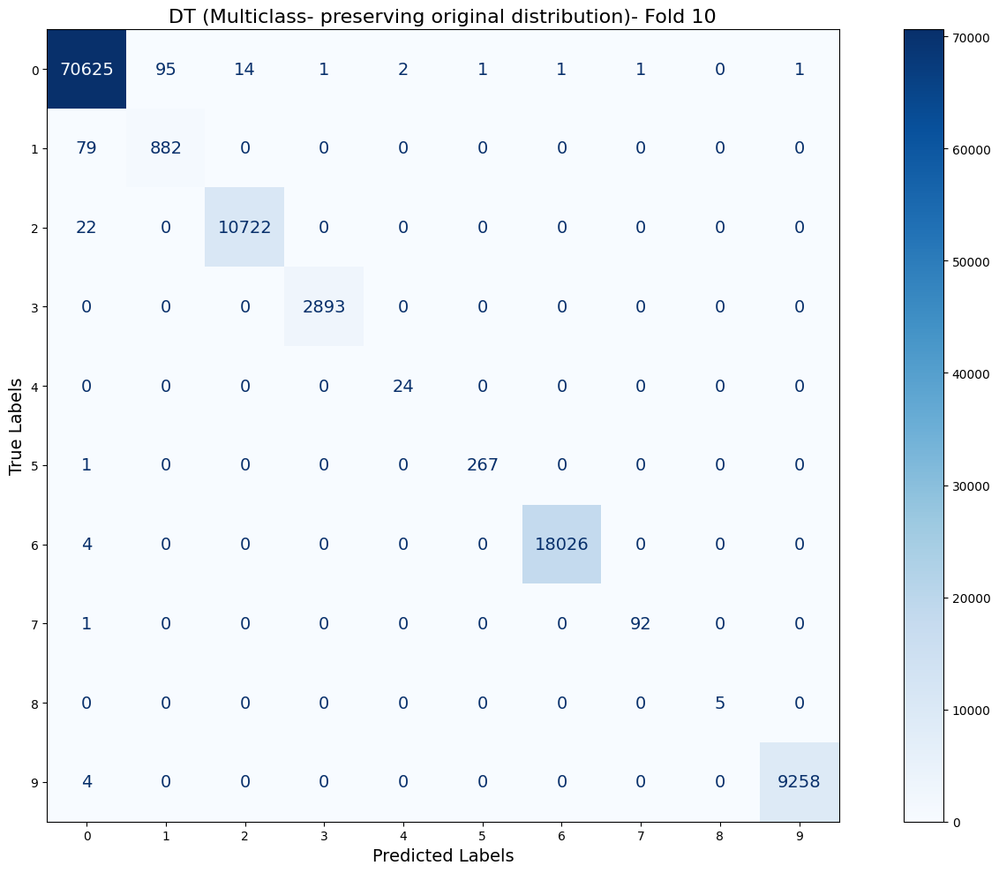

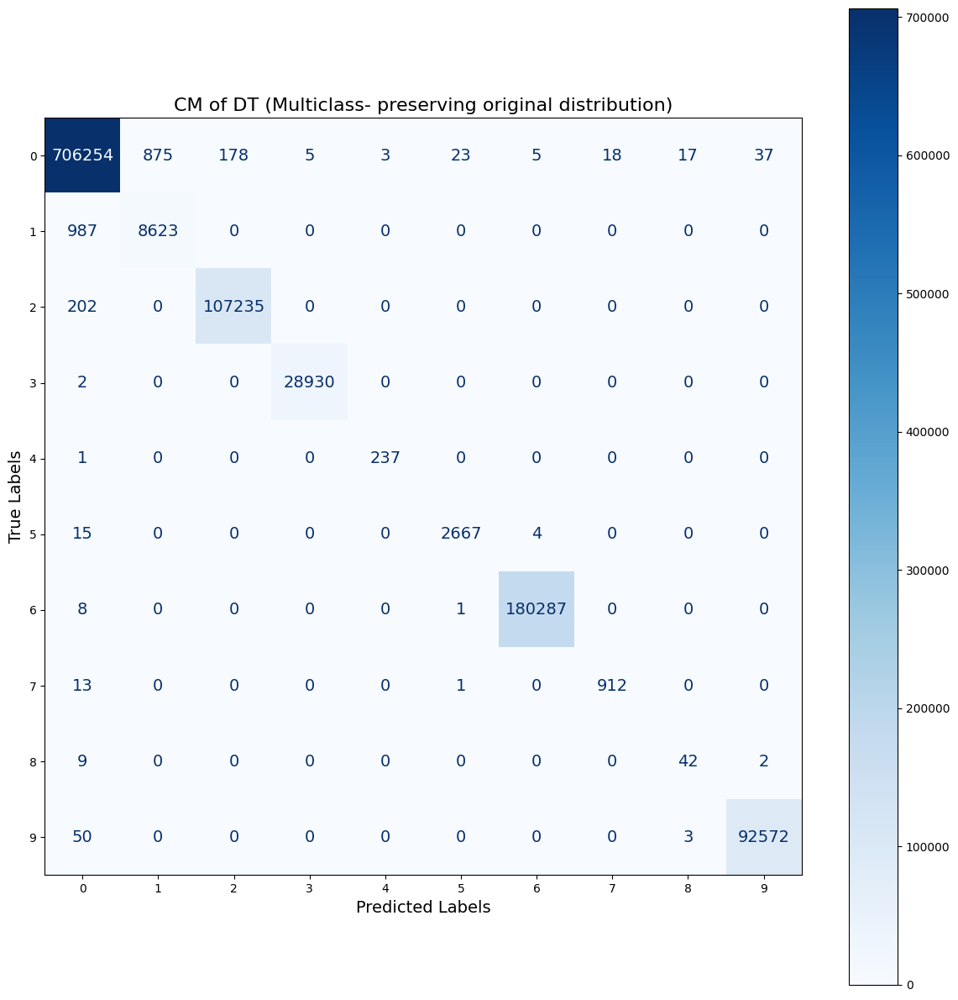

In [23]:
##decision tree

dt_model_2 = DecisionTreeClassifier(random_state=42)

# # Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_preserve_pca, y_under_sampled_preserve, dt_model_2, classes)

# Unpack metrics
dt_accuracy, dt_precision, dt_recall, dt_f1, dt_conf_matrices, dt_roc_data = metrics
print("Decision Tress  Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):")
print(f"Accuracy: {np.mean(dt_accuracy):.4f}")
print(f"Precision: {np.mean(dt_precision):.4f}")
print(f"Recall: {np.mean(dt_recall):.4f}")
print(f"F1 Score: {np.mean(dt_f1):.4f}")


# # Save model and metrics 
model_dt_results2 = {
    'model': dt_model_2,
    'accuracy': dt_accuracy,
    'precision': dt_precision,
    'recall': dt_recall,
    'f1': dt_f1,
    'conf_matrices': dt_conf_matrices,
}
joblib.dump(model_dt_results2, 'last_model_dt_results2.pkl')

# # Plot ROC curve
plot_roc_curve(dt_roc_data, 'DT (Multiclass- preserving original distribution)')

plot_multiclass_matrices(dt_conf_matrices, "DT (Multiclass- preserving original distribution)") 
# plot_conf_matrices(dt_conf_matrices, "DT (Multiclass- preserving original distribution)") 

final_cm = aggregate_conf_matrices(dt_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of DT (Multiclass- preserving original distribution)")

dt takes 24m  2.2s

Extra Trees  Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):
Accuracy: 0.9987
Precision: 0.9988
Recall: 0.9987
F1 Score: 0.9987


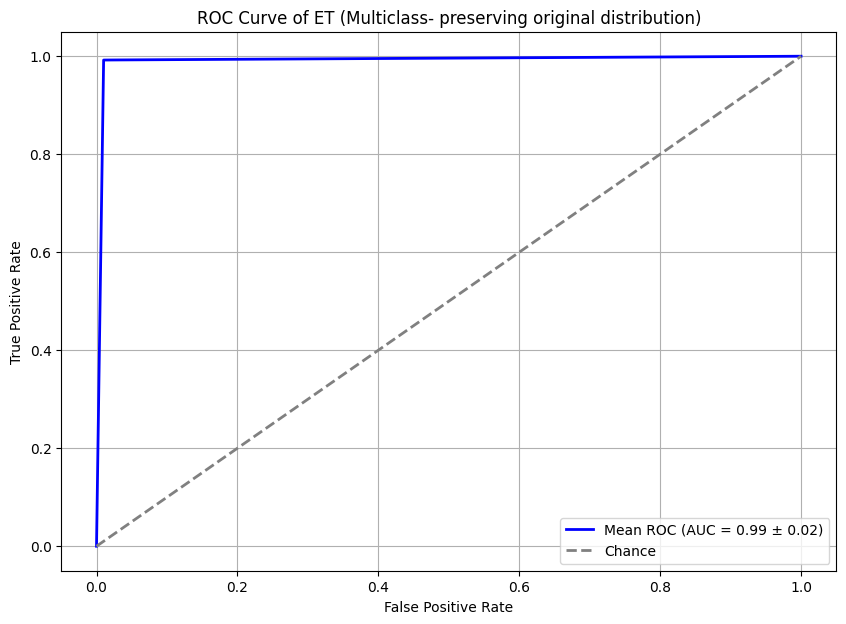

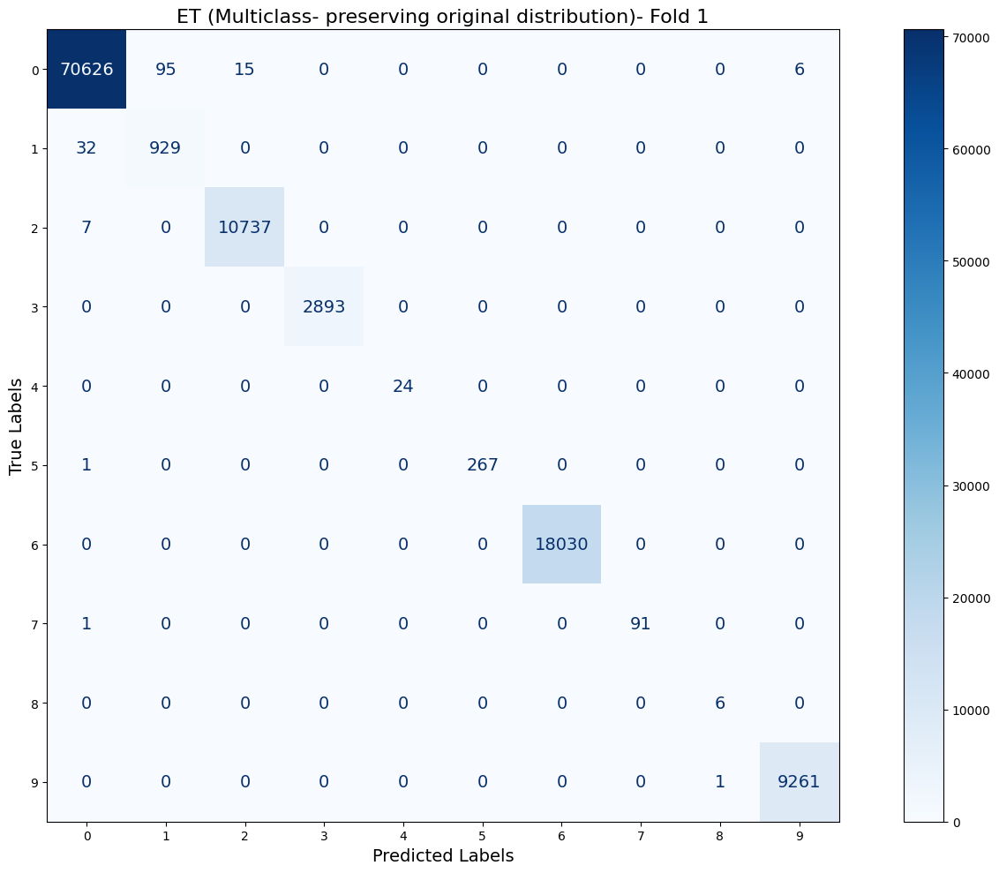

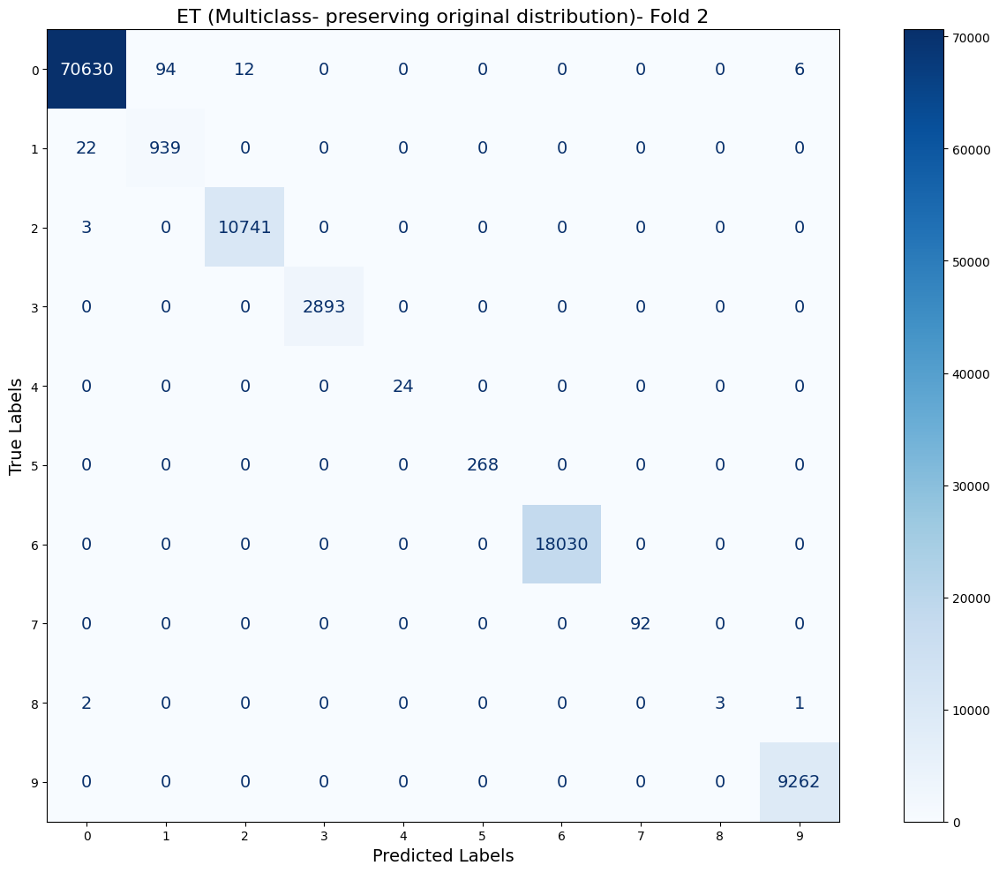

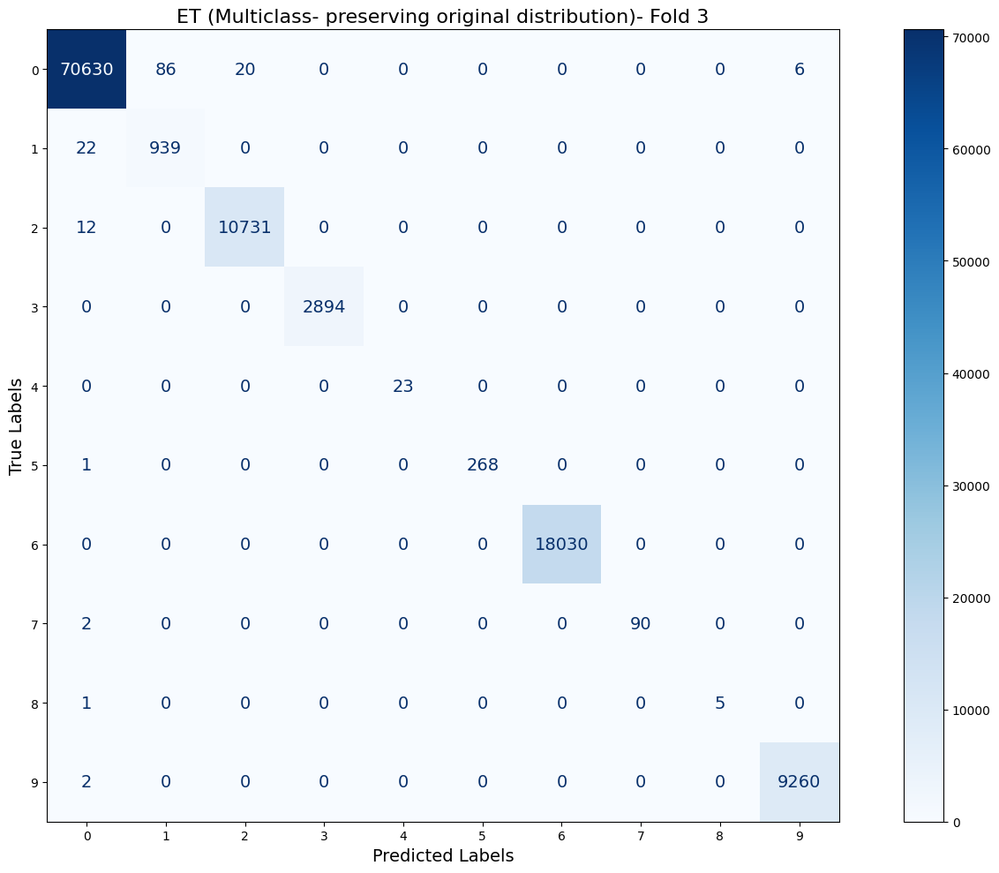

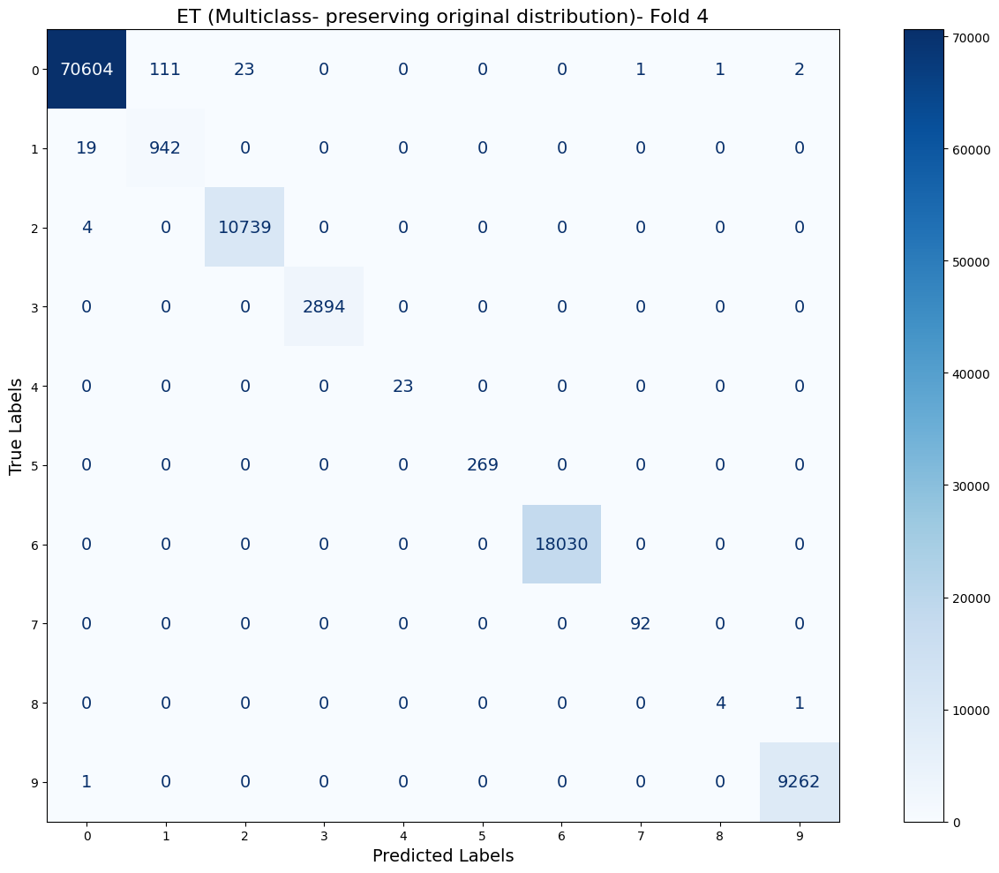

...

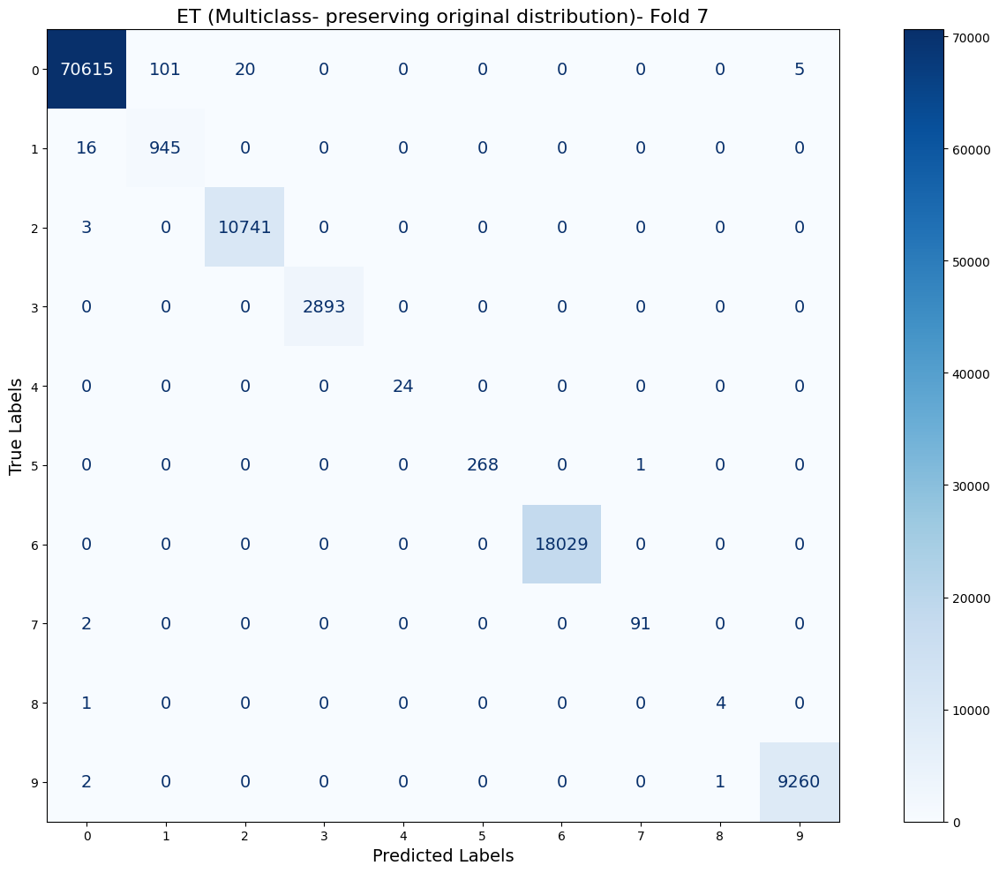

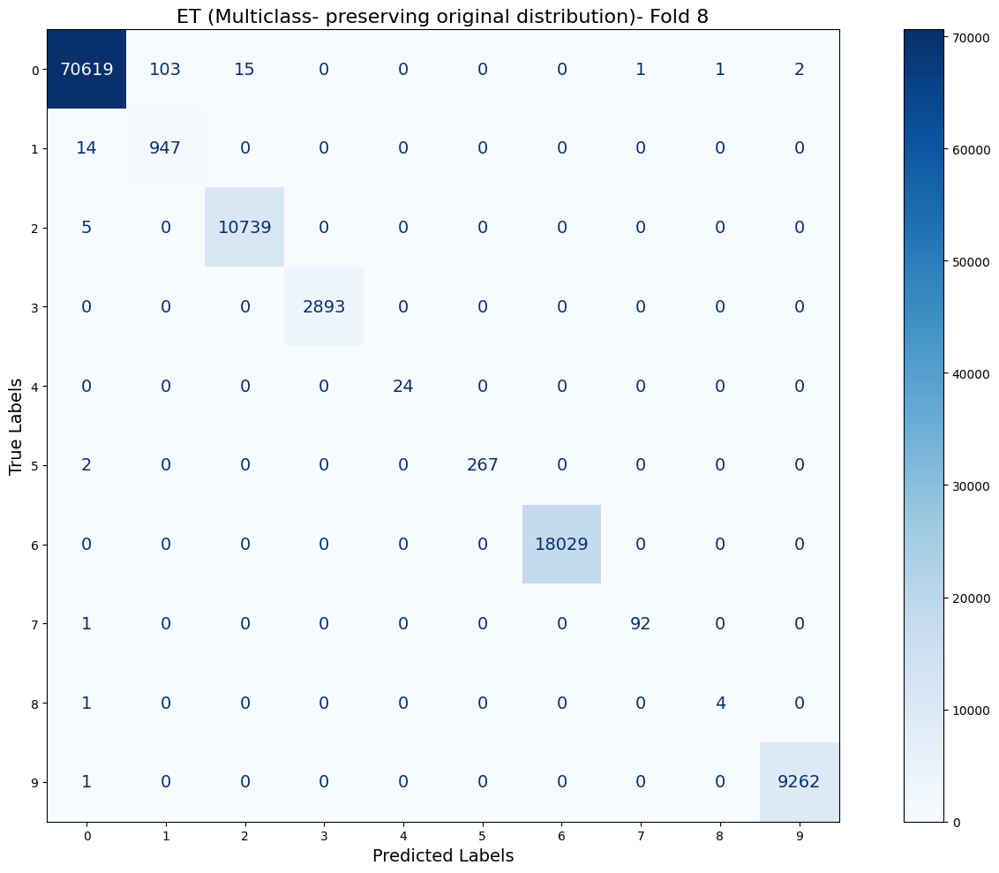

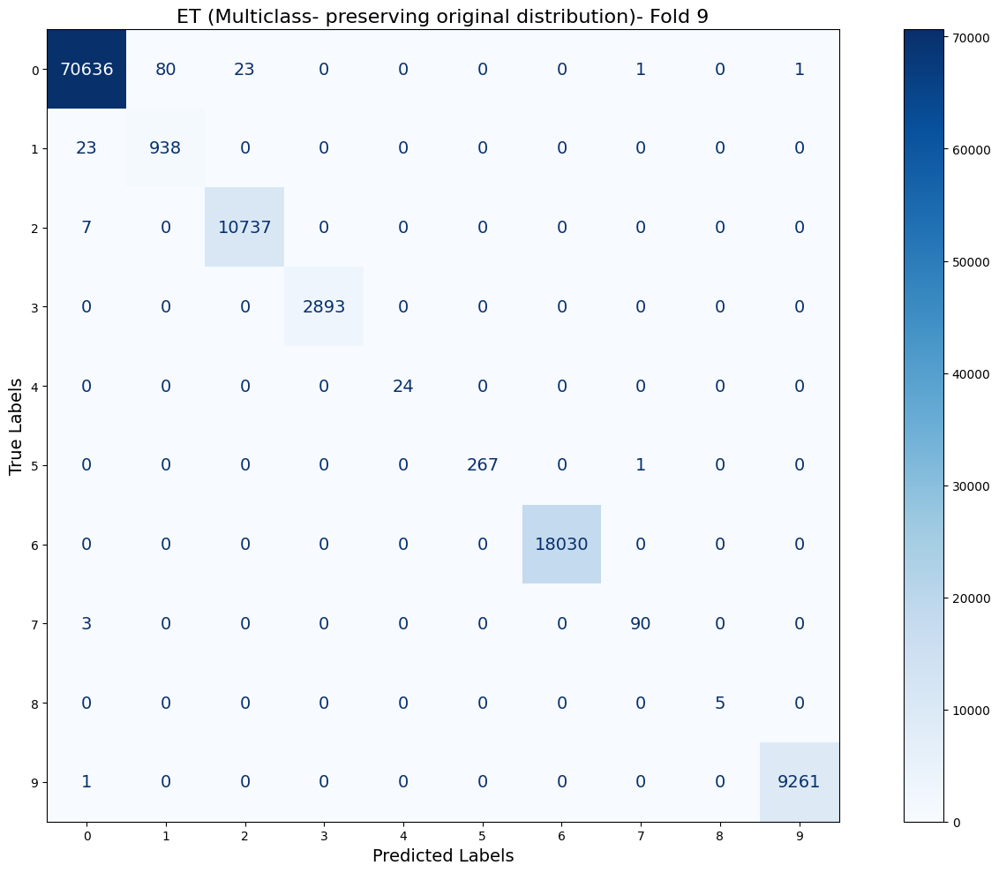

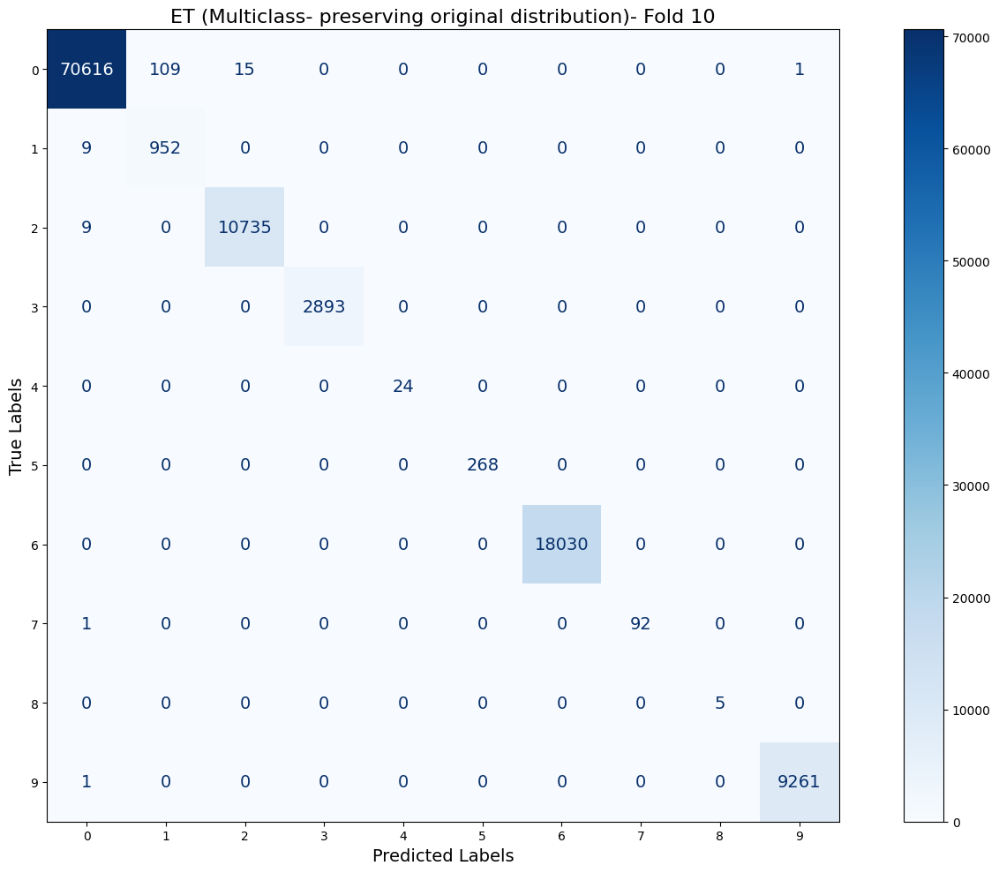

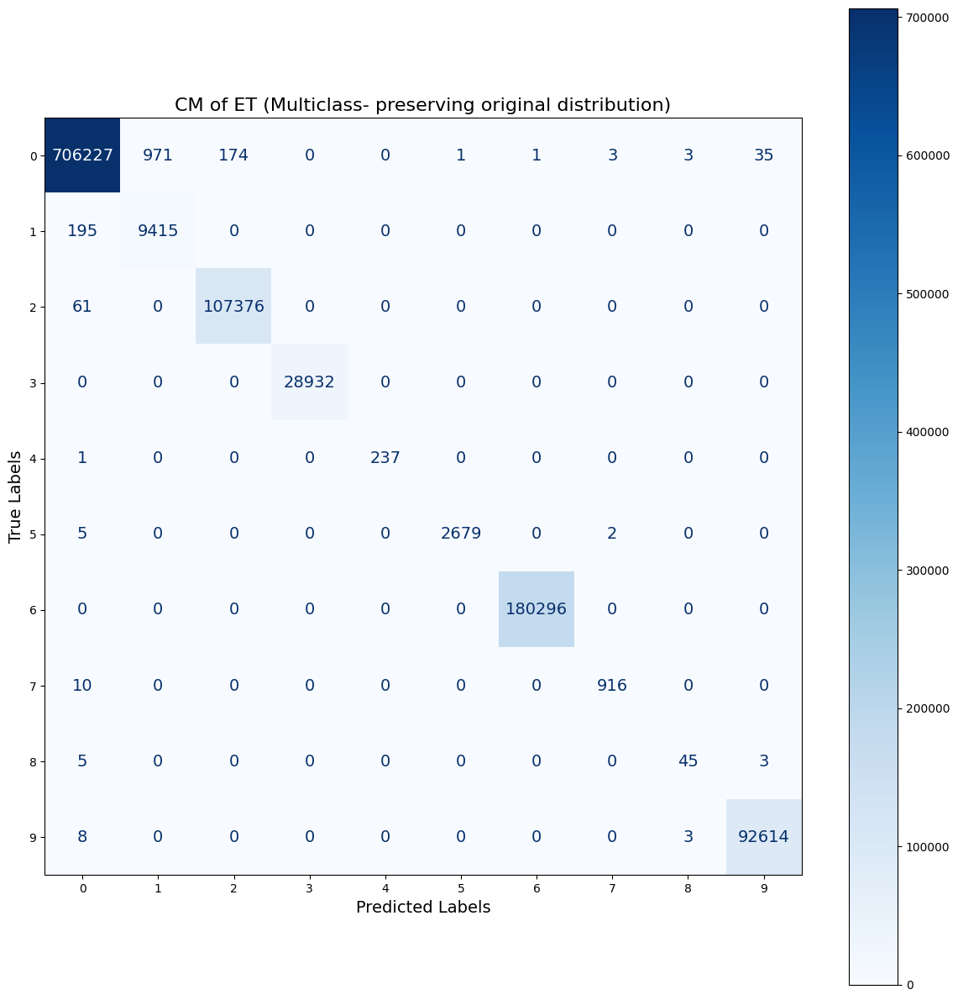

In [24]:
##extra trees
et_model_2 = ExtraTreesClassifier(random_state=42)
# # Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_preserve_pca, y_under_sampled_preserve, et_model_2, classes)

# Unpack metrics
et_accuracy, et_precision, et_recall, et_f1, et_conf_matrices, et_roc_data = metrics
print("Extra Trees  Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):")
print(f"Accuracy: {np.mean(et_accuracy):.4f}")
print(f"Precision: {np.mean(et_precision):.4f}")
print(f"Recall: {np.mean(et_recall):.4f}")
print(f"F1 Score: {np.mean(et_f1):.4f}")


# # Save model and metrics 
model_et_results2 = {
    'model': et_model_2,
    'accuracy': et_accuracy,
    'precision': et_precision,
    'recall': et_recall,
    'f1': et_f1,
    'conf_matrices': et_conf_matrices,
}
joblib.dump(model_et_results2, 'last_model_et_results2.pkl')

# # Plot ROC curve
plot_roc_curve(et_roc_data, 'ET (Multiclass- preserving original distribution)')

plot_multiclass_matrices(et_conf_matrices, "ET (Multiclass- preserving original distribution)") 

final_cm = aggregate_conf_matrices(et_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of ET (Multiclass- preserving original distribution)")

et  23m 52.4s

Random Forest  Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):
Accuracy: 0.9989
Precision: 0.9989
Recall: 0.9989
F1 Score: 0.9989


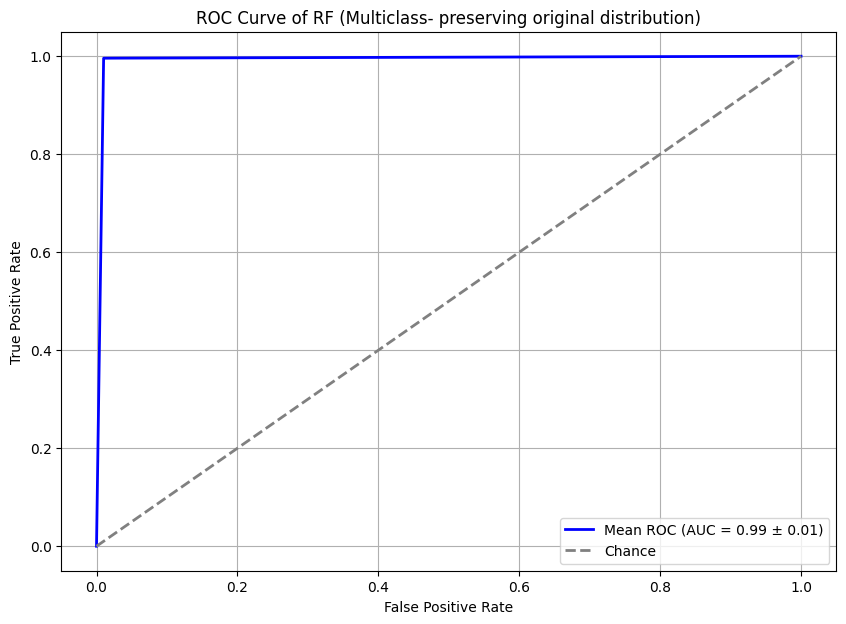

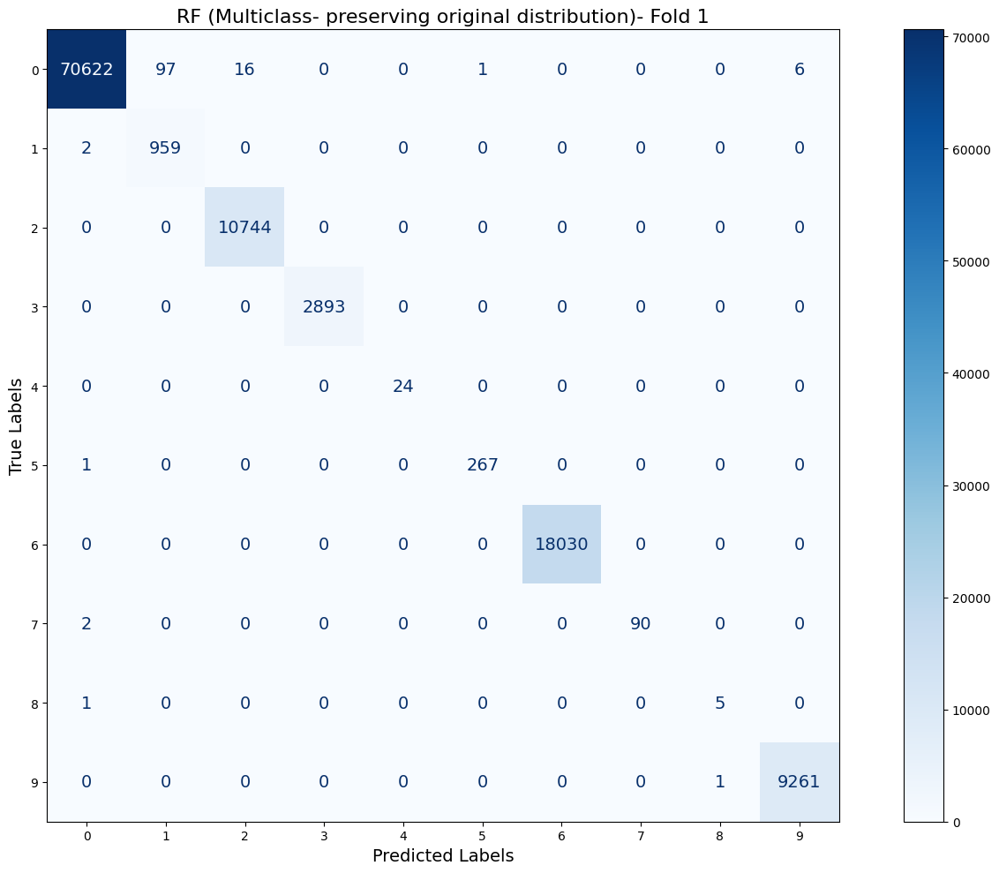

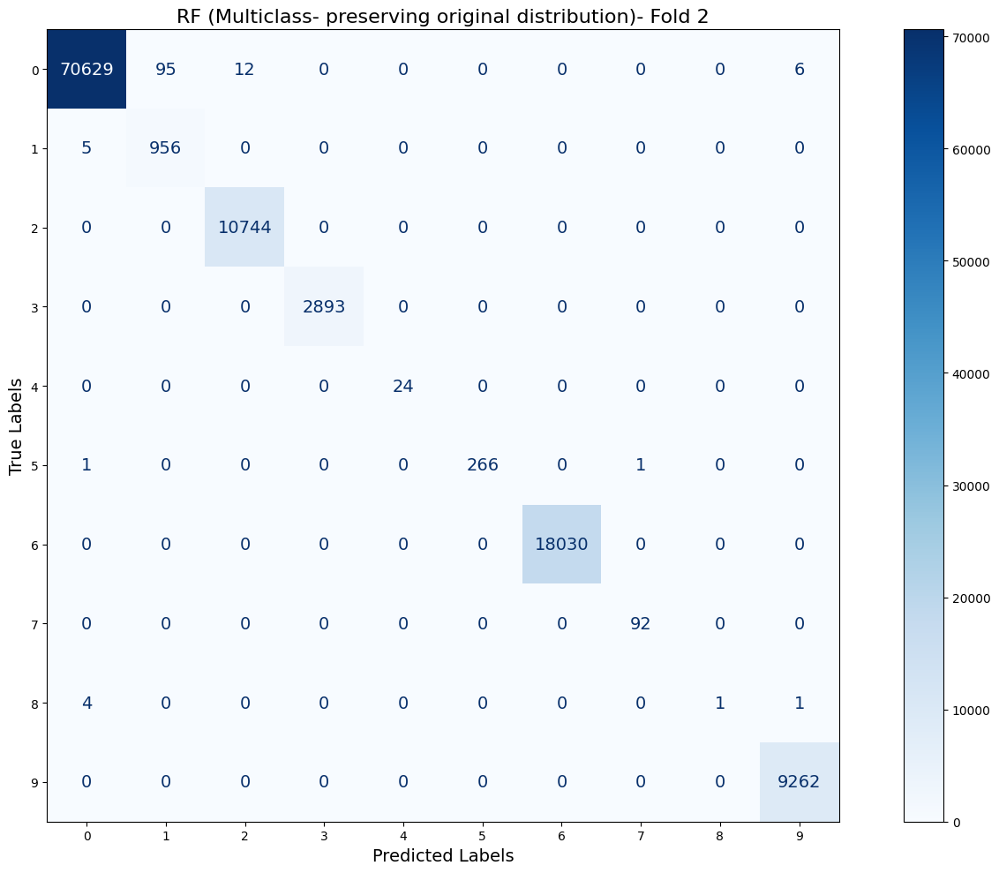

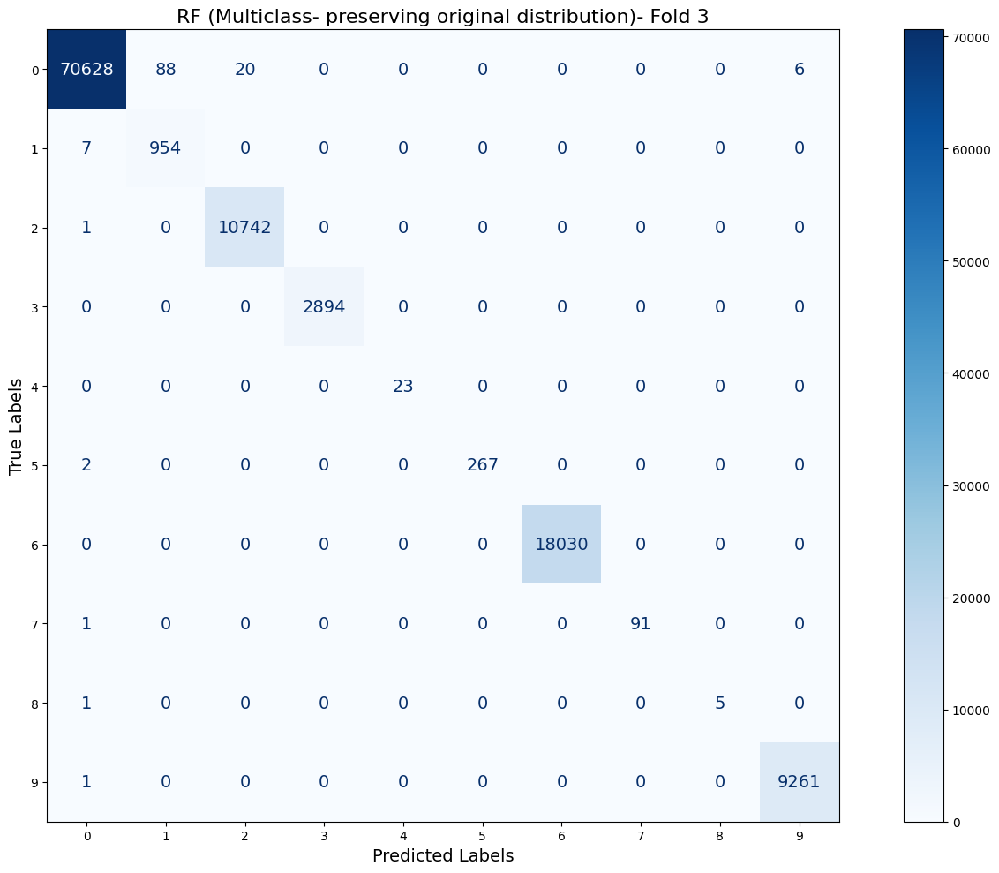

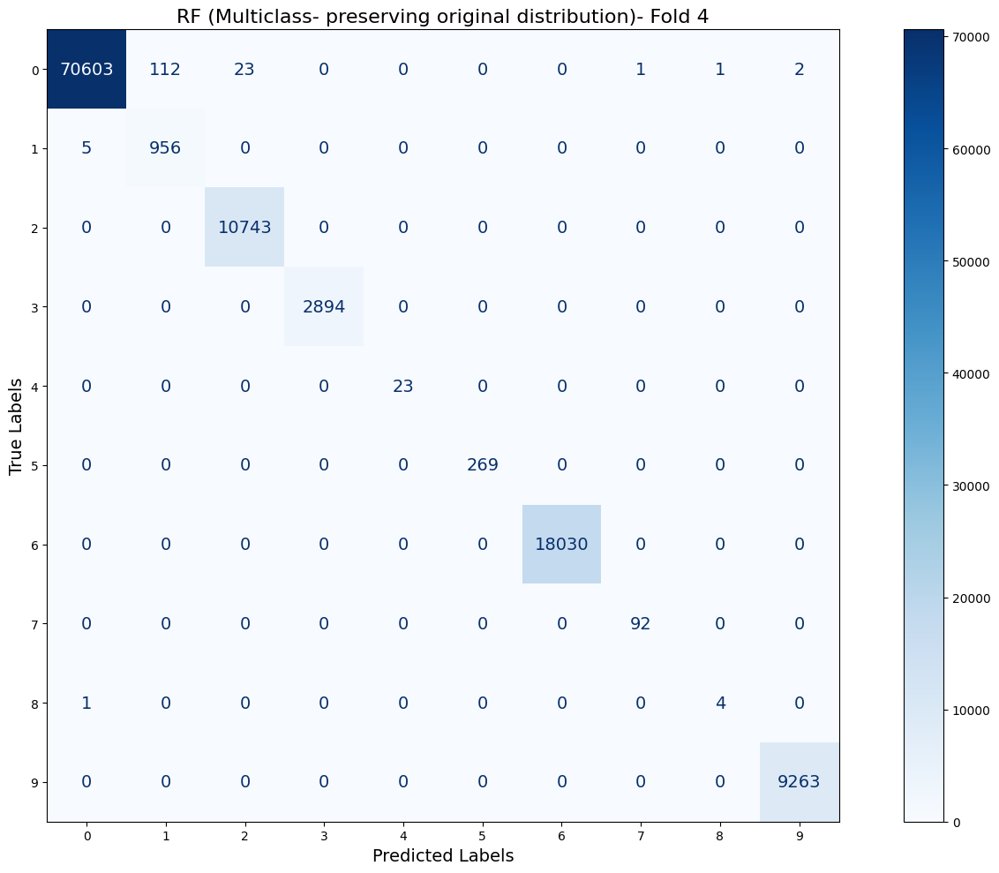

...

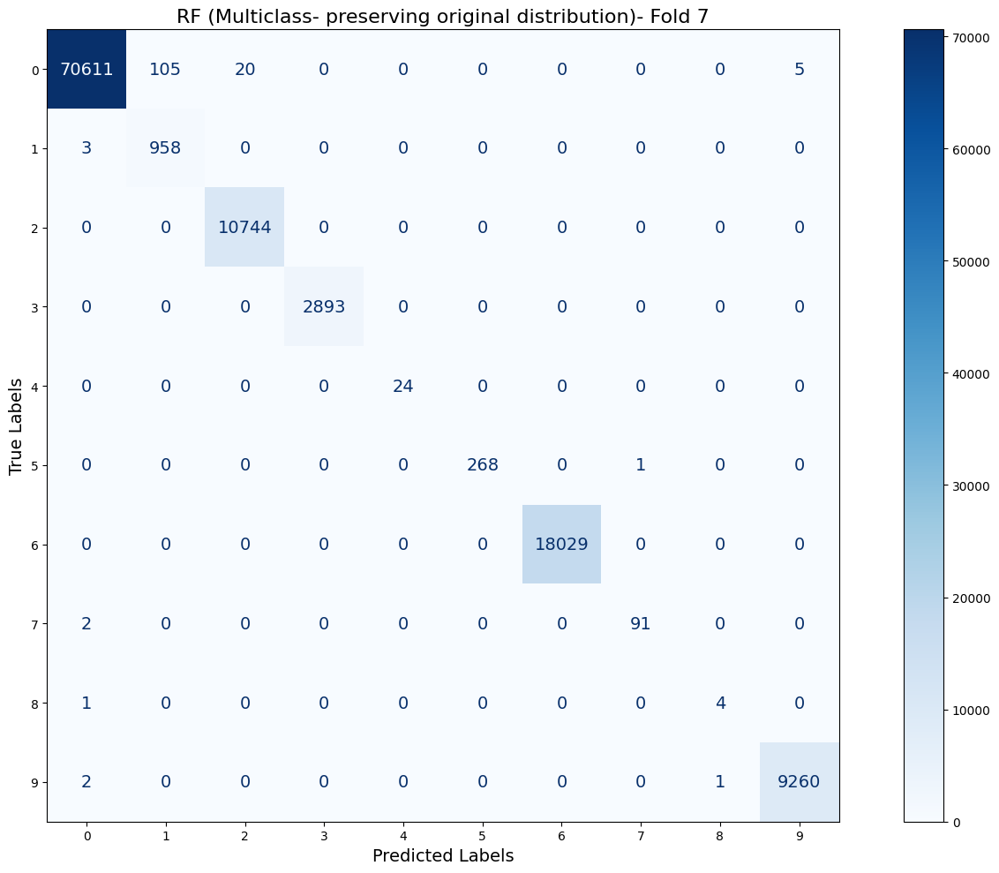

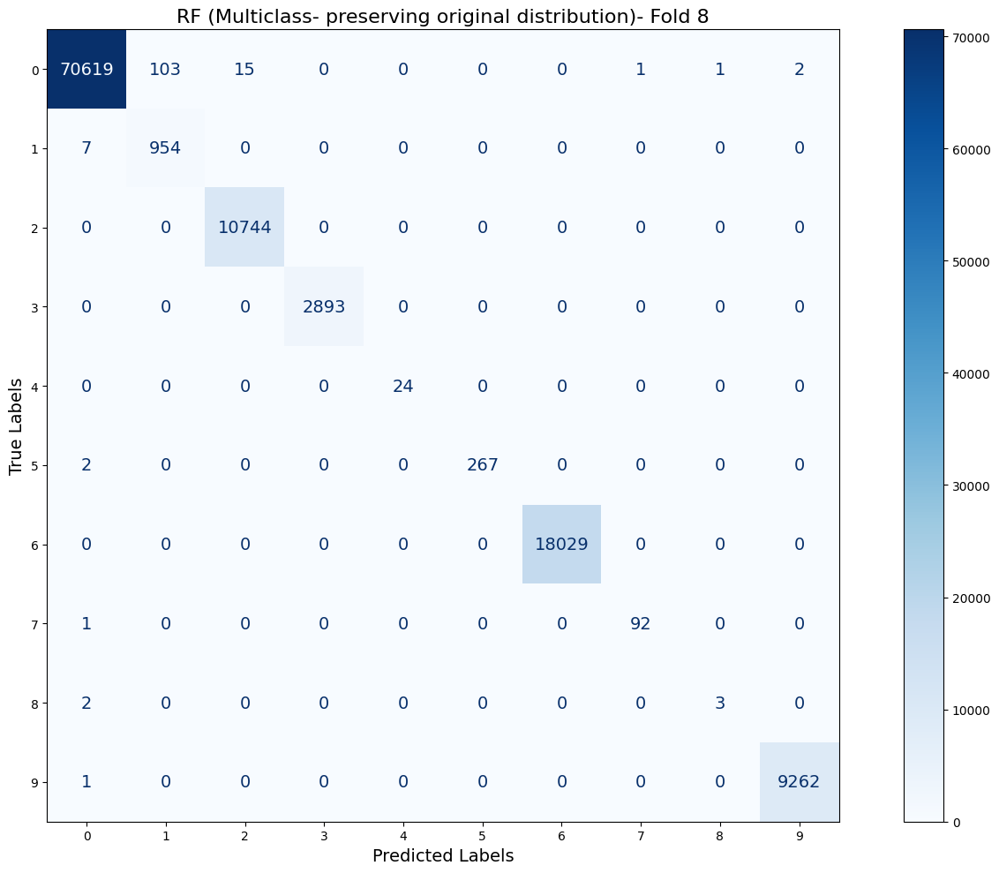

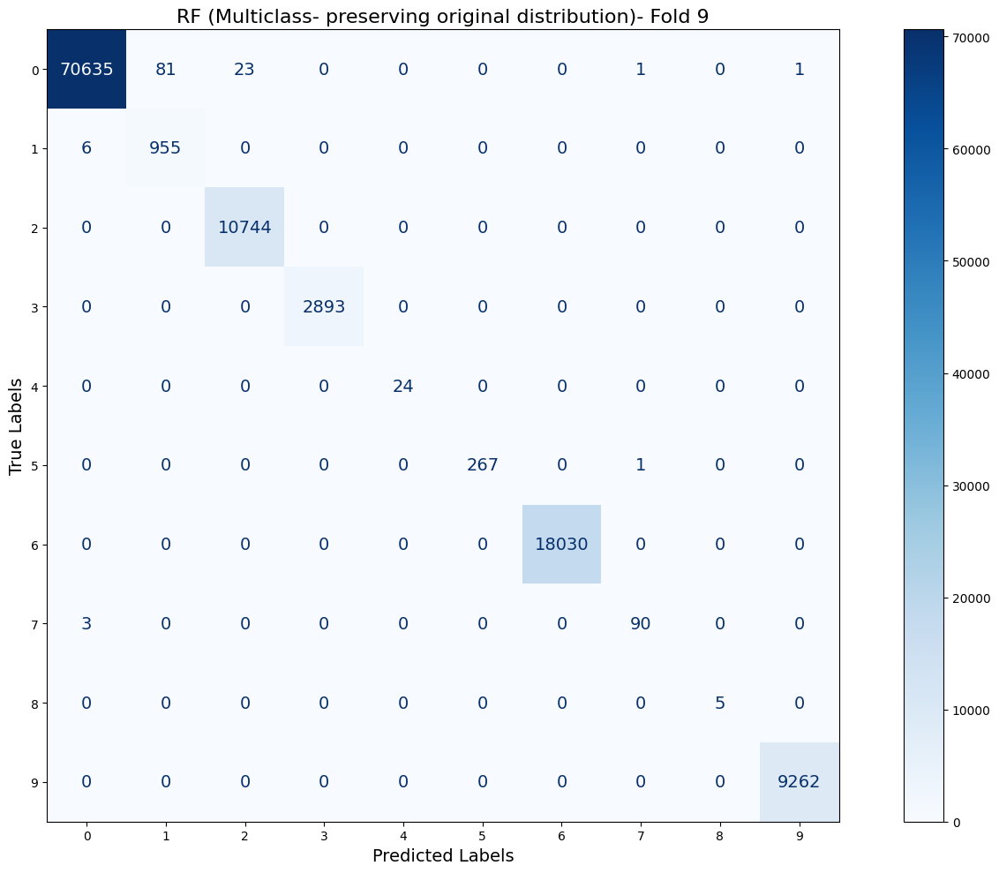

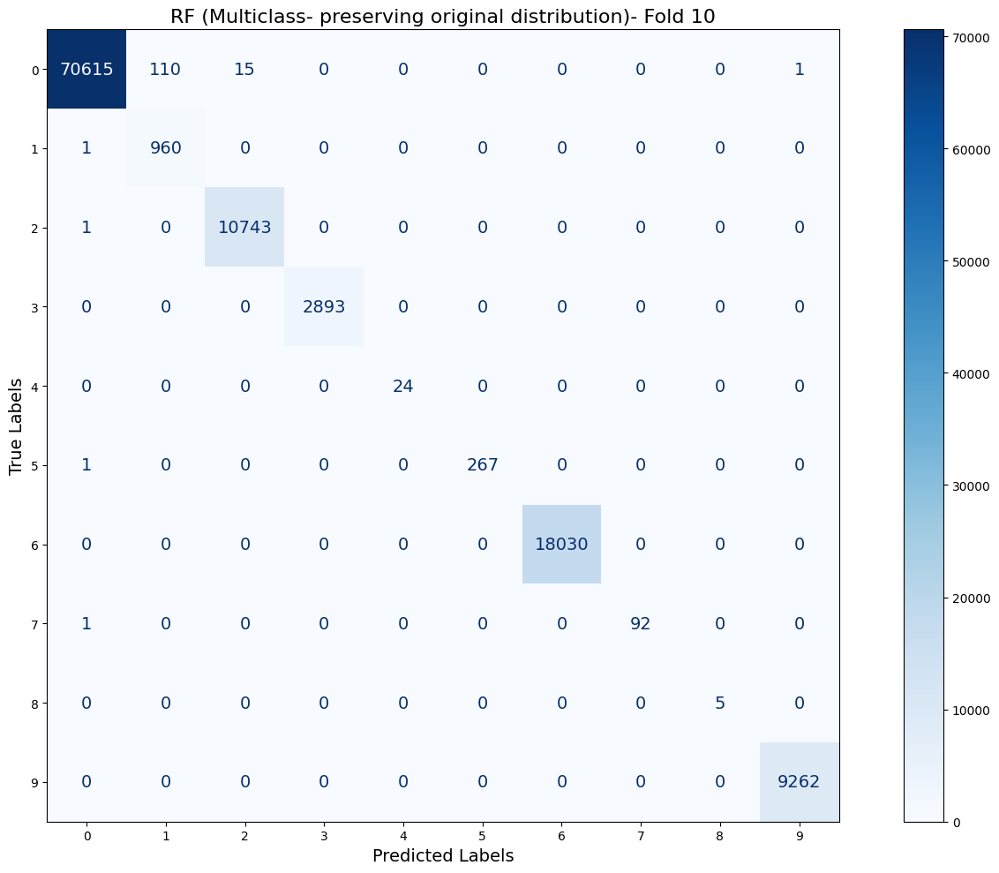

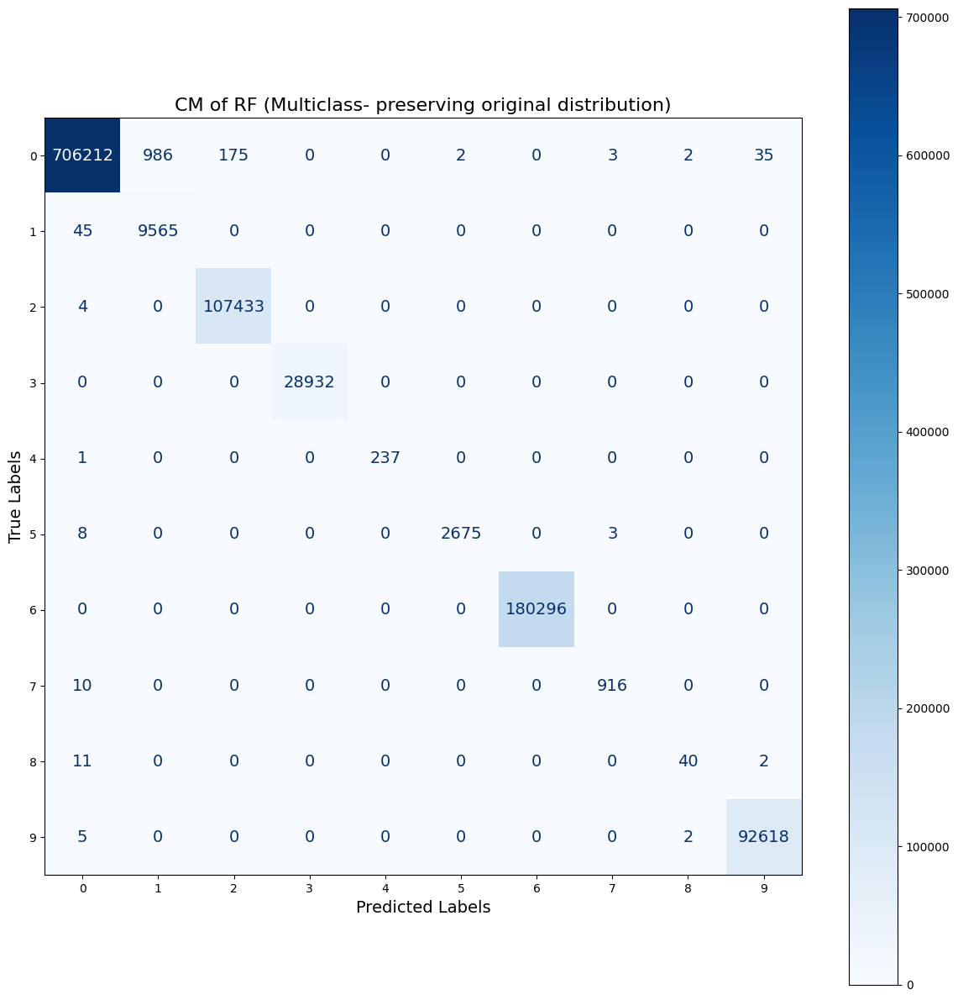

In [25]:
##random forest
rf_model_2 = RandomForestClassifier(random_state=42)

# # Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_under_sampled_preserve_pca, y_under_sampled_preserve, rf_model_2, classes)

# Unpack metrics
rf_accuracy, rf_precision, rf_recall, rf_f1, rf_conf_matrices, rf_roc_data = metrics
print("Random Forest  Metrics (Multiclass- preserving original distribution) (Average over 10 Folds):")
print(f"Accuracy: {np.mean(rf_accuracy):.4f}")
print(f"Precision: {np.mean(rf_precision):.4f}")
print(f"Recall: {np.mean(rf_recall):.4f}")
print(f"F1 Score: {np.mean(rf_f1):.4f}")

# # Save model and metrics 
model_rf_results2 = {
    'model': rf_model_2,
    'accuracy': rf_accuracy,
    'precision': rf_precision,
    'recall': rf_recall,
    'f1': rf_f1,
    'conf_matrices': rf_conf_matrices,
}
joblib.dump(model_rf_results2, 'last_model_rf_results2.pkl')

# # Plot ROC curve
plot_roc_curve(rf_roc_data, 'RF (Multiclass- preserving original distribution)')

plot_multiclass_matrices(rf_conf_matrices, "RF (Multiclass- preserving original distribution)") 

final_cm = aggregate_conf_matrices(rf_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of RF (Multiclass- preserving original distribution)")

rf takes 142m 38.2s

# **binary class classification**

In [6]:
X = joblib.load('last_scaled_X64.pkl')
y = joblib.load('last_y.pkl')


In [4]:
type(X)

pandas.core.frame.DataFrame

In [7]:
def optimized_check_standardization(X):
    """
    Check if features in a DataFrame are standardized (mean ≈ 0, std ≈ 1)
    with memory-efficient processing.
    """
    is_standardized = []
    
    for col in X.columns:
        # Calculate mean and std for each column
        mean = X[col].mean()
        std = X[col].std()
        
        # Check standardization condition
        standardized = abs(mean) < 1e-5 and abs(std - 1) < 1e-5
        is_standardized.append(standardized)

    # Convert result to a Pandas Series
    is_standardized = pd.Series(is_standardized, index=X.columns)
    return is_standardized


In [8]:
is_standardized = optimized_check_standardization(X) 
print("\nAre features standardized?")
print(is_standardized)


Are features standardized?
dst_port                  True
ip_prot                   True
flow_duration             True
down_up_ratio             True
pkt_len_max               True
                          ... 
fwd_subflow_pkt_mean      True
bwd_subflow_bytes_mean    True
bwd_subflow_pkt_mean      True
fwd_tcp_init_win_bytes    True
bwd_tcp_init_win_bytes    True
Length: 77, dtype: bool


In [9]:
y_binary = y.apply((lambda x: 0 if x == 'Benign' else 1))

In [8]:
y_binary.unique()

array([0, 1])

C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_1316\2062140680.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


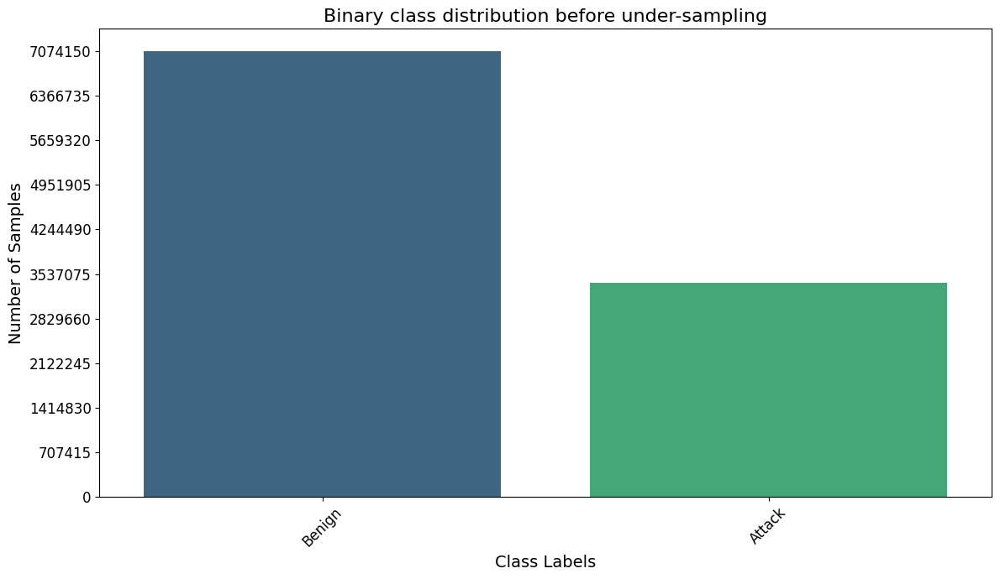

In [11]:
label_mapping = {0: 'Benign', 1: 'Attack'}

class_distribution_sampling(y_binary, label_mapping, "Binary class distribution before under-sampling")

rewrite
####  Number of benign network flows in relation to malicious flows

Plotting the numbers of benign network flows versus malicious network flows shows that the dataset is  skewed in favor of benign network flows which account for ~67.6% of all data.
rewrite bengig 76.6% attack 32.4% this is not an extremely imbalanced dataset, As a rule of thumb, if a two-class dataset has a difference of greater than 65% to 35% it should be looked at as a dataset with class imbalance
but I will apply as well two undersampling techniques to reduce dataset size and compuation size
1- Equal class distribution RUS
2- Stratified RUS

## *binary class classification - Equal Class Distribution Under-Sampling*

In [10]:
# Undersample majority class (Benign) 
undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)
X_binary_under_sampled, y_binary_under_sampled = undersampler.fit_resample(X, y_binary)

print(f"Original binary class distribution:\n{Counter(y_binary)}")
print(f"Undersampled binary class distribution:\n{Counter(y_binary_under_sampled)}")

Original binary class distribution:
Counter({0: 7074151, 1: 3394439})
Undersampled binary class distribution:
Counter({0: 3394439, 1: 3394439})


In [1]:
7074151/(7074151+3394439)*100

67.57501248974313

C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_1316\2062140680.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


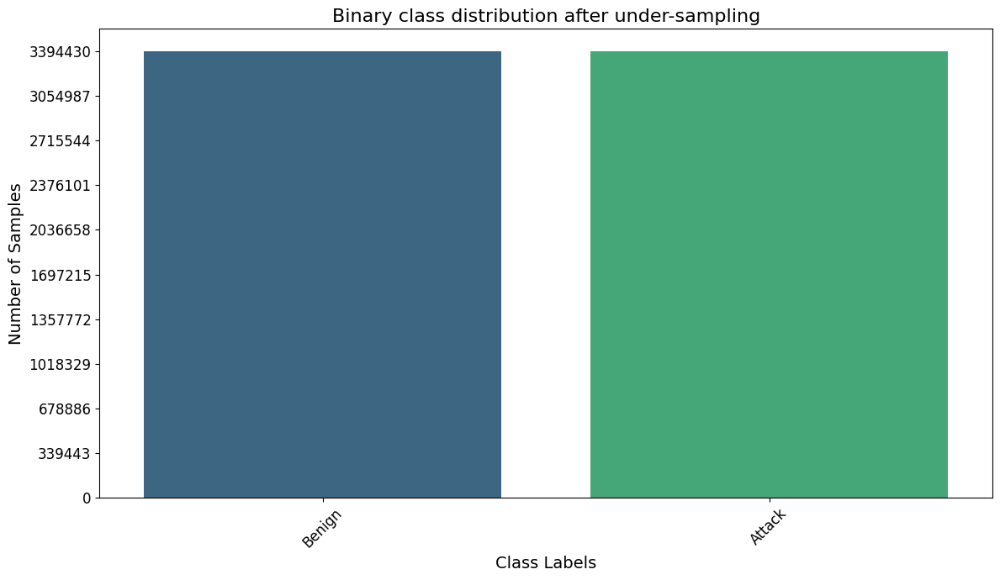

In [13]:
label_mapping = {0: 'Benign', 1: 'Attack'}
class_distribution_sampling(y_binary_under_sampled, label_mapping, "Binary class distribution after under-sampling")

In [14]:
joblib.dump(X_binary_under_sampled, 'last_X_binary_under_sampled.pkl')
joblib.dump(y_binary_under_sampled, 'last_y_binary_under_sampled.pkl')

['last_y_binary_under_sampled.pkl']

Number of components to retain 95.0% variance: 26


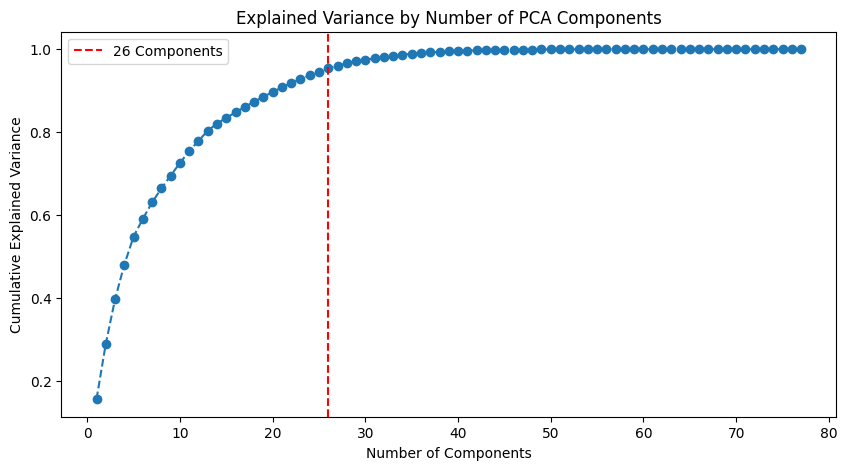

MemoryError: Unable to allocate 3.89 GiB for an array with shape (77, 6788878) and data type float64

In [15]:
optimal_components = determine_optimal_components(X_binary_under_sampled)

# Step 3: Apply PCA with the optimal number of components
pca = IncrementalPCA(n_components=optimal_components)  # Use IncrementalPCA to reduce memory usage
X_binary_under_sampled_pca = pca.fit_transform(X_binary_under_sampled)

# Step 4: Convert PCA-transformed datasets back to DataFrames
pca_columns = [f"PC{i+1}" for i in range(optimal_components)]
X_binary_under_sampled_pca = pd.DataFrame(X_binary_under_sampled_pca, columns=pca_columns)

# Print the shape of the transformed datasets
print(f"Shape of training set after PCA: {X_binary_under_sampled_pca.shape}")

In [20]:
joblib.dump(X_binary_under_sampled_pca, 'last_No_cluster_X_binary_undersampled_pca.pkl')

['last_No_cluster_X_binary_undersampled_pca.pkl']


# Feature Contribution Analysis for Principal Components

The contributions of original features to each principal component are analyzed to understand their importance. The top contributing features for each component are identified, providing insights into the dataset's most influential variables.

In [21]:
# Print the original features most associated with the principal components
feature_names = X_binary_under_sampled.columns  # Assuming X_resampled is a DataFrame with feature names

components = pd.DataFrame(
    pca.components_, 
    columns=feature_names, 
    index=[f"PC{i+1}" for i in range(optimal_components)]
)

# Display the top contributing features for each principal component
for i in range(optimal_components):
    print(f"\nTop contributing features for Principal Component {i+1}:")
    top_features = components.iloc[i].sort_values(ascending=False).head(10)  # Top 10 features
    print(top_features)



Top contributing features for Principal Component 1:
iat_max          0.260606
idle_max         0.259538
fwd_iat_max      0.258293
idle_mean        0.257213
bwd_iat_max      0.256617
iat_std          0.254281
idle_min         0.251701
fwd_iat_std      0.238917
flow_duration    0.237194
fwd_iat_tot      0.234533
Name: PC1, dtype: float64

Top contributing features for Principal Component 2:
fwd_subflow_pkt_mean      0.410550
fwd_pkt_cnt               0.410501
fwd_bulk_pkt_mean         0.410409
fwd_non_empty_pkt_cnt     0.410121
fwd_pkt_hdr_len_tot       0.409426
fwd_subflow_bytes_mean    0.230373
fwd_bulk_bytes_mean       0.209065
fwd_pkt_len_tot           0.187662
ip_prot                   0.027563
bwd_subflow_pkt_mean      0.024807
Name: PC2, dtype: float64

Top contributing features for Principal Component 3:
bwd_pkt_hdr_len_tot       0.315574
bwd_pkt_cnt               0.315157
bwd_non_empty_pkt_cnt     0.314273
bwd_pkt_len_tot           0.309268
flag_ack                  0.305334
b

In [23]:
# Determine the optimal number of clusters
optimal_clusters = determine_optimal_clusters(X_binary_under_sampled_pca)

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_binary_under_sampled_pca['Kmeans_Cluster_Label'] = kmeans.fit_predict(X_binary_under_sampled_pca)
# Print cluster distribution
print("Kmeans Cluster distribution:\n", X_binary_under_sampled_pca['Kmeans_Cluster_Label'].value_counts())
print(f'shape after adding Kmeans Cluster label {X_binary_under_sampled_pca.shape}')

gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
# Fit and predict cluster labels
X_binary_under_sampled_pca['GMM_Cluster_Label'] = gmm.fit_predict(X_binary_under_sampled_pca)

# Print cluster distribution
print("Gaussian Mixture cluster distribution:\n", X_binary_under_sampled_pca['GMM_Cluster_Label'].value_counts())
print(f'Shape after adding GM Cluster label: {X_binary_under_sampled_pca.shape}')  # Should be (,6)

# Save the dataset with labels
joblib.dump(X_binary_under_sampled_pca, 'last_X_binary_under_sampled_SFE_PCA2')


KeyboardInterrupt: 

 rewrite
  #### **as the previous code takes too long I can use just a sample from the data to determine the best number of clusters and then apply it to the whole dataset**

### Random Sampling for Cluster Analysis
This step samples a suitable number of rows (e.g., 100,000) from the dataset `X_resampled_pca` for cluster analysis to speed up the process. Then, the function to determine the optimal number of clusters is called to find the best number of clusters using the silhouette score.


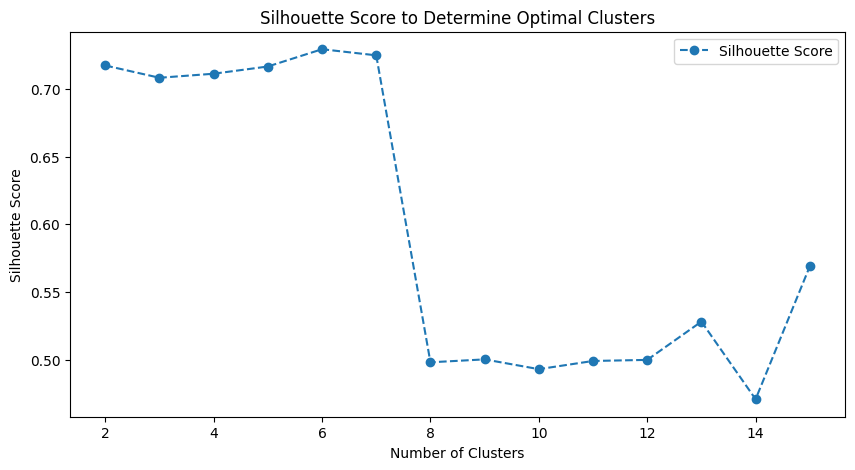

Optimal number of clusters based on silhouette score: 6
Kmeans Cluster distribution:
 Kmeans_Cluster_Label
0    3840366
4    2597683
1     281695
5      64838
3       2323
2       1973
Name: count, dtype: int64
shape after adding Kmeans Cluster label (6788878, 27)
Gaussian Mixture cluster distribution:
 GMM_Cluster_Label
0    3390274
3    2182057
2     615379
4     555867
5      42978
1       2323
Name: count, dtype: int64
Shape after adding GM Cluster label: (6788878, 28)


['last_X_binary_under_sampled_SFE_PCA2']

In [24]:
sample_size = 10000
X_sampled = X_binary_under_sampled_pca.sample(n=sample_size, random_state=42)


# Determine the optimal number of clusters
# optimal_clusters = determine_optimal_clusters(X_resampled_pca)
optimal_clusters = determine_optimal_clusters(X_sampled)

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_binary_under_sampled_pca['Kmeans_Cluster_Label'] = kmeans.fit_predict(X_binary_under_sampled_pca)
# Print cluster distribution
print("Kmeans Cluster distribution:\n", X_binary_under_sampled_pca['Kmeans_Cluster_Label'].value_counts())
print(f'shape after adding Kmeans Cluster label {X_binary_under_sampled_pca.shape}')

gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
# Fit and predict cluster labels
X_binary_under_sampled_pca['GMM_Cluster_Label'] = gmm.fit_predict(X_binary_under_sampled_pca)


# Print cluster distribution
print("Gaussian Mixture cluster distribution:\n", X_binary_under_sampled_pca['GMM_Cluster_Label'].value_counts())
print(f'Shape after adding GM Cluster label: {X_binary_under_sampled_pca.shape}')  # Should be (,6)

# Save the dataset with labels
joblib.dump(X_binary_under_sampled_pca, 'last_X_binary_under_sampled_SFE_PCA2')


In [15]:
X_binary_under_sampled_pca = joblib.load('last_X_binary_under_sampled_SFE_PCA2')
y_binary_under_sampled = joblib.load('last_y_binary_under_sampled.pkl')

In [7]:
X_binary_under_sampled_pca.shape

(6788878, 28)

In [9]:
X_binary_under_sampled_pca.columns

Index(['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10',
       'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18', 'PC19',
       'PC20', 'PC21', 'PC22', 'PC23', 'PC24', 'PC25', 'PC26',
       'Kmeans_Cluster_Label', 'GMM_Cluster_Label'],
      dtype='object')

### k-Fold Cross-Validation Setup
This section sets up a 10-fold cross-validation with `StratifiedKFold`. The target variable `y_binary_under_sampled` is used for stratified sampling to ensure that each fold has a similar distribution of classes.


In [16]:
# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_binary_under_sampled.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

Number of classes: 2


#### *Decision Tree Training and Evaluation* 

Decision Tree Metrics for binary classification(Average over 10 Folds):
Accuracy: 0.9982
Precision: 0.9982
Recall: 0.9982
F1 Score: 0.9982


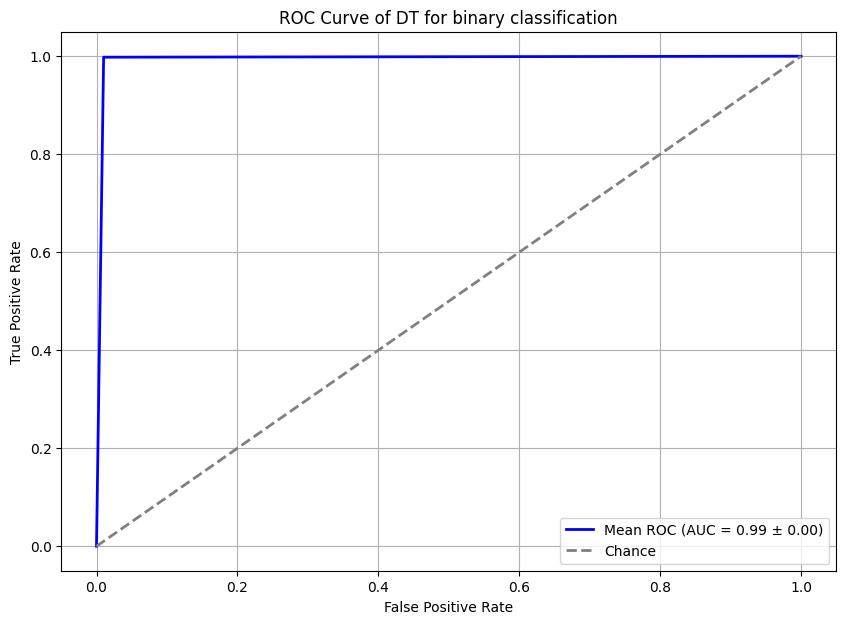

In [39]:
dt_model_binary = DecisionTreeClassifier(random_state=42)
# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca, y_binary_under_sampled, dt_model_binary, classes)

# Unpack metrics
dt_accuracy, dt_precision, dt_recall, dt_f1, dt_conf_matrices, dt_roc_data = metrics
print("Decision Tree Metrics for binary classification(Average over 10 Folds):")
print(f"Accuracy: {np.mean(dt_accuracy):.4f}")
print(f"Precision: {np.mean(dt_precision):.4f}")
print(f"Recall: {np.mean(dt_recall):.4f}")
print(f"F1 Score: {np.mean(dt_f1):.4f}")

# Plot ROC curve
plot_roc_curve(dt_roc_data, 'DT for binary classification')

In [40]:
# Save model and metrics 
model_dt_binary_results = {
    'model': dt_model_binary,
    'accuracy': dt_accuracy,
    'precision': dt_precision,
    'recall': dt_recall,
    'f1': dt_f1,
    'conf_matrices': dt_conf_matrices,
}
joblib.dump(model_dt_binary_results, 'last_dt_binary_with_metrics.pkl')


['last_dt_binary_with_metrics.pkl']

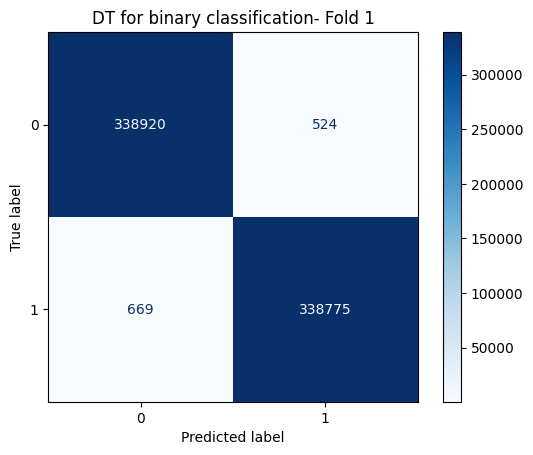

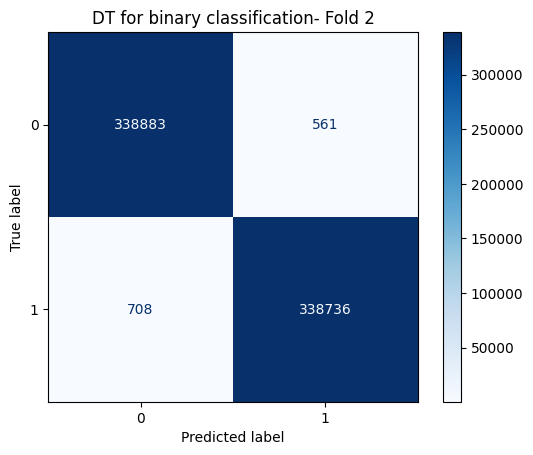

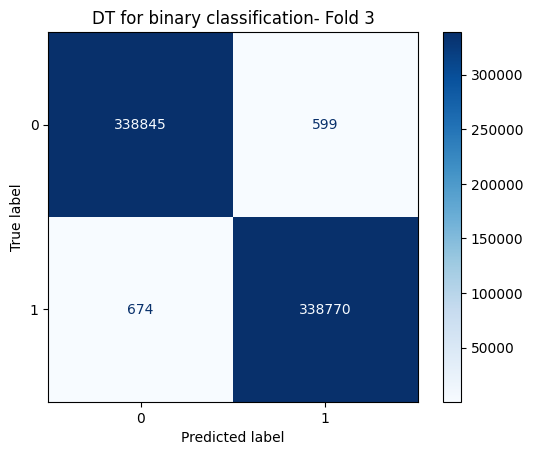

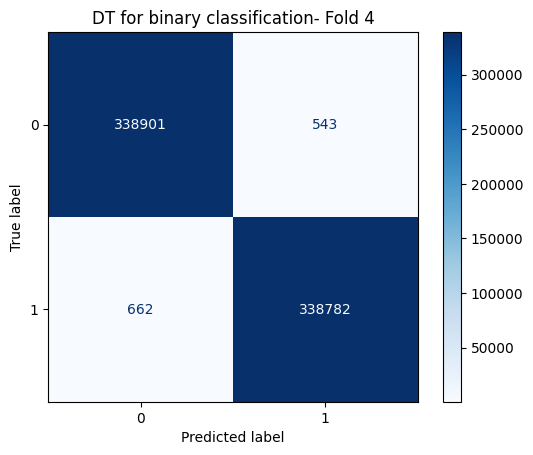

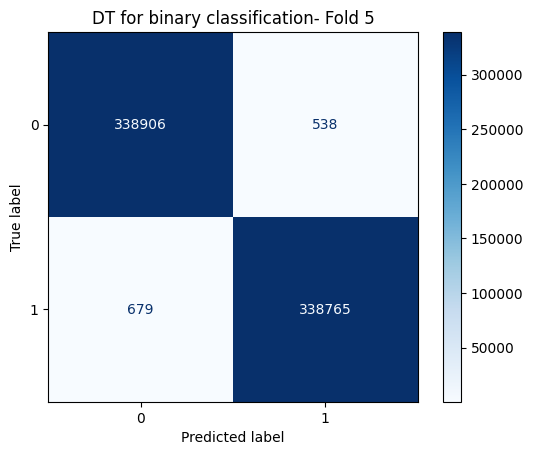

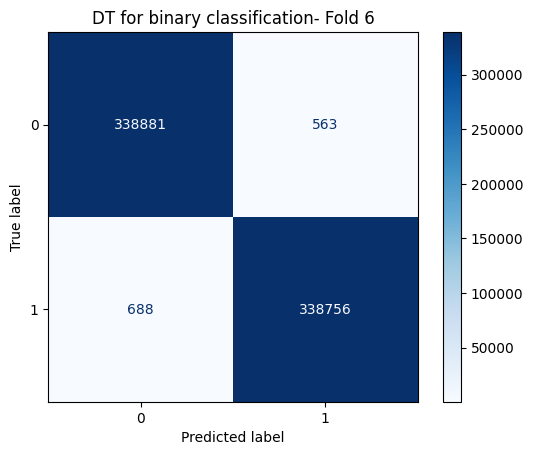

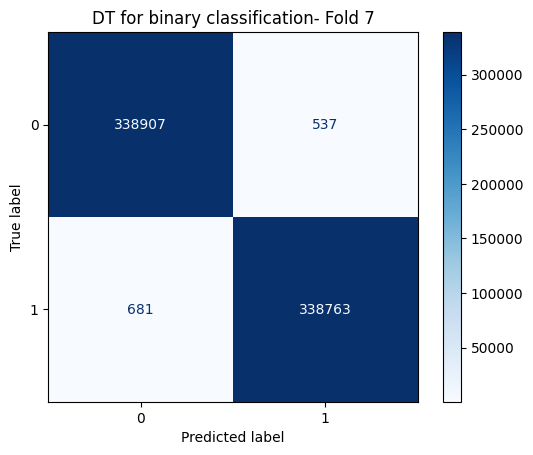

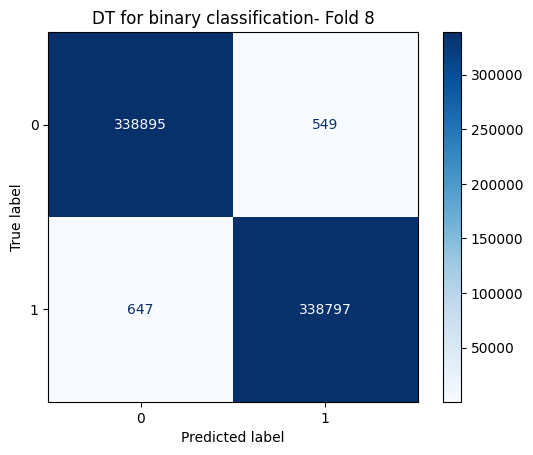

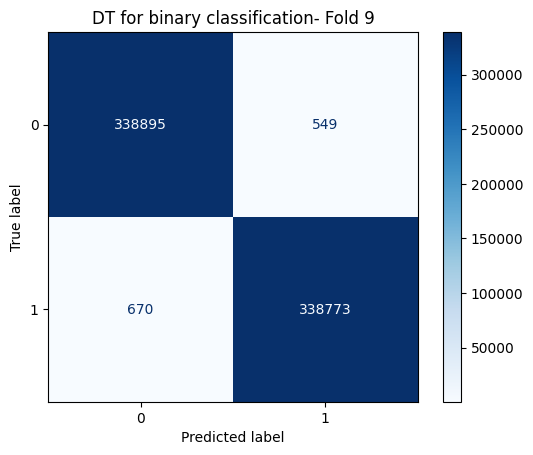

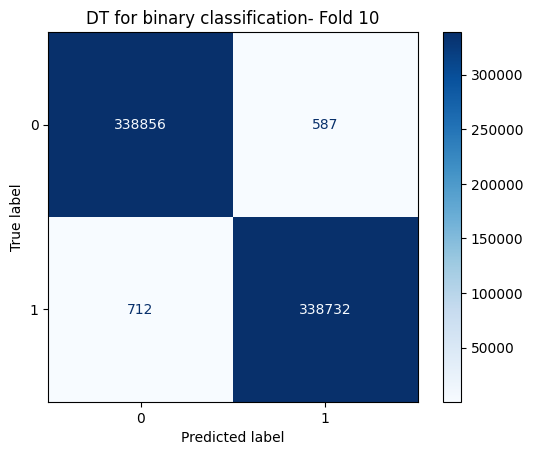

In [42]:
plot_conf_matrices(dt_conf_matrices, "DT for binary classification")

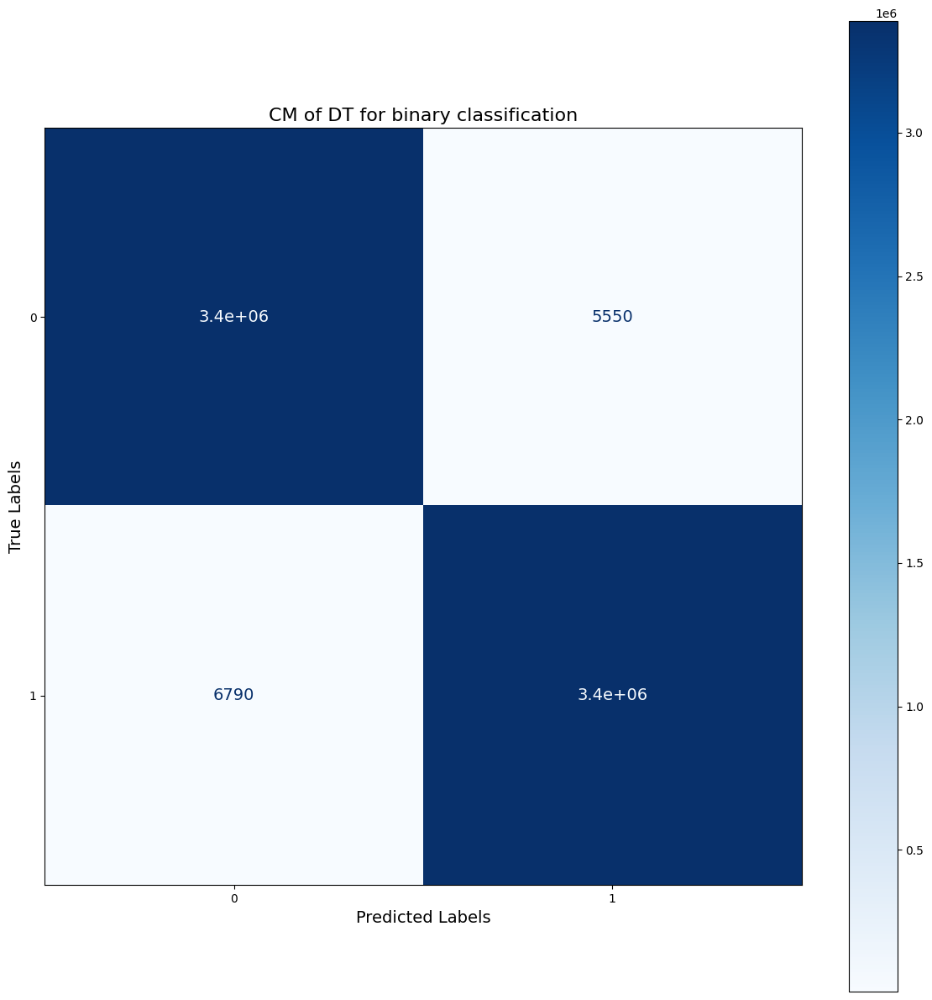

In [41]:
final_cm = aggregate_conf_matrices(dt_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of DT for binary classification")


#### *Random Forest Training and Evaluation*

In [9]:
rf_model = RandomForestClassifier(random_state=42, n_jobs=-1)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca, y_binary_under_sampled, rf_model, classes)

# Unpack metrics
accuracy, precision, recall, f1, conf_matrices, roc_data = metrics
print("Random Forest Metrics for binary classification(Average over 10 Folds):")
print(f"Accuracy: {np.mean(accuracy):.4f}")
print(f"Precision: {np.mean(precision):.4f}")
print(f"Recall: {np.mean(recall):.4f}")
print(f"F1 Score: {np.mean(f1):.4f}")

# Plot ROC curve


Random Forest Metrics for binary classification(Average over 10 Folds):
Accuracy: 0.9991
Precision: 0.9991
Recall: 0.9991
F1 Score: 0.9991


NameError: name 'plot_roc_curve' is not defined

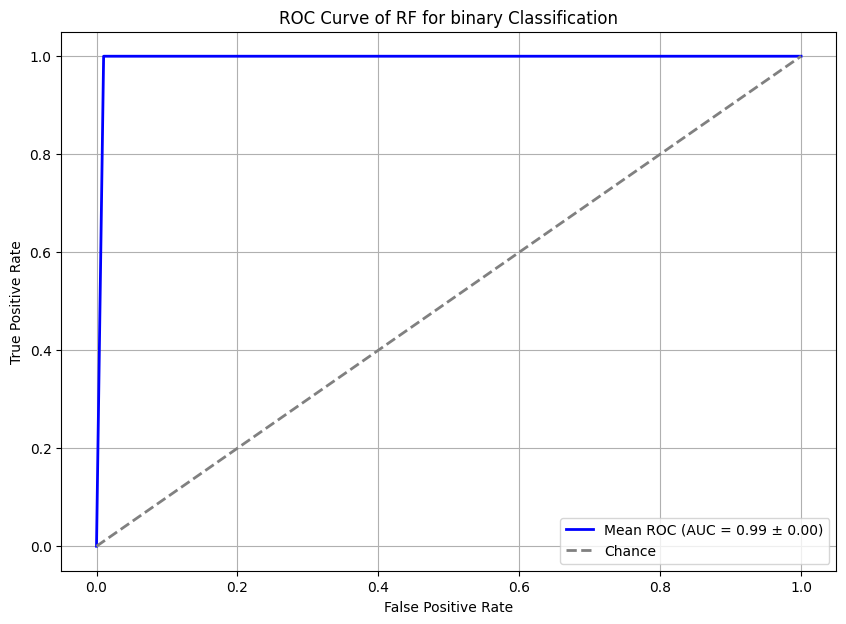

In [11]:
plot_roc_curve(roc_data, 'RF for binary Classification')


In [12]:
# Save model and metrics 
model_rf_binary_results = {
    'model': rf_model,
    'accuracy': accuracy,
    'precision': precision,
    'recall': recall,
    'f1': f1,
    'conf_matrices': conf_matrices,
}
joblib.dump(model_rf_binary_results, 'last_rf_binary_with_metrics.pkl')


['last_rf_binary_with_metrics.pkl']

In [19]:
model_rf_binary_results = joblib.load('last_rf_binary_with_metrics.pkl')
conf_matrices = model_rf_binary_results['conf_matrices']

In [13]:
model_rf_binary_results

{'model': RandomForestClassifier(n_jobs=-1, random_state=42),
 'accuracy': [0.9991795406606097,
  0.9991220937768822,
  0.9990617008991174,
  0.9991618646963859,
  0.999153026714274,
  0.9991220937768822,
  0.9991721756755164,
  0.999144188732162,
  0.9991486064691179,
  0.9990852675040176],
 'precision': [0.9991808274712052,
  0.9991235011895555,
  0.9990633820067721,
  0.9991632184197327,
  0.9991543419444905,
  0.999123540973229,
  0.9991735053176932,
  0.9991455716228271,
  0.999149974731377,
  0.9990868320538558],
 'recall': [0.9991795406606097,
  0.9991220937768822,
  0.9990617008991174,
  0.9991618646963859,
  0.999153026714274,
  0.9991220937768822,
  0.9991721756755164,
  0.999144188732162,
  0.9991486064691179,
  0.9990852675040176],
 'f1': [0.9991795401318553,
  0.9991220931580087,
  0.9990617001089457,
  0.9991618641281329,
  0.9991530261563475,
  0.9991220931405148,
  0.9991721751242498,
  0.9991441881394019,
  0.9991486058866998,
  0.9990852667859417],
 'conf_matrices': [

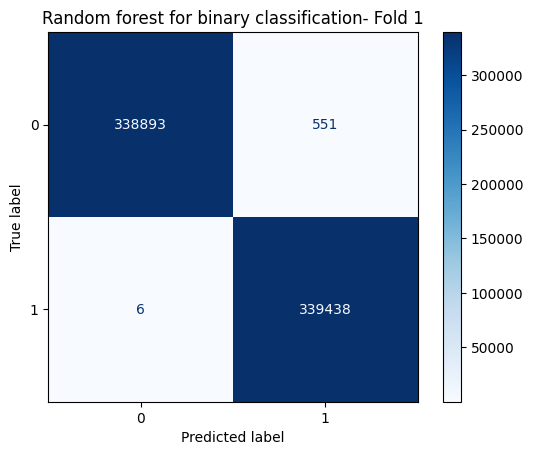

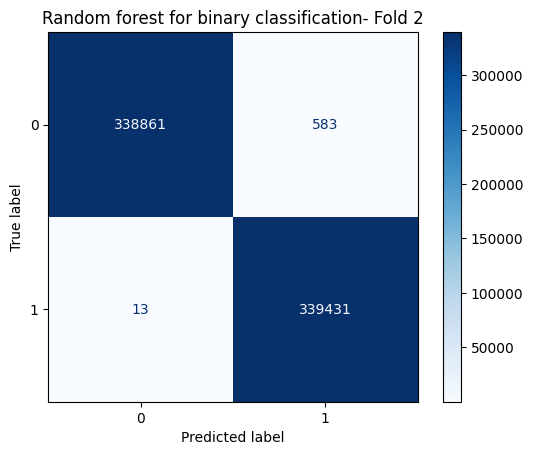

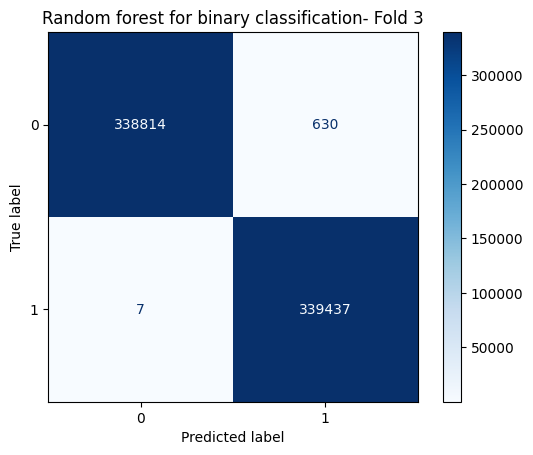

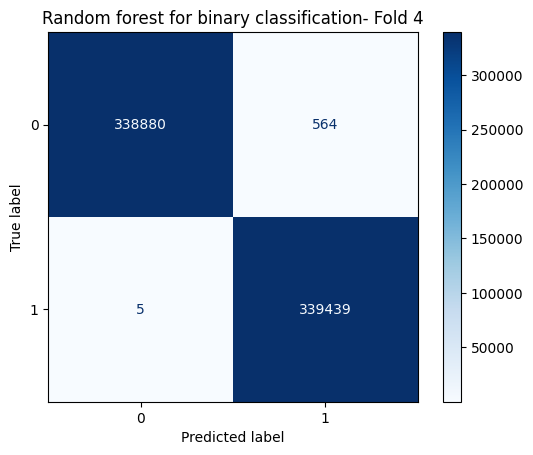

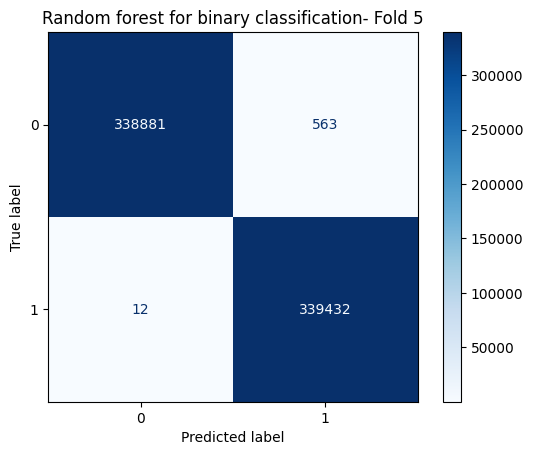

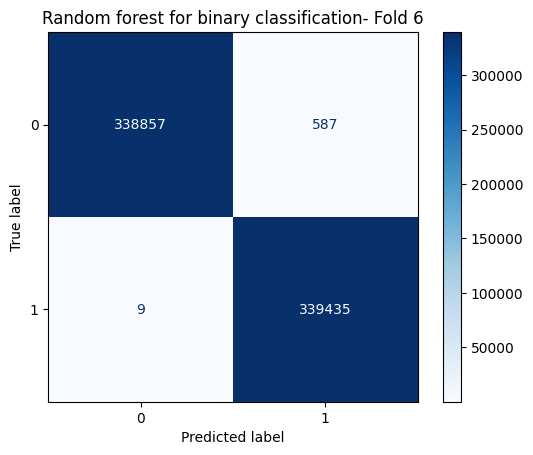

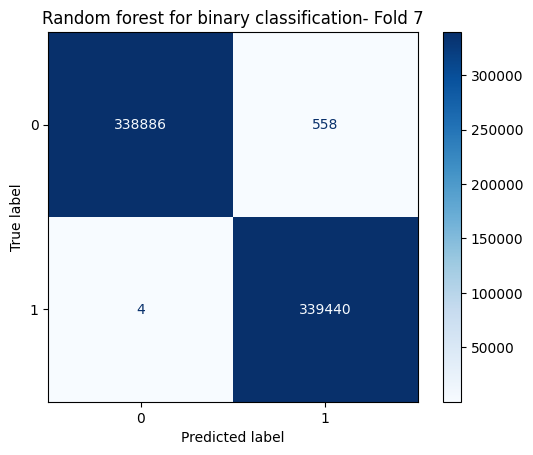

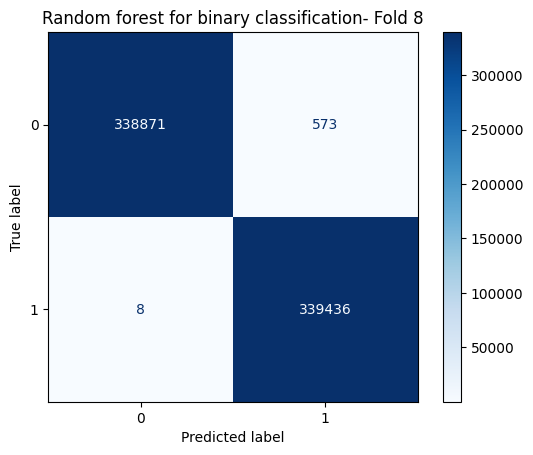

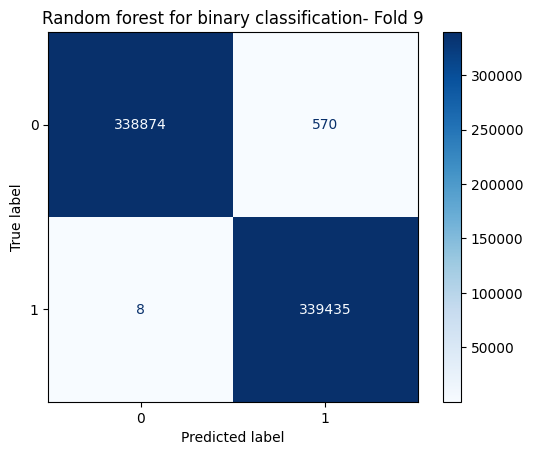

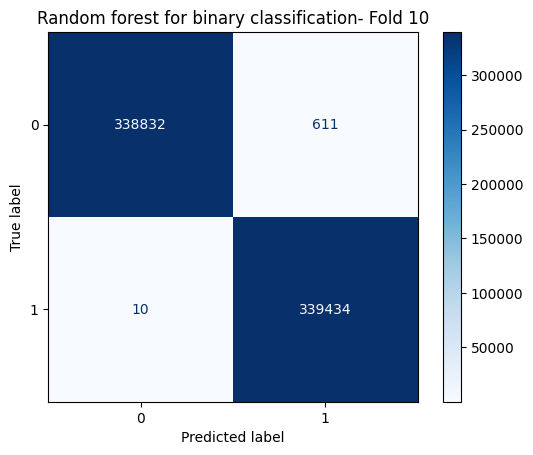

In [20]:
plot_conf_matrices(conf_matrices, "Random forest for binary classification")

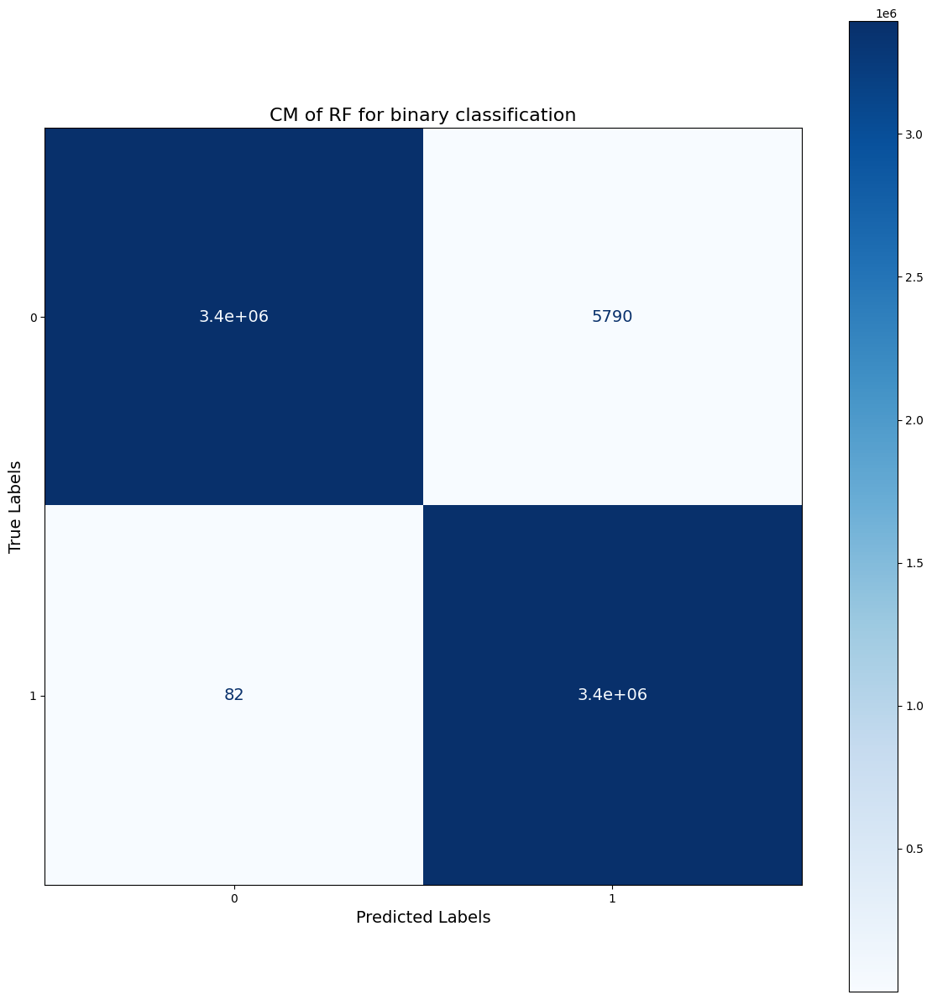

In [18]:
final_cm = aggregate_conf_matrices(conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of RF for binary classification")


rf takes 4 hours and half

3.4e+06 means 3.4 × 10^6, which is equal to 3,400,000.

#### *Extra Tree Training and Evaluation*

Extra Tree Metrics for binary classification(Average over 10 Folds):
Accuracy: 0.9991
Precision: 0.9991
Recall: 0.9991
F1 Score: 0.9991


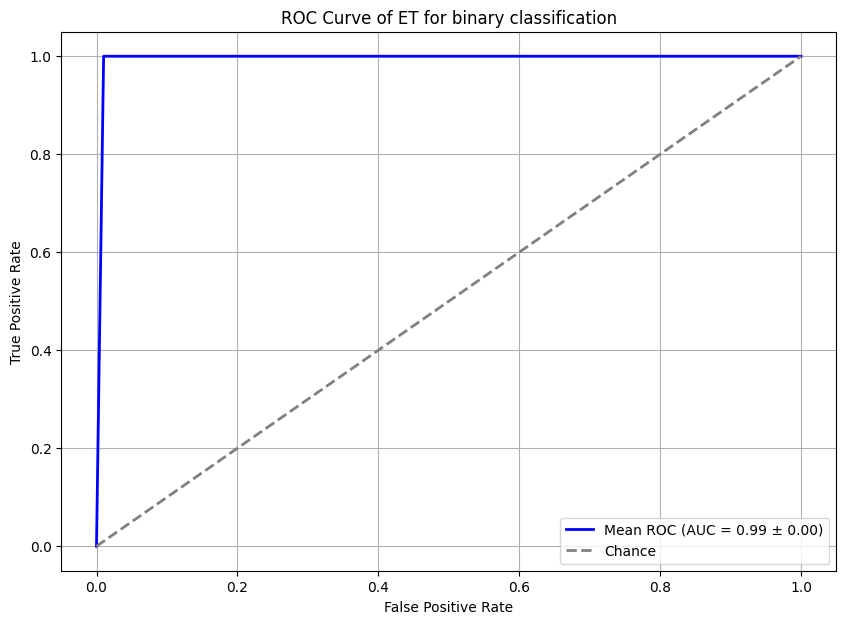

In [35]:
et_model_binary = ExtraTreesClassifier(random_state=42)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca, y_binary_under_sampled, et_model_binary, classes)

# Unpack metrics
et_accuracy, et_precision, et_recall, et_f1, et_conf_matrices, et_roc_data = metrics
print("Extra Tree Metrics for binary classification(Average over 10 Folds):")
print(f"Accuracy: {np.mean(et_accuracy):.4f}")
print(f"Precision: {np.mean(et_precision):.4f}")
print(f"Recall: {np.mean(et_recall):.4f}")
print(f"F1 Score: {np.mean(et_f1):.4f}")

# Plot ROC curve
plot_roc_curve(et_roc_data, 'ET for binary classification')


et takes 103m 12.9s (1.7 hour)

In [36]:
# Save model and metrics 
model_et_binary_results = {
    'model': et_model_binary,
    'accuracy': et_accuracy,
    'precision': et_precision,
    'recall': et_recall,
    'f1': et_f1,
    'conf_matrices': et_conf_matrices,
}
joblib.dump(model_et_binary_results, 'last_et_binary_with_metrics.pkl')


['last_et_binary_with_metrics.pkl']

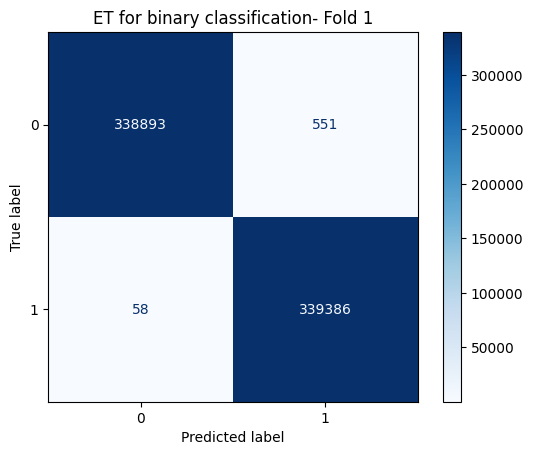

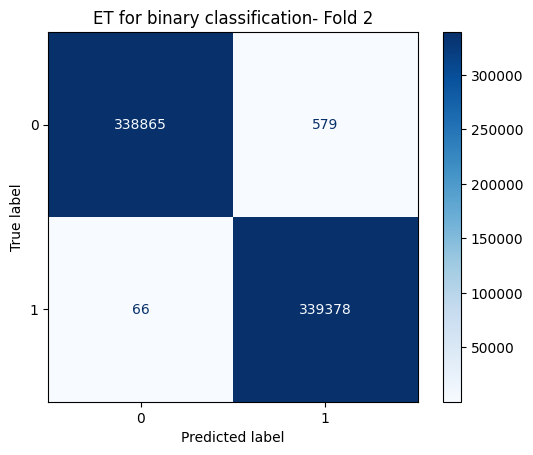

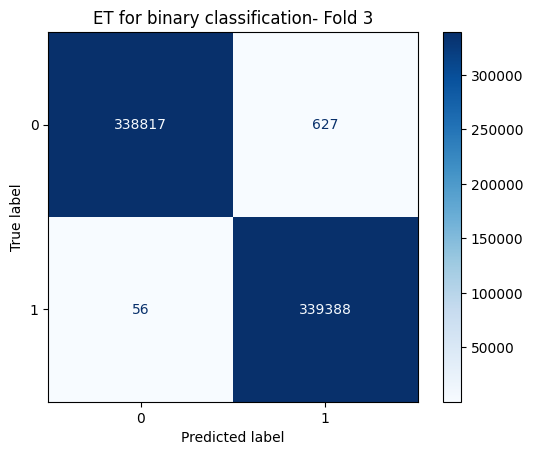

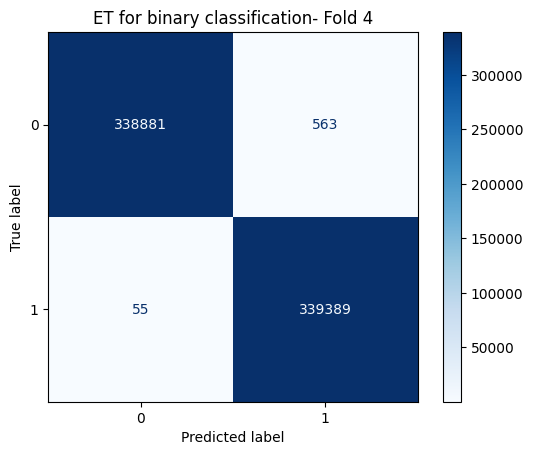

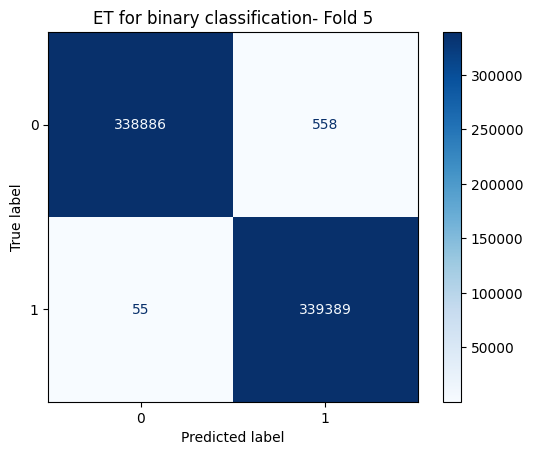

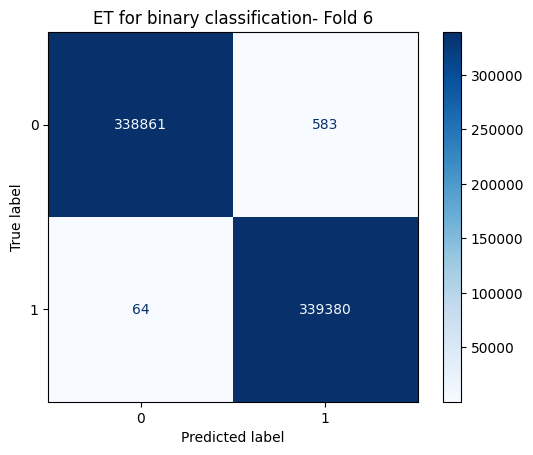

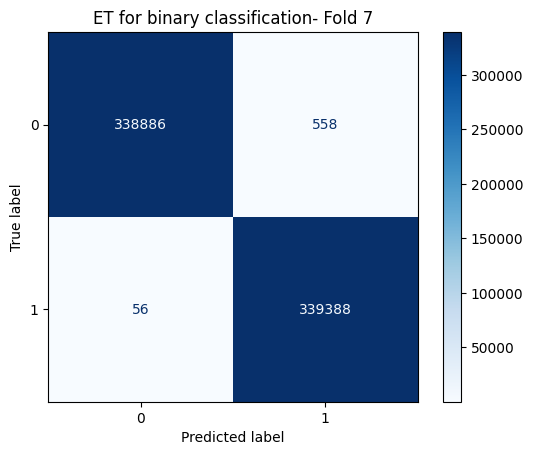

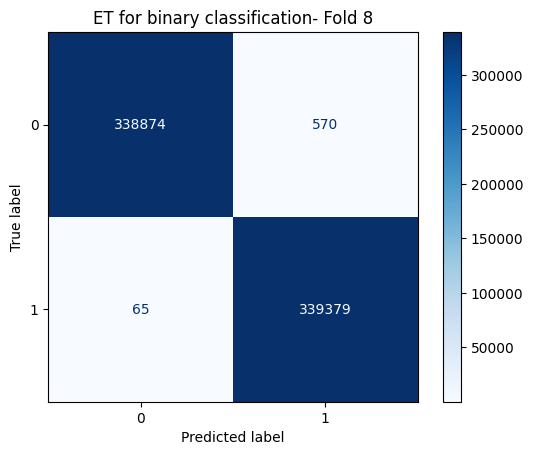

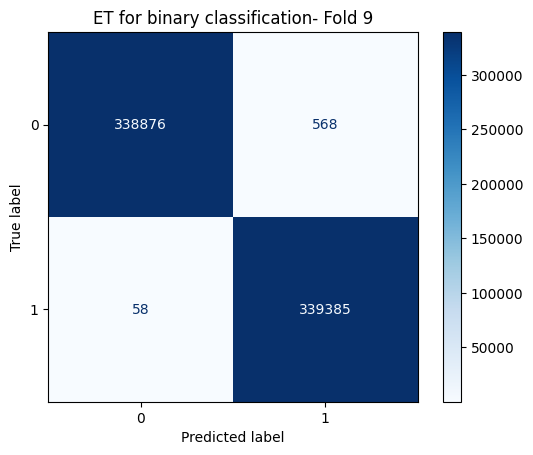

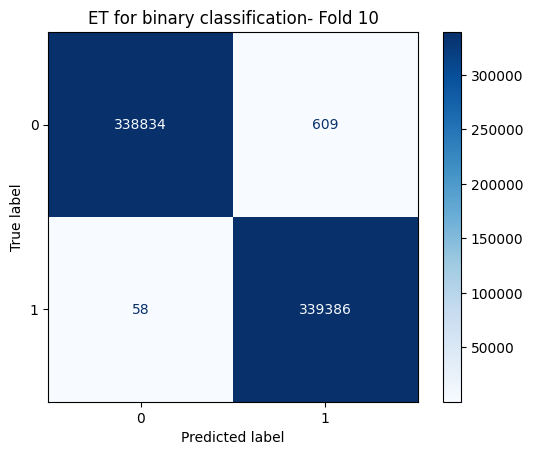

In [37]:
plot_conf_matrices(et_conf_matrices, "ET for binary classification")

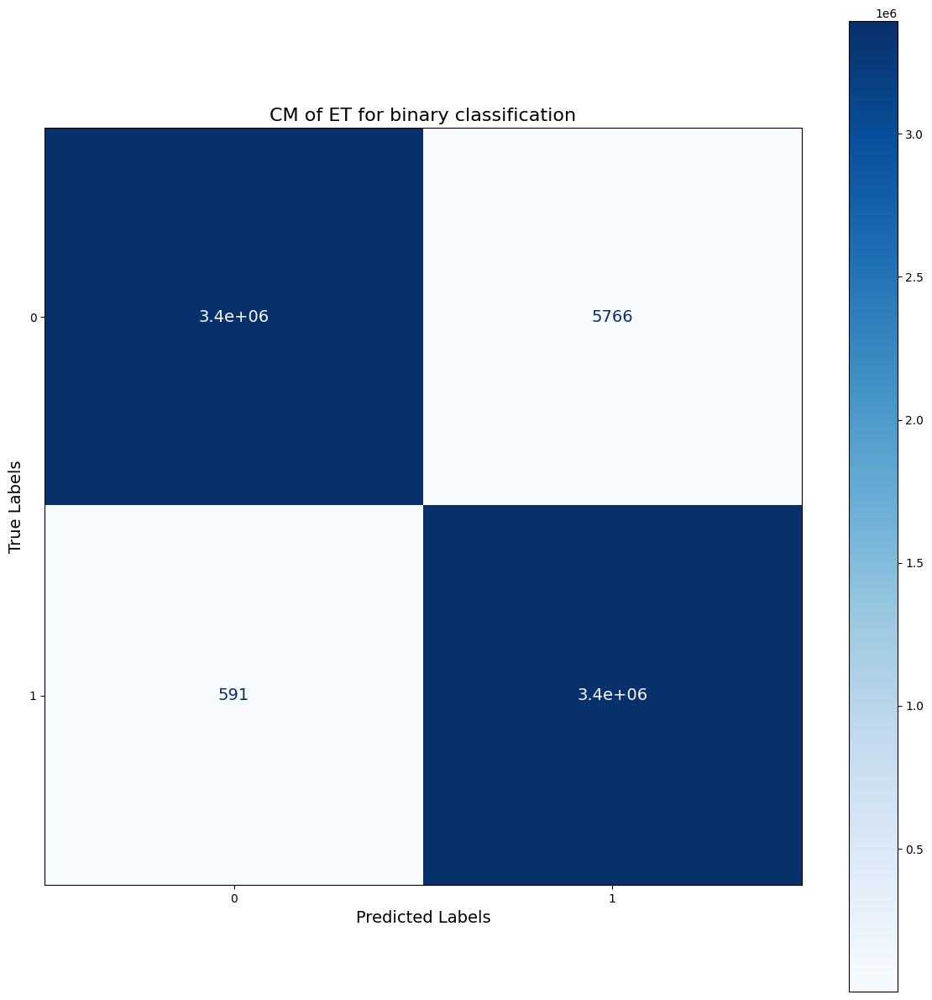

In [38]:
final_cm = aggregate_conf_matrices(et_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of ET for binary classification")


#### *Light GBM Training and Evaluation* 

[LightGBM] [Info] Number of positive: 3054995, number of negative: 3054995
[LightGBM] [Info] Total Bins 6642
[LightGBM] [Info] Number of data points in the train set: 6109990, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 3054995, number of negative: 3054995
[LightGBM] [Info] Total Bins 6642
[LightGBM] [Info] Number of data points in the train set: 6109990, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 3054995, number of negative: 3054995
[LightGBM] [Info] Total Bins 6642
[LightGBM] [Info] Number of data points in the train set: 6109990, number of used features: 28
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 3054995, number of negative: 3054995
[LightGBM] [Info] Total Bins 6642
[LightGBM] [Info] Number of data points in

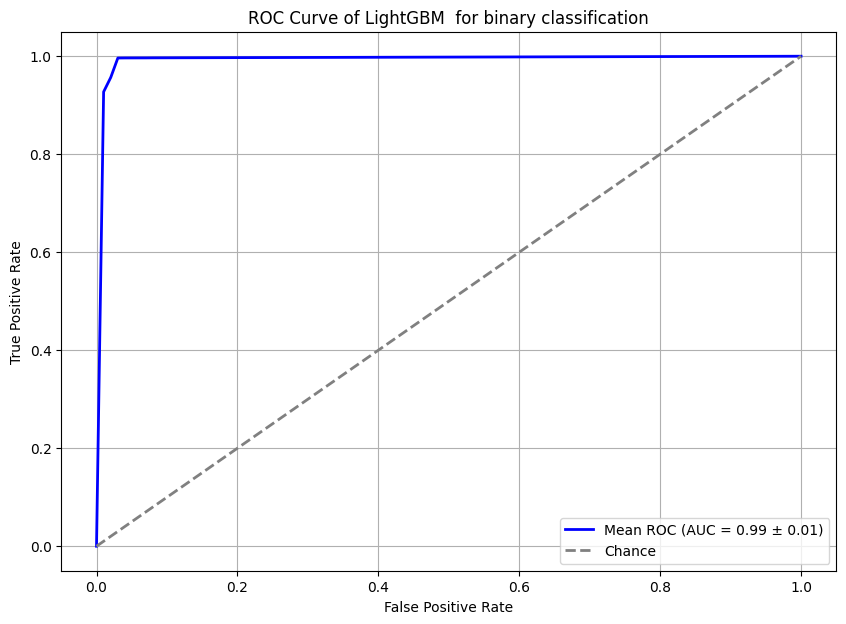

In [16]:
lgb_model_binary = lgb.LGBMClassifier(n_estimators=1000, num_leaves=31, learning_rate=0.05, n_jobs=-1, force_col_wise=True)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca, y_binary_under_sampled, lgb_model_binary, classes)

# Unpack metrics
lgb_accuracy, lgb_precision, lgb_recall, lgb_f1, lgb_conf_matrices, lgb_roc_data = metrics
print("LightGBM  Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(lgb_accuracy):.4f}")
print(f"Precision: {np.mean(lgb_precision):.4f}")
print(f"Recall: {np.mean(lgb_recall):.4f}")
print(f"F1 Score: {np.mean(lgb_f1):.4f}")
# Plot ROC curve
plot_roc_curve(lgb_roc_data, 'LightGBM  for binary classification')

# Save model and metrics 
model_lgb_binary_results = {
    'model': lgb_model_binary,
    'accuracy': lgb_accuracy,
    'precision': lgb_precision,
    'recall': lgb_recall,
    'f1': lgb_f1,
    'conf_matrices': lgb_conf_matrices,
}

joblib.dump(model_lgb_binary_results, 'last_lgb_binary_with_metrics.pkl')


#### *XGBoost Training and Evaluation*

XGBoost Metrics (Average over 10 Folds):
Accuracy: 0.9991
Precision: 0.9991
Recall: 0.9991
F1 Score: 0.9991


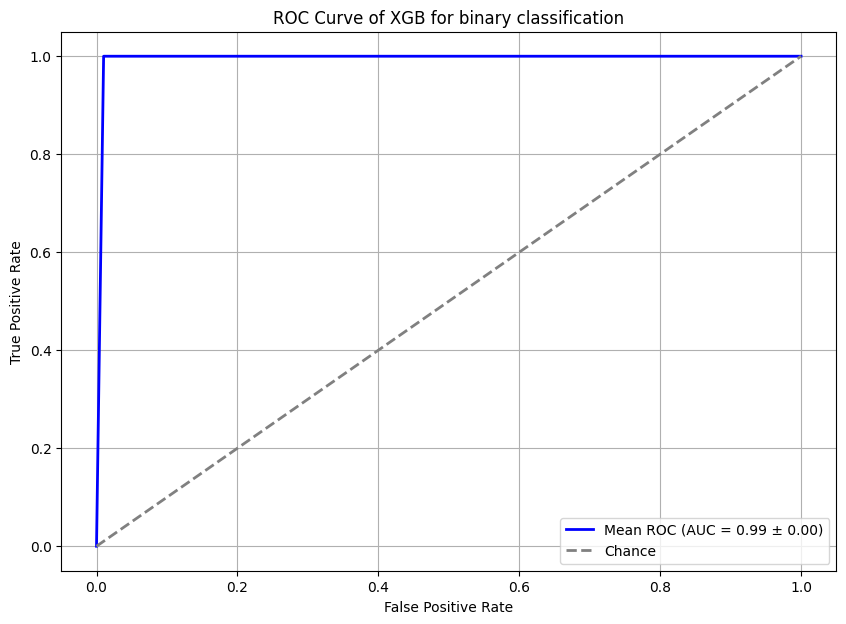

In [17]:
xgb_model_binary = XGBClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca, y_binary_under_sampled, xgb_model_binary, classes)

# Unpack metrics
xgb_accuracy, xgb_precision, xgb_recall, xgb_f1, xgb_conf_matrices, xgb_roc_data = metrics
print("XGBoost Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(xgb_accuracy):.4f}")
print(f"Precision: {np.mean(xgb_precision):.4f}")
print(f"Recall: {np.mean(xgb_recall):.4f}")
print(f"F1 Score: {np.mean(xgb_f1):.4f}")


# Save model and metrics
model_xgb_binary_results = {
    'model': xgb_model_binary,
    'accuracy': xgb_accuracy,
    'precision': xgb_precision,
    'recall': xgb_recall,
    'f1': xgb_f1,
    'conf_matrices': xgb_conf_matrices,
}
joblib.dump(model_xgb_binary_results, 'last_xgb_binary_with_metrics.pkl')

# Plot ROC curve
plot_roc_curve(xgb_roc_data, 'XGB for binary classification')

xgb run just in 6m and 442s

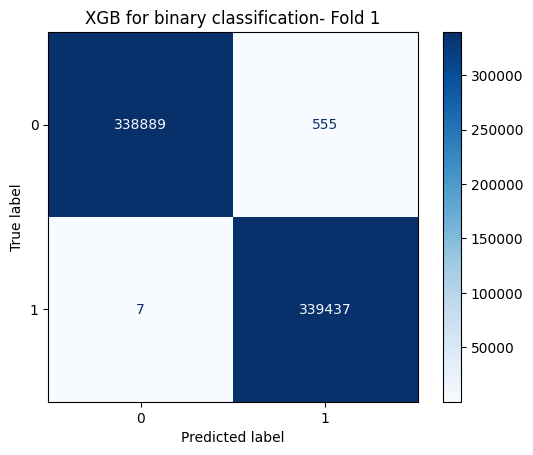

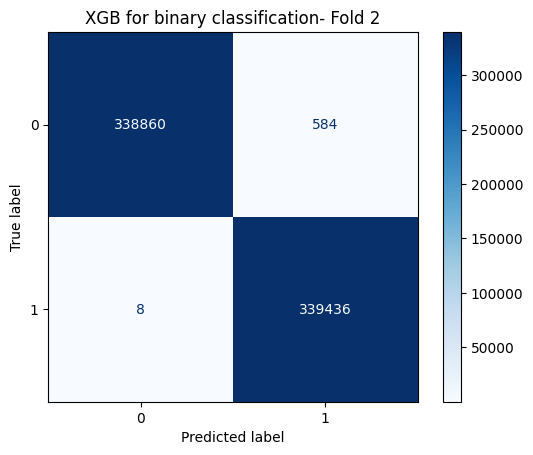

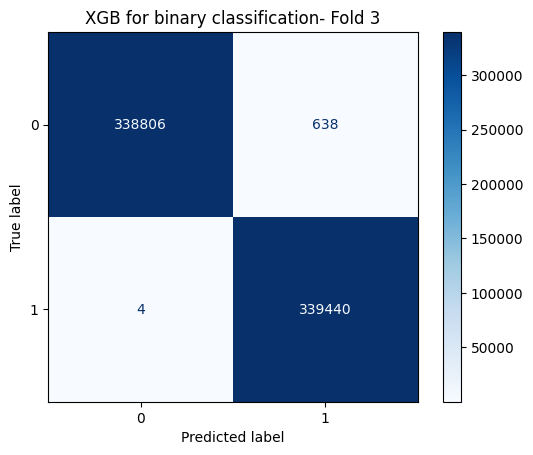

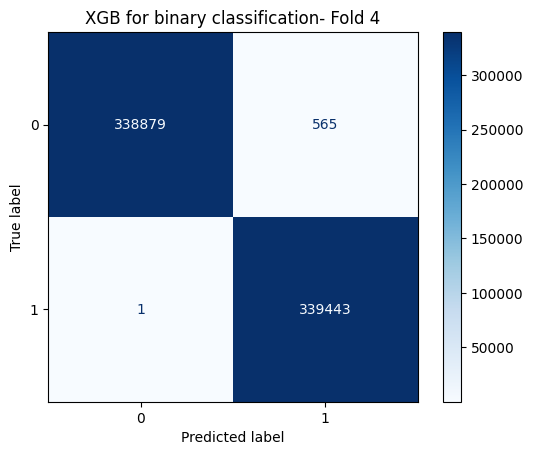

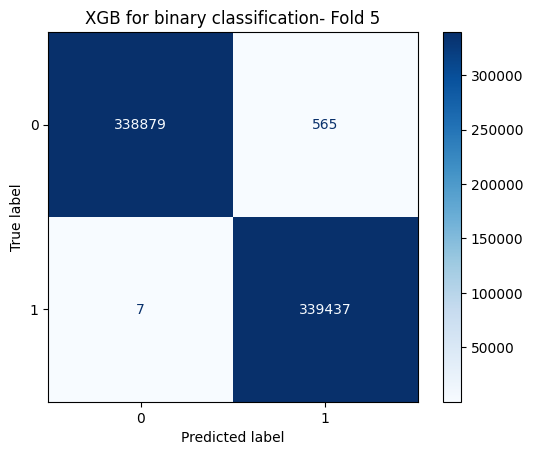

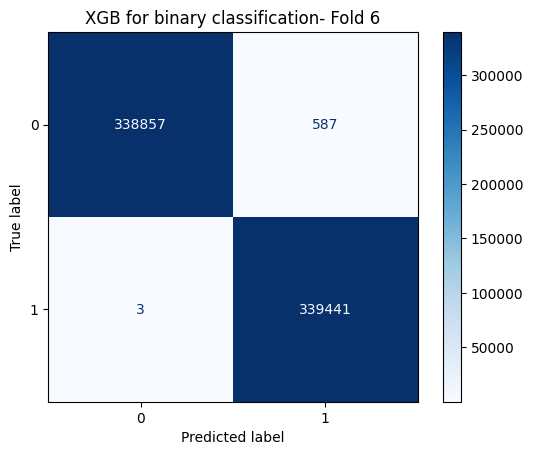

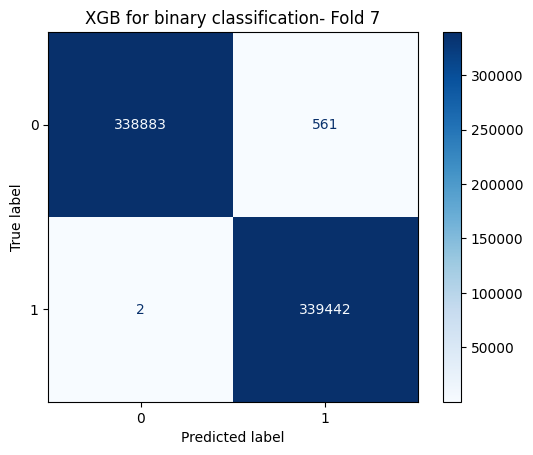

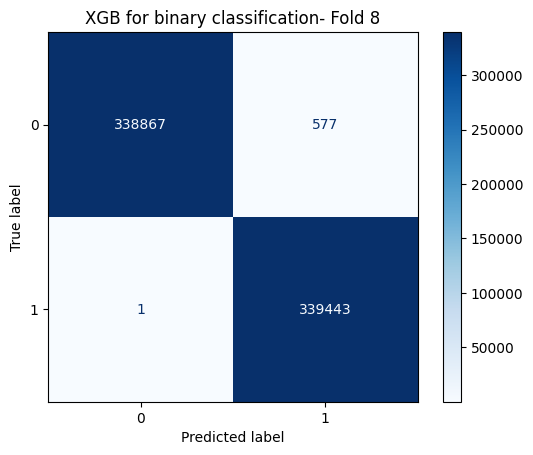

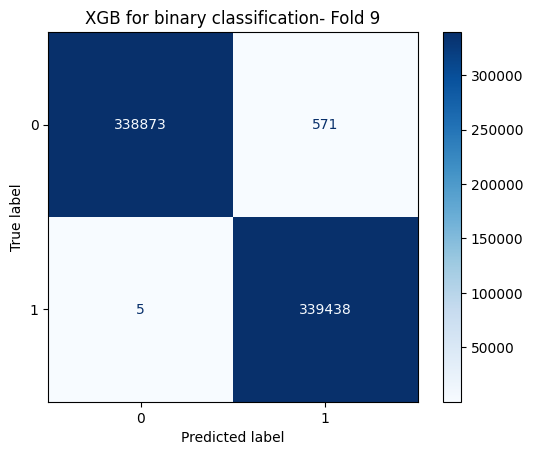

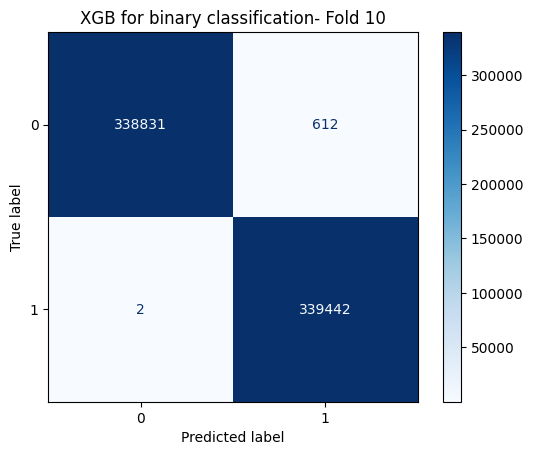

In [19]:
plot_conf_matrices(xgb_conf_matrices, "XGB for binary classification")

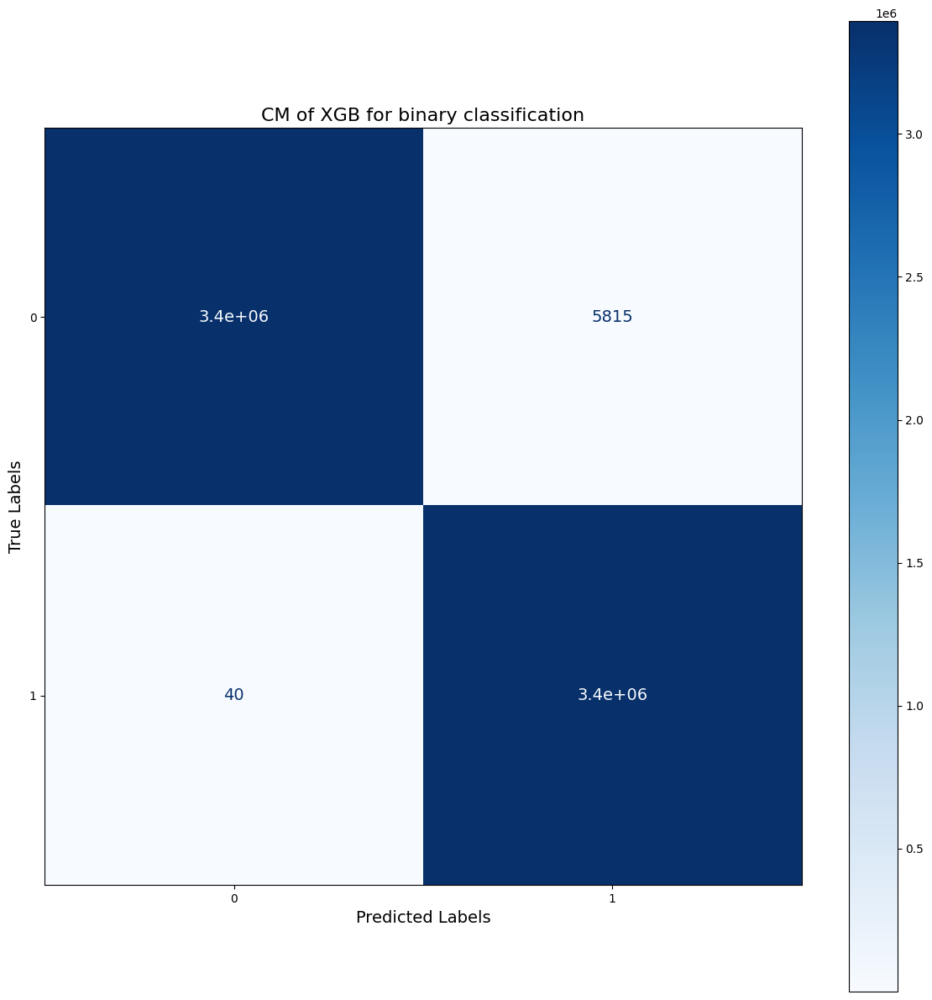

In [18]:
final_cm = aggregate_conf_matrices(xgb_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of XGB for binary classification")


## *Binary Class Classification - Stratified RUS*

In [14]:
X = joblib.load('last_scaled_X64.pkl')
y = joblib.load('last_y.pkl')

y_binary = y.apply((lambda x: 0 if x == 'Benign' else 1))

In [15]:
print(Counter(y_binary))

Counter({0: 7074151, 1: 3394439})


In [16]:
undersampling_strategy={}
for i in range(2):
    undersampling_strategy[i] = Counter(y_binary)[i]//2
undersampling_strategy

{0: 3537075, 1: 1697219}

Original binary class distribution:
Counter({0: 7074151, 1: 3394439})
Undersampled binary class distribution:
Counter({0: 3537075, 1: 1697219})


C:\Users\RAGHAD AYMAN\AppData\Local\Temp\ipykernel_10464\2062140680.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


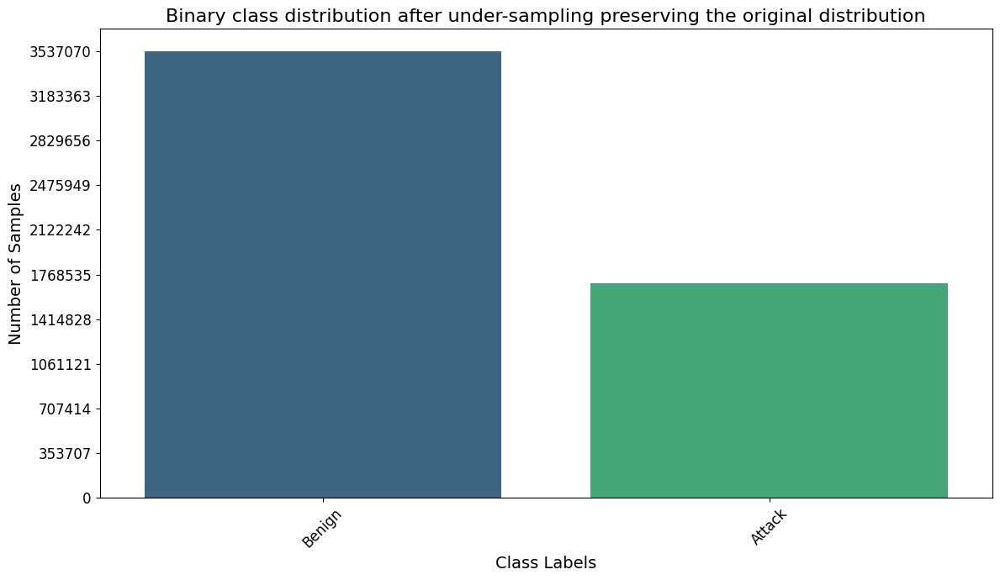

In [17]:
undersampler = RandomUnderSampler(sampling_strategy=undersampling_strategy, random_state=42)
X_binary_under_sampled2, y_binary_under_sampled2 = undersampler.fit_resample(X, y_binary)

print(f"Original binary class distribution:\n{Counter(y_binary)}")
print(f"Undersampled binary class distribution:\n{Counter(y_binary_under_sampled2)}")

label_mapping = {0: 'Benign', 1: 'Attack'}
class_distribution_sampling(y_binary_under_sampled2, label_mapping, "Binary class distribution after under-sampling preserving the original distribution")


Number of components to retain 95.0% variance: 26


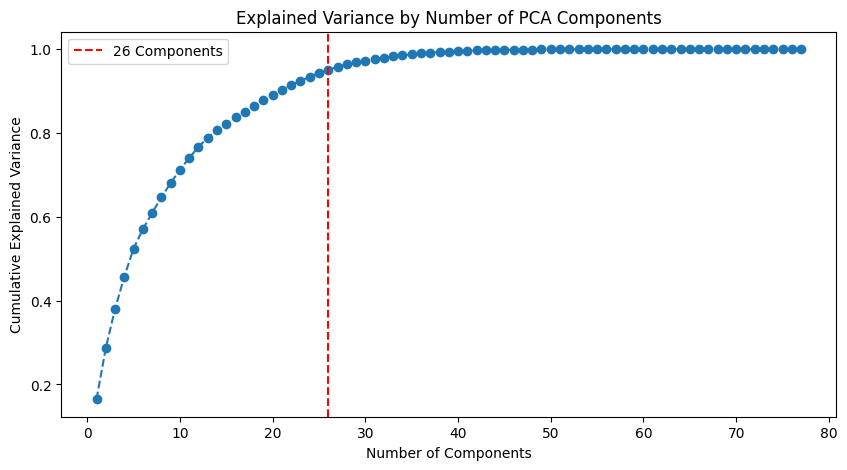

Shape of training set after PCA: (5234294, 26)

Top contributing features for Principal Component 1:
iat_max          0.264890
idle_max         0.264396
idle_mean        0.263075
fwd_iat_max      0.262467
bwd_iat_max      0.259993
idle_min         0.258045
iat_std          0.253260
fwd_iat_std      0.247583
flow_duration    0.240550
fwd_iat_tot      0.237852
Name: PC1, dtype: float64

Top contributing features for Principal Component 2:
bwd_pkt_hdr_len_tot       0.318472
bwd_pkt_cnt               0.318210
bwd_non_empty_pkt_cnt     0.317314
bwd_pkt_len_tot           0.312980
flag_ack                  0.307389
bwd_subflow_pkt_mean      0.300863
bwd_subflow_bytes_mean    0.296802
bwd_flag_psh              0.259759
flag_psh                  0.240150
bwd_bulk_bytes_mean       0.238739
Name: PC2, dtype: float64

Top contributing features for Principal Component 3:
pkt_len_std         0.338329
pkt_len_var         0.327815
pkt_len_mean        0.321838
pkt_len_max         0.320508
fwd_pkt_len_s

In [18]:
optimal_components = determine_optimal_components(X_binary_under_sampled2)

# Step 3: Apply PCA with the optimal number of components
pca = IncrementalPCA(n_components=optimal_components)  # Use IncrementalPCA to reduce memory usage
X_binary_under_sampled_pca2 = pca.fit_transform(X_binary_under_sampled2)

# Step 4: Convert PCA-transformed datasets back to DataFrames
pca_columns = [f"PC{i+1}" for i in range(optimal_components)]
X_binary_under_sampled_pca2 = pd.DataFrame(X_binary_under_sampled_pca2, columns=pca_columns)

# Print the shape of the transformed datasets
print(f"Shape of training set after PCA: {X_binary_under_sampled_pca2.shape}")

# Print the original features most associated with the principal components
feature_names = X_binary_under_sampled2.columns  # Assuming X_resampled is a DataFrame with feature names

components = pd.DataFrame(
    pca.components_, 
    columns=feature_names, 
    index=[f"PC{i+1}" for i in range(optimal_components)]
)

# Display the top contributing features for each principal component
for i in range(optimal_components):
    print(f"\nTop contributing features for Principal Component {i+1}:")
    top_features = components.iloc[i].sort_values(ascending=False).head(10)  # Top 10 features
    print(top_features)


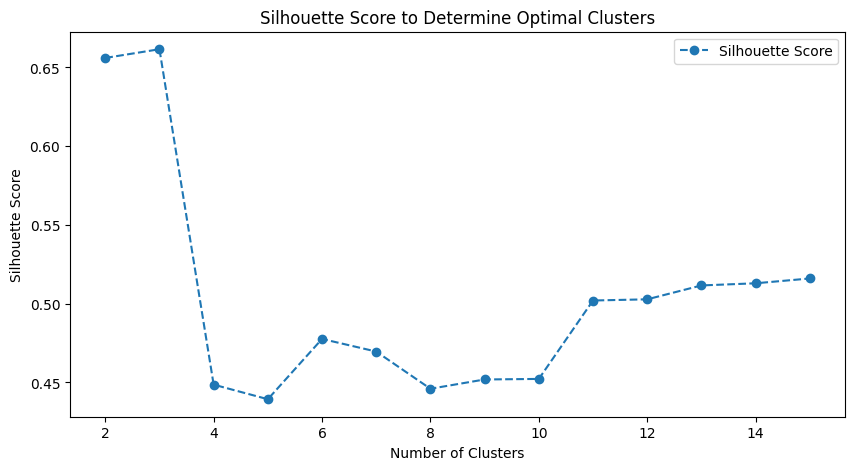

Optimal number of clusters based on silhouette score: 3
Kmeans Cluster distribution:
 Kmeans_Cluster_Label
1    4008448
0     930534
2     295312
Name: count, dtype: int64
shape after adding Kmeans Cluster label (5234294, 27)
Gaussian Mixture cluster distribution:
 GMM_Cluster_Label
2    3306369
1    1018192
0     909733
Name: count, dtype: int64
Shape after adding GM Cluster label: (5234294, 28)


In [20]:
sample_size = 10000
X_sampled = X_binary_under_sampled_pca2.sample(n=sample_size, random_state=42)

# Determine the optimal number of clusters
optimal_clusters = determine_optimal_clusters(X_sampled)

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_binary_under_sampled_pca2['Kmeans_Cluster_Label'] = kmeans.fit_predict(X_binary_under_sampled_pca2)
# Print cluster distribution
print("Kmeans Cluster distribution:\n", X_binary_under_sampled_pca2['Kmeans_Cluster_Label'].value_counts())
print(f'shape after adding Kmeans Cluster label {X_binary_under_sampled_pca2.shape}')

gmm = GaussianMixture(n_components=optimal_clusters, random_state=42)
# Fit and predict cluster labels
X_binary_under_sampled_pca2['GMM_Cluster_Label'] = gmm.fit_predict(X_binary_under_sampled_pca2)

# Save the dataset with SFE-PCA
joblib.dump(X_binary_under_sampled_pca2, 'last_X_binary_under_sampled2_SFE_PCA2.pkl')

# Print cluster distribution
print("Gaussian Mixture cluster distribution:\n", X_binary_under_sampled_pca2['GMM_Cluster_Label'].value_counts())
print(f'Shape after adding GM Cluster label: {X_binary_under_sampled_pca2.shape}')  # Should be (,6)



In [21]:
joblib.dump(y_binary_under_sampled2, 'last_y_binary_under_sampled2.pkl')

['last_y_binary_under_sampled2.pkl']

#### **XGBoost**

Number of classes: 2
XGBoost Metrics (Average over 10 Folds):
Accuracy: 0.9988
Precision: 0.9988
Recall: 0.9988
F1 Score: 0.9988


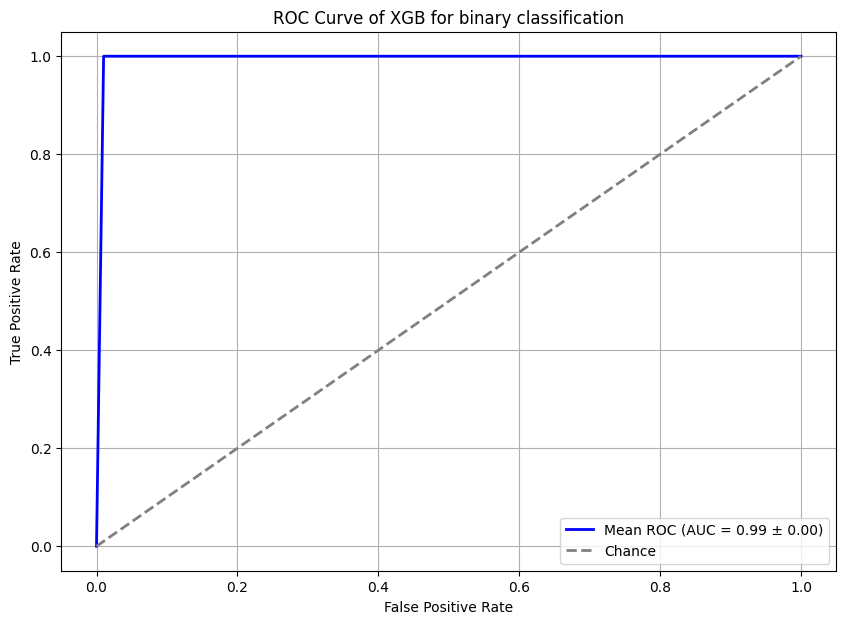

In [26]:
y_binary_under_sampled2 = joblib.load('last_y_binary_under_sampled2.pkl')
X_binary_under_sampled_pca2 = joblib.load('last_X_binary_under_sampled2_SFE_PCA2.pkl')

# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_binary_under_sampled2.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

xgb_model_binary2 = XGBClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca2, y_binary_under_sampled2, xgb_model_binary2, classes)

# Unpack metrics
xgb_accuracy, xgb_precision, xgb_recall, xgb_f1, xgb_conf_matrices, xgb_roc_data = metrics
print("XGBoost Metrics (Average over 10 Folds):")
print(f"Accuracy: {np.mean(xgb_accuracy):.4f}")
print(f"Precision: {np.mean(xgb_precision):.4f}")
print(f"Recall: {np.mean(xgb_recall):.4f}")
print(f"F1 Score: {np.mean(xgb_f1):.4f}")


# Save model and metrics
model_xgb_binary2_results = {
    'model': xgb_model_binary2,
    'accuracy': xgb_accuracy,
    'precision': xgb_precision,
    'recall': xgb_recall,
    'f1': xgb_f1,
    'conf_matrices': xgb_conf_matrices,
}
joblib.dump(model_xgb_binary2_results, 'last_xgb_binary_with_metrics2.pkl')

# Plot ROC curve
plot_roc_curve(xgb_roc_data, 'XGB for binary classification (original distribution)')##preserving class distribution

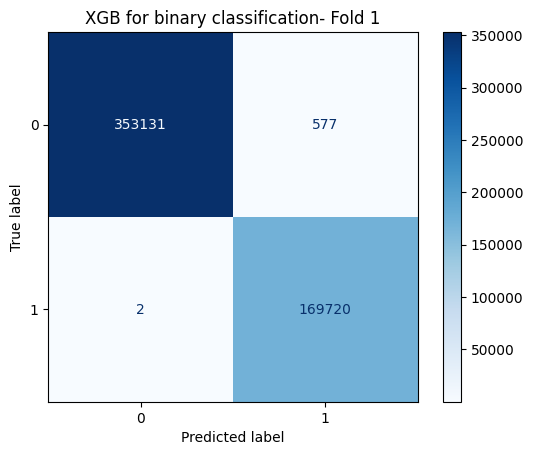

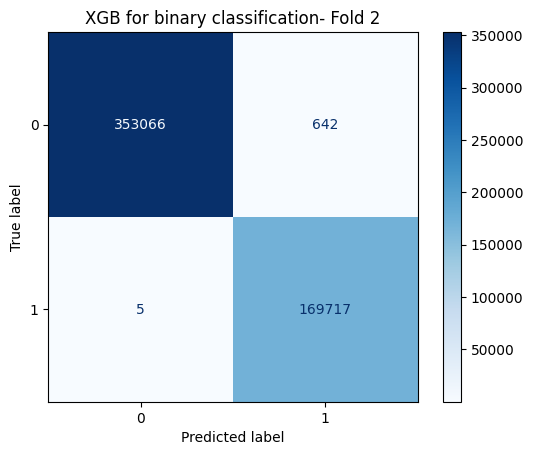

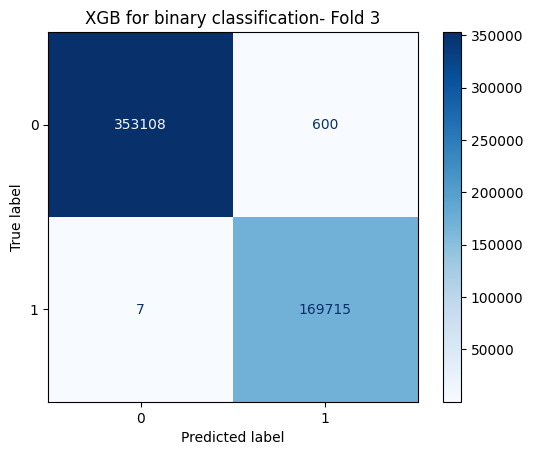

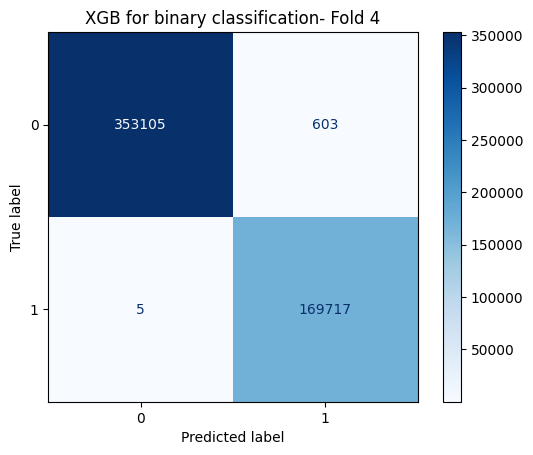

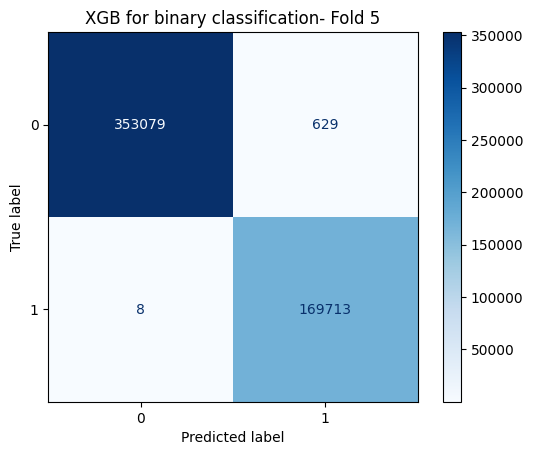

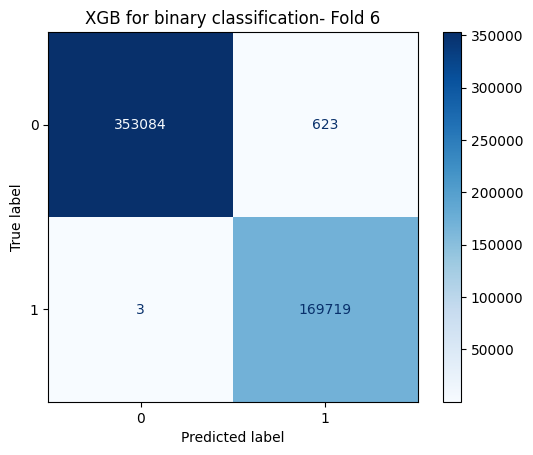

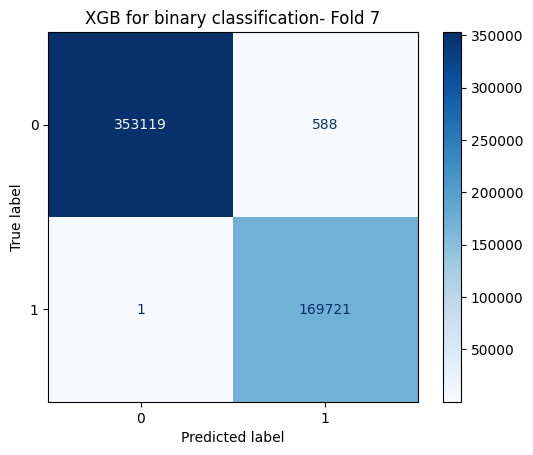

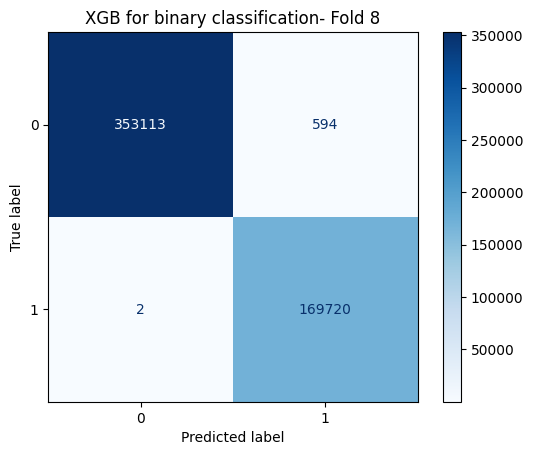

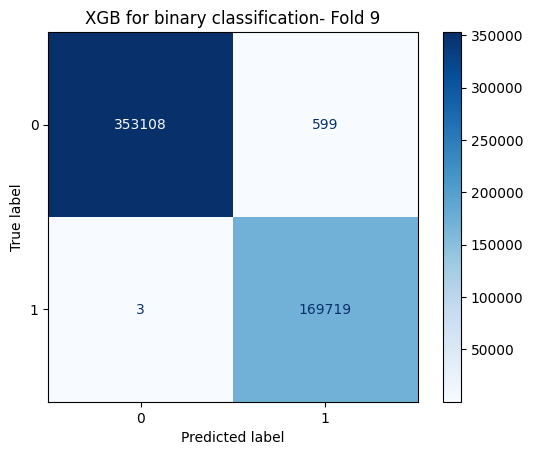

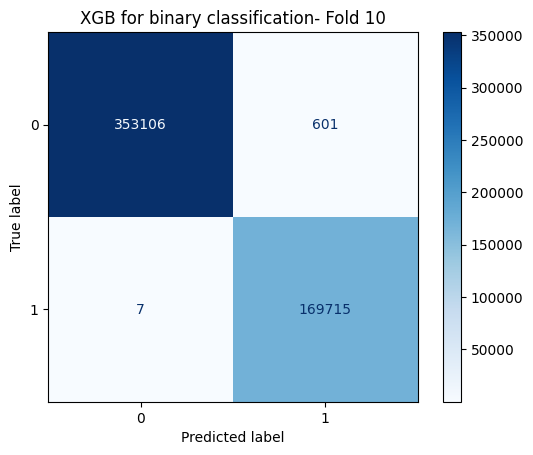

In [27]:
##undersampling while preserving orignial proportions
plot_conf_matrices(xgb_conf_matrices, "XGB for binary classification") 


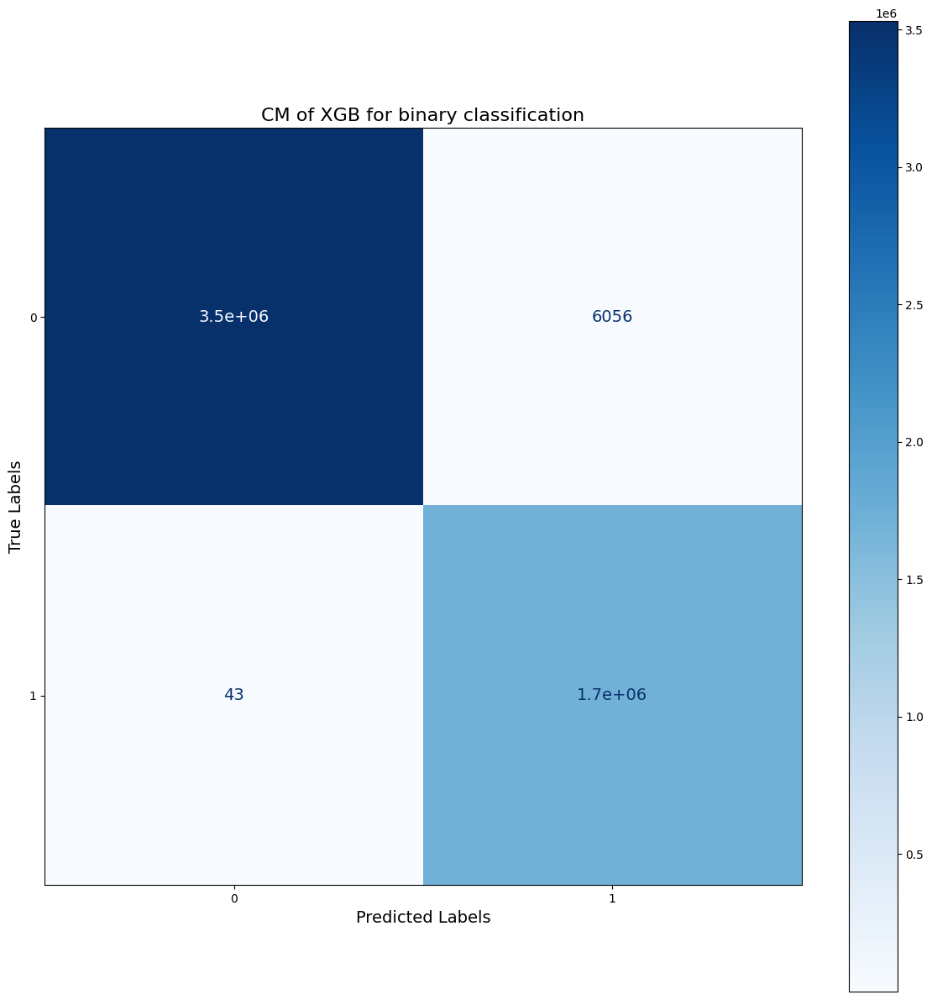

In [28]:
###undersampling while preserving original proportions
final_cm = aggregate_conf_matrices(xgb_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of XGB for binary classification")

#### **Decision Tree**

Number of classes: 2
Decision Tree Metrics(preseving original Distribution) (Average over 10 Folds):
Accuracy: 0.9977
Precision: 0.9977
Recall: 0.9977
F1 Score: 0.9977


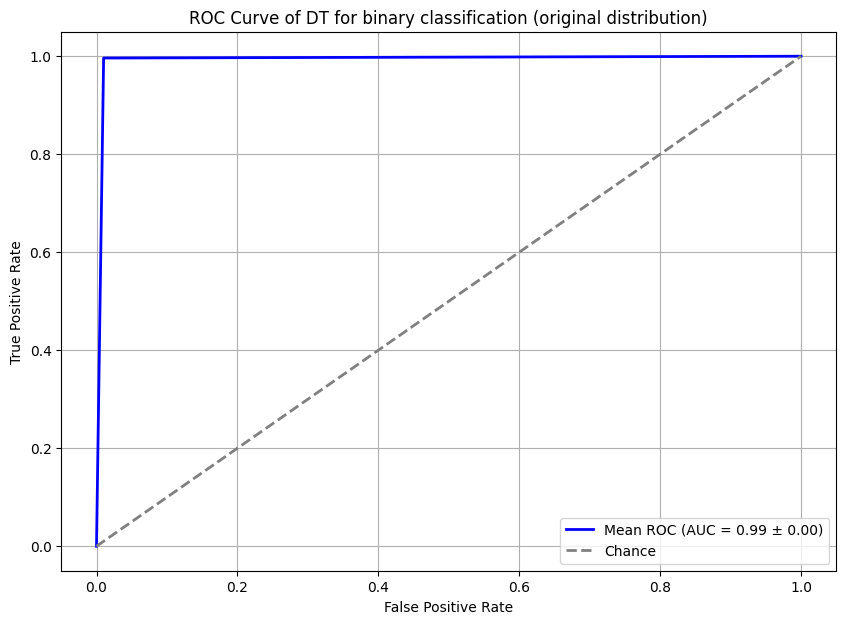

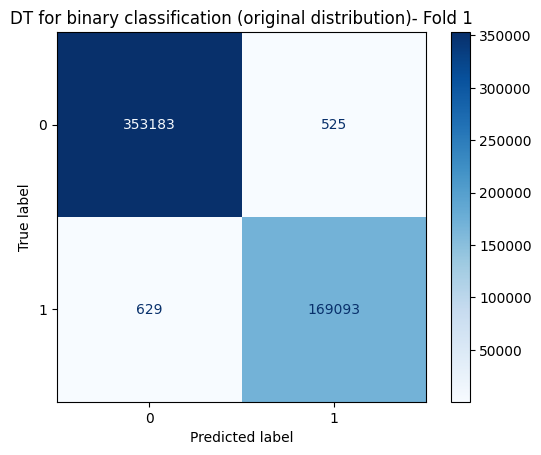

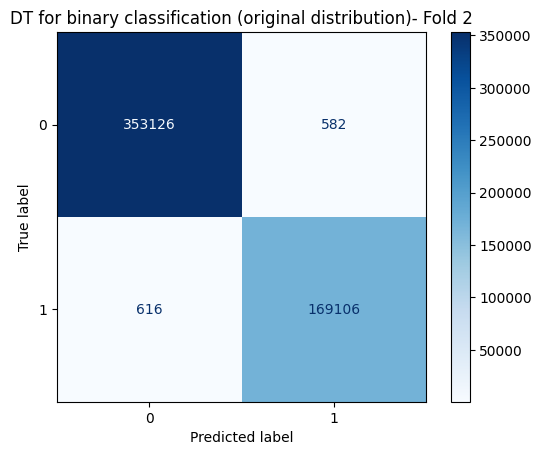

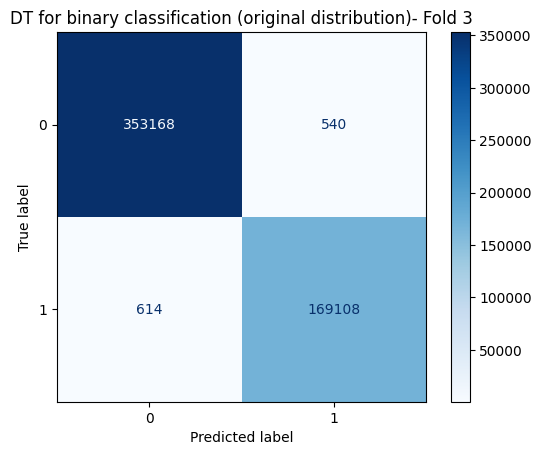

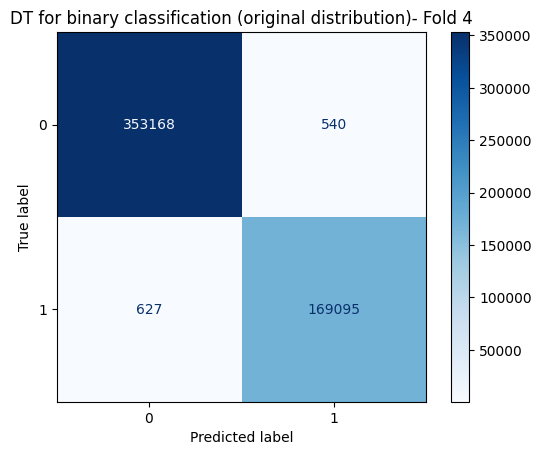

...

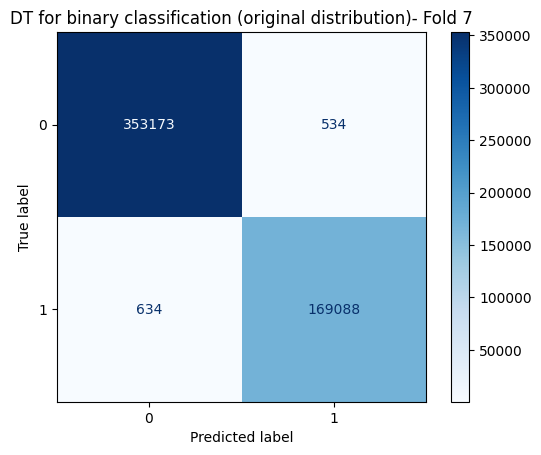

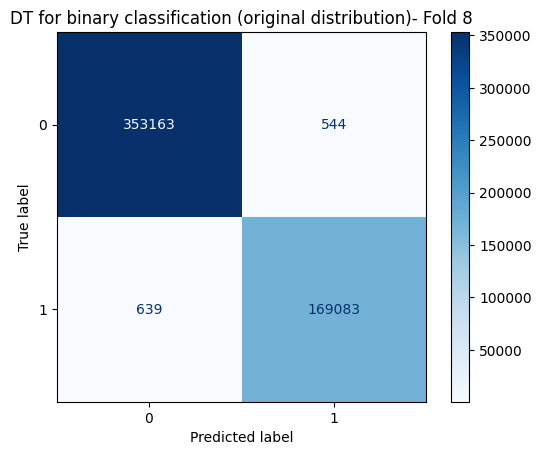

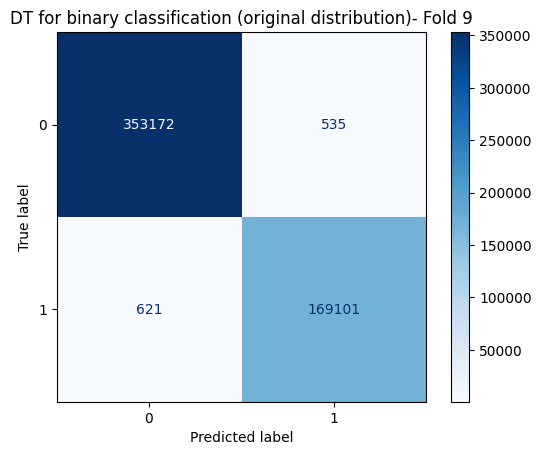

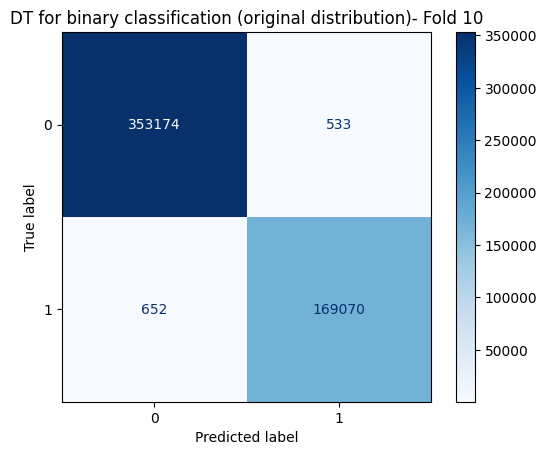

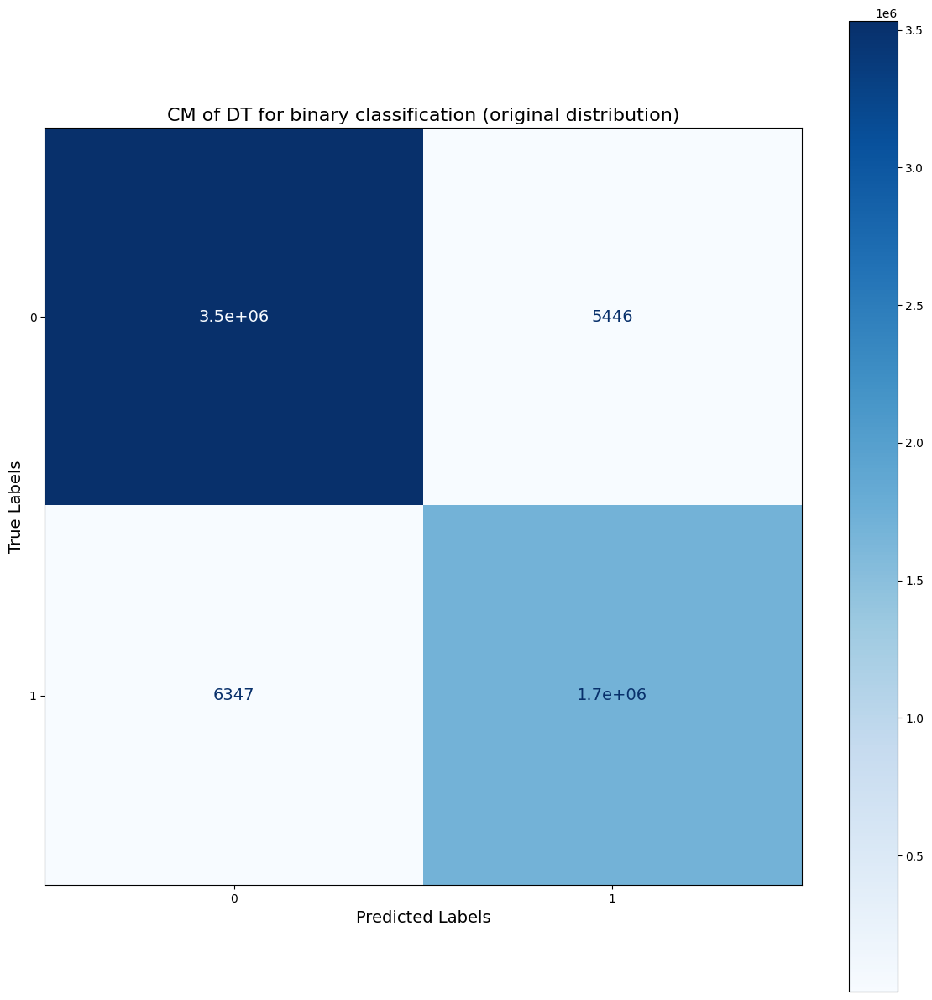

In [26]:
y_binary_under_sampled2 = joblib.load('last_y_binary_under_sampled2.pkl')
X_binary_under_sampled_pca2 = joblib.load('last_X_binary_under_sampled2_SFE_PCA2.pkl')

# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_binary_under_sampled2.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

dt_model_binary2 = DecisionTreeClassifier(random_state=42)
# skf = StratifiedKFold(n_splits=10)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca2, y_binary_under_sampled2, dt_model_binary2, classes)

# Unpack metrics
dt_accuracy, dt_precision, dt_recall, dt_f1, dt_conf_matrices, dt_roc_data = metrics
print("Decision Tree Metrics(preseving original Distribution) (Average over 10 Folds):")
print(f"Accuracy: {np.mean(dt_accuracy):.4f}")
print(f"Precision: {np.mean(dt_precision):.4f}")
print(f"Recall: {np.mean(dt_recall):.4f}")
print(f"F1 Score: {np.mean(dt_f1):.4f}")


# Save model and metrics 
model_dt_binary2_results = {
    'model': dt_model_binary2,
    'accuracy': dt_accuracy,
    'precision': dt_precision,
    'recall': dt_recall,
    'f1': dt_f1,
    'conf_matrices': dt_conf_matrices,
}
joblib.dump(model_dt_binary2_results, 'last_dt_binary_with_metrics2.pkl')

# Plot ROC curve
plot_roc_curve(dt_roc_data, 'DT for binary classification (original distribution)')##preserving class distribution


plot_conf_matrices(dt_conf_matrices, "DT for binary classification (original distribution)") 

final_cm = aggregate_conf_matrices(dt_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of DT for binary classification (original distribution)")


dt takes 96m 43.3s

#### **Extra Trees**

Number of classes: 2
Extra Trees Metrics- preserving class distribution (Average over 10 Folds):
Accuracy: 0.9987
Precision: 0.9987
Recall: 0.9987
F1 Score: 0.9987


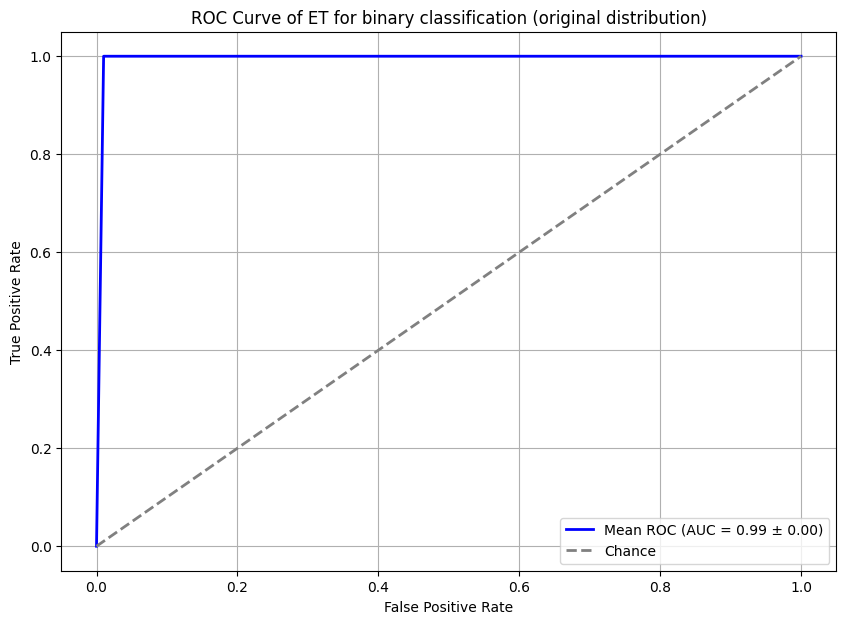

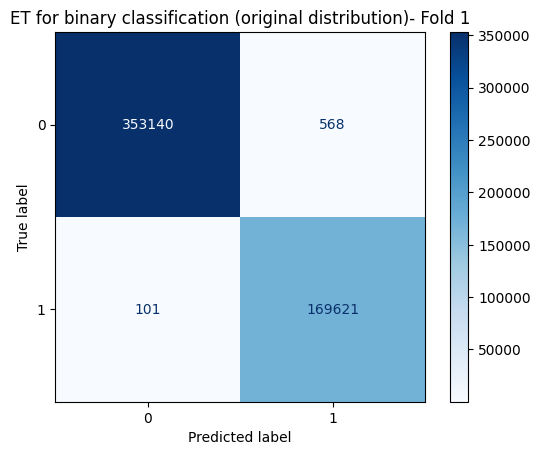

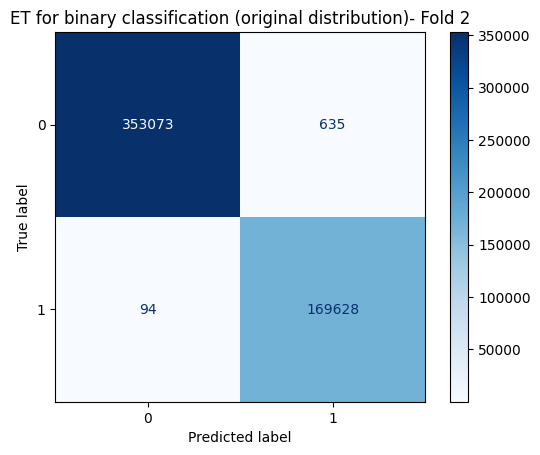

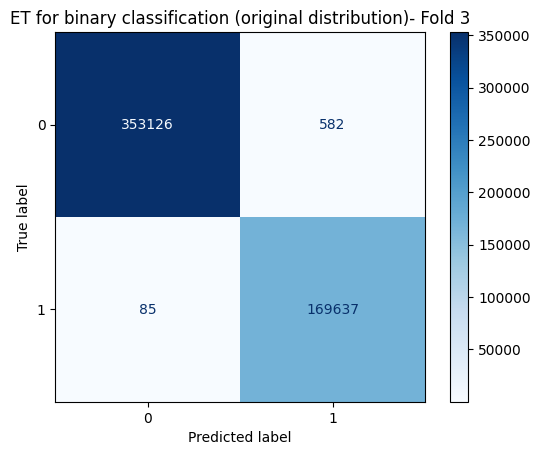

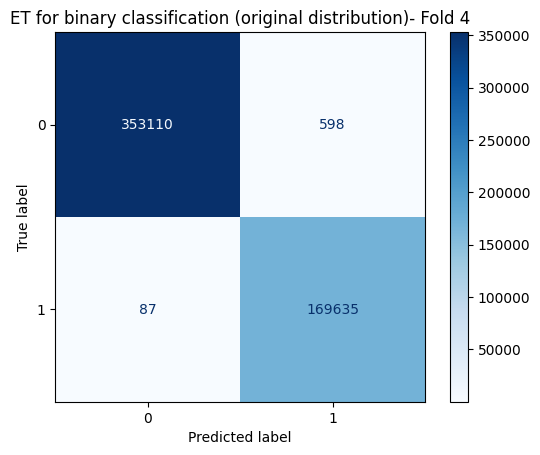

...

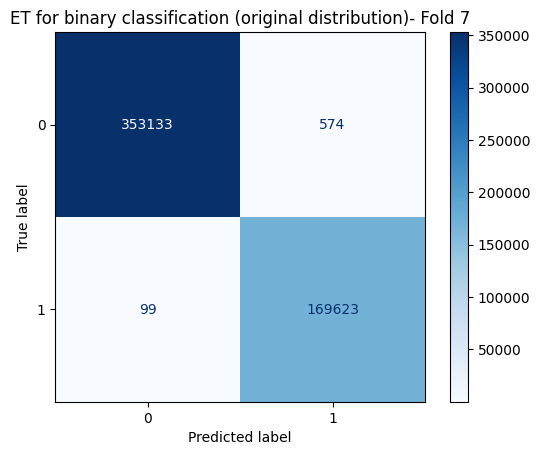

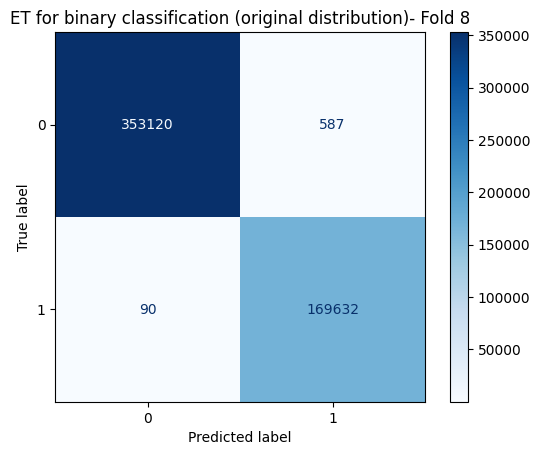

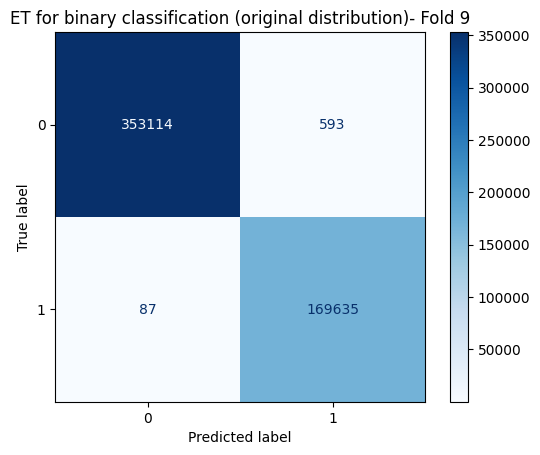

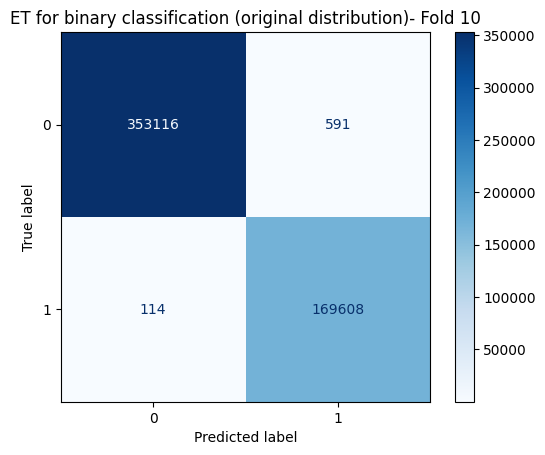

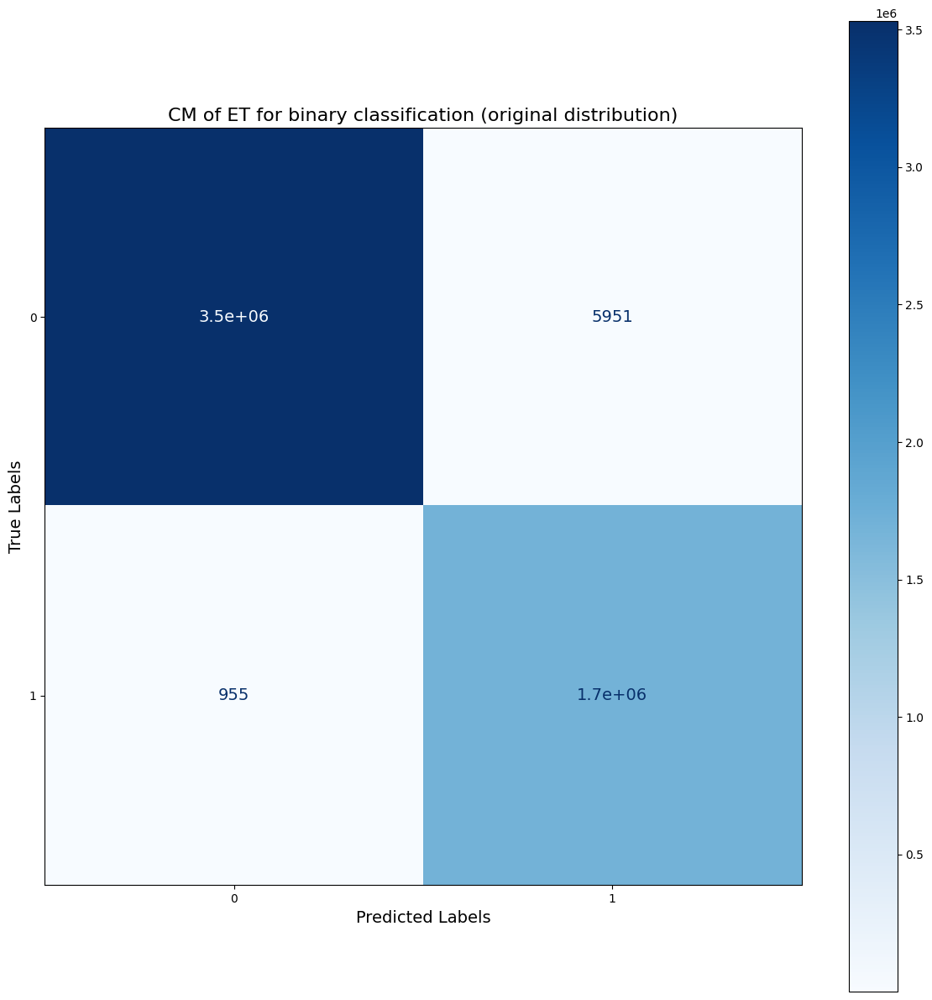

In [16]:
##Extra Trees

y_binary_under_sampled2 = joblib.load('last_y_binary_under_sampled2.pkl')
X_binary_under_sampled_pca2 = joblib.load('last_X_binary_under_sampled2_SFE_PCA2.pkl')

# k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_binary_under_sampled2.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

et_model_binary2 = ExtraTreesClassifier(random_state=42)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca2, y_binary_under_sampled2, et_model_binary2, classes)

# Unpack metrics
et_accuracy, et_precision, et_recall, et_f1, et_conf_matrices, et_roc_data = metrics
print("Extra Trees Metrics- preserving class distribution (Average over 10 Folds):")
print(f"Accuracy: {np.mean(et_accuracy):.4f}")
print(f"Precision: {np.mean(et_precision):.4f}")
print(f"Recall: {np.mean(et_recall):.4f}")
print(f"F1 Score: {np.mean(et_f1):.4f}")


# Save model and metrics
model_et_binary2_results = {
    'model': et_model_binary2,
    'accuracy': et_accuracy,
    'precision': et_precision,
    'recall': et_recall,
    'f1': et_f1,
    'conf_matrices': et_conf_matrices,
}
joblib.dump(model_et_binary2_results, 'last_et_binary_with_metrics2.pkl')

# Plot ROC curve
plot_roc_curve(et_roc_data, 'ET for binary classification (original distribution)')##preserving class distribution

plot_conf_matrices(et_conf_matrices, "ET for binary classification (original distribution)") 

final_cm = aggregate_conf_matrices(et_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of ET for binary classification (original distribution)")


#### **Random Forest**

In [10]:
## Random forest

y_binary_under_sampled2 = joblib.load('last_y_binary_under_sampled2.pkl')
X_binary_under_sampled_pca2 = joblib.load('last_X_binary_under_sampled2_SFE_PCA2.pkl')

# # k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_binary_under_sampled2.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

rf_model_binary2 = RandomForestClassifier(random_state=42)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca2, y_binary_under_sampled2, rf_model_binary2, classes)

# Unpack metrics
rf_accuracy, rf_precision, rf_recall, rf_f1, rf_conf_matrices, rf_roc_data = metrics
print("Random Foresr Metrics - preserving original distribution (Average over 10 Folds):")
print(f"Accuracy: {np.mean(rf_accuracy):.4f}")
print(f"Precision: {np.mean(rf_precision):.4f}")
print(f"Recall: {np.mean(rf_recall):.4f}")
print(f"F1 Score: {np.mean(rf_f1):.4f}")

# Save model and metrics 
model_rf_binary2_results = {
    'model': rf_model_binary2,
    'accuracy': rf_accuracy,
    'precision': rf_precision,
    'recall': rf_recall,
    'f1': rf_f1,
    'conf_matrices': rf_conf_matrices,
}
joblib.dump(model_rf_binary2_results, 'last_rf_binary_with_metrics2.pkl')

# Plot ROC curve
plot_roc_curve(rf_roc_data, 'RF for binary classification (original distribution)')##preserving class distribution

plot_conf_matrices(rf_conf_matrices, "RF for binary classification (original distribution)") 

final_cm = aggregate_conf_matrices(rf_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of RF for binary classification (original distribution)")


Number of classes: 2


KeyboardInterrupt: 

rewrite RF takes more than 40 hours and not finidhed yet so I will use n_jobs = -1

Number of classes: 2
Random Foresr Metrics - preserving original distribution (Average over 10 Folds):
Accuracy: 0.9988
Precision: 0.9988
Recall: 0.9988
F1 Score: 0.9988


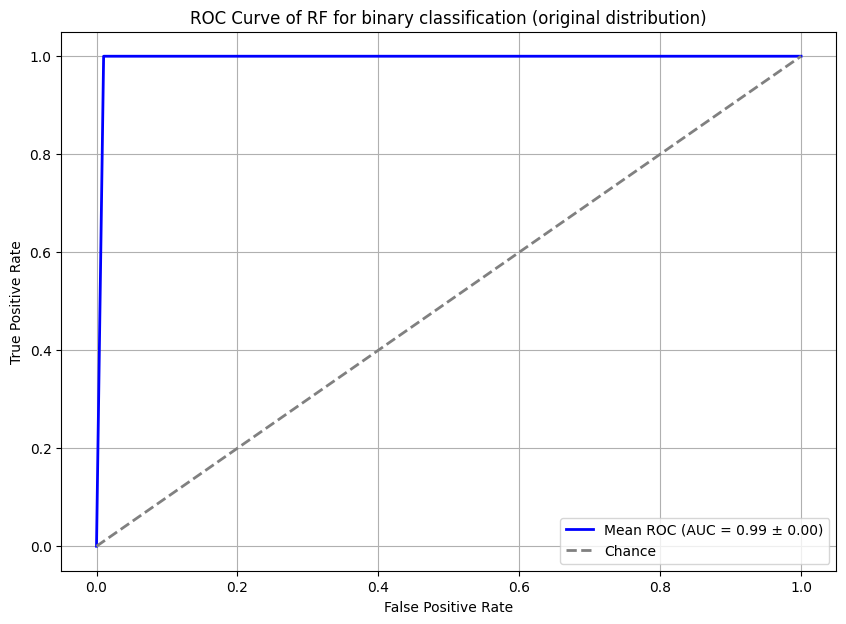

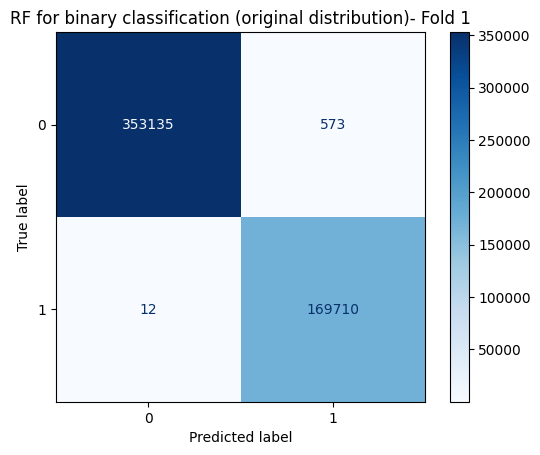

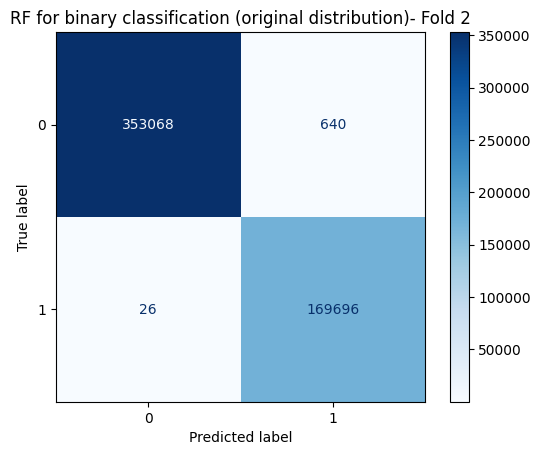

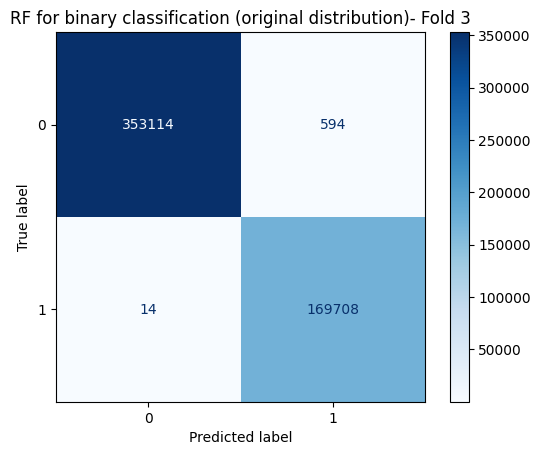

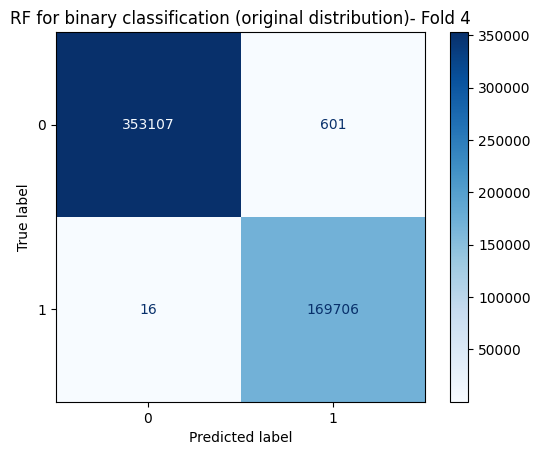

...

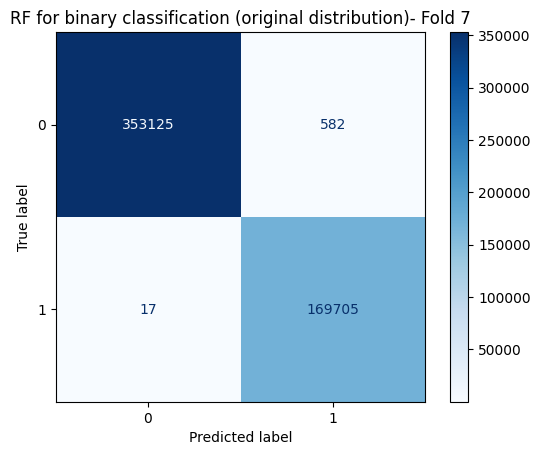

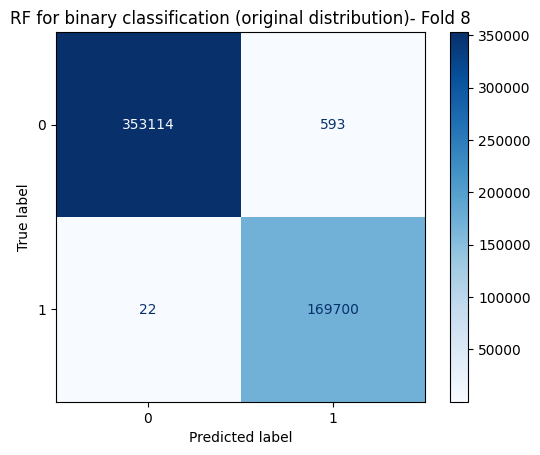

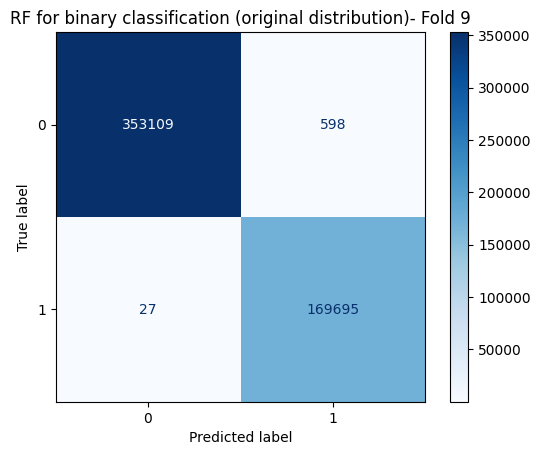

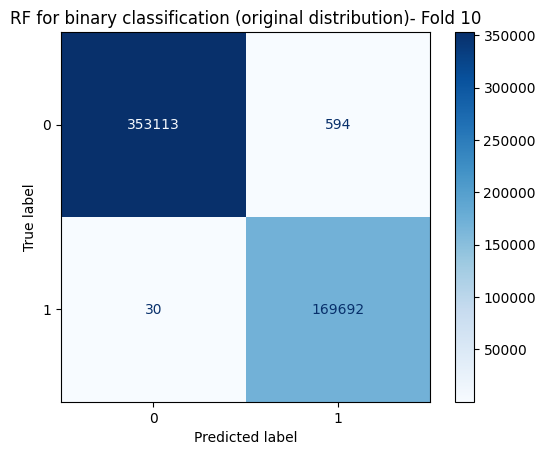

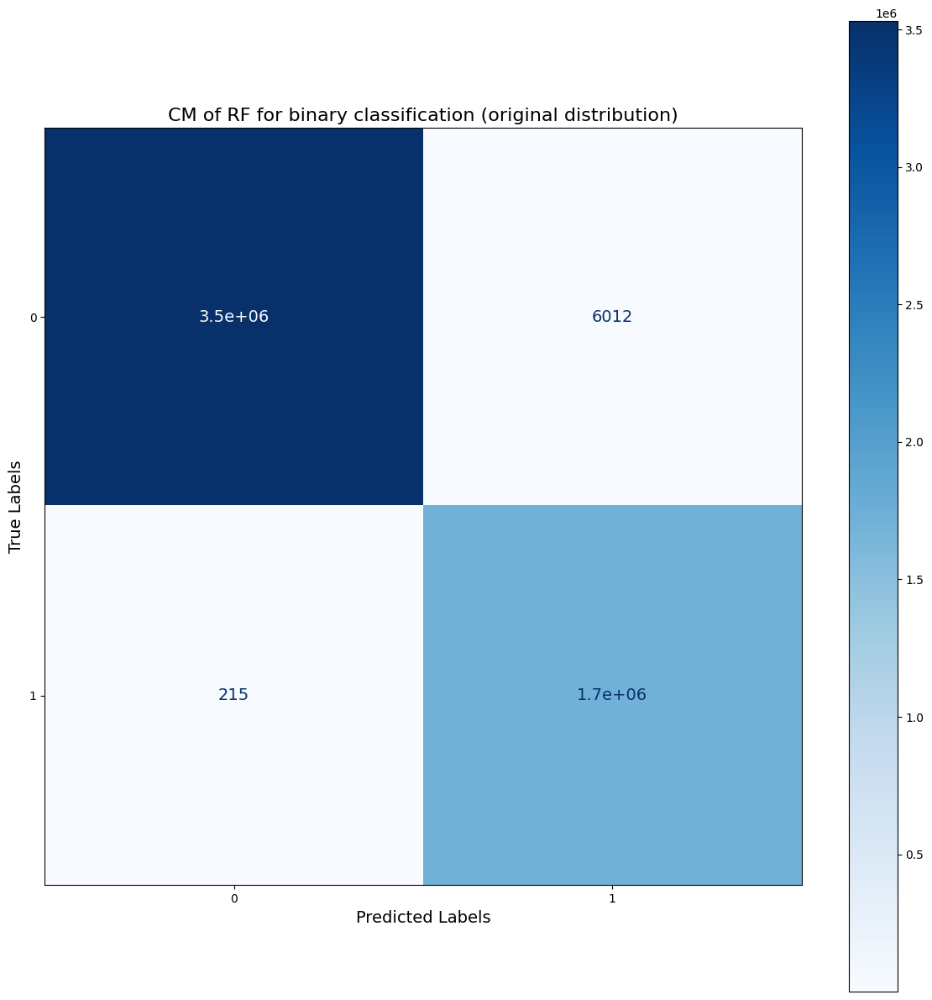

In [10]:
## Random forest

y_binary_under_sampled2 = joblib.load('last_y_binary_under_sampled2.pkl')
X_binary_under_sampled_pca2 = joblib.load('last_X_binary_under_sampled2_SFE_PCA2.pkl')

# # k-Fold setup
k = 10
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)
classes = y_binary_under_sampled2.unique()  # List of unique classes (should be 2)
print(f"Number of classes: {len(classes)}")

rf_model_binary2 = RandomForestClassifier(random_state=42, n_jobs=-1)

# Evaluate model and get metrics
metrics = evaluate_model_with_roc(skf, X_binary_under_sampled_pca2, y_binary_under_sampled2, rf_model_binary2, classes)

# Unpack metrics
rf_accuracy, rf_precision, rf_recall, rf_f1, rf_conf_matrices, rf_roc_data = metrics
print("Random Foresr Metrics - preserving original distribution (Average over 10 Folds):")
print(f"Accuracy: {np.mean(rf_accuracy):.4f}")
print(f"Precision: {np.mean(rf_precision):.4f}")
print(f"Recall: {np.mean(rf_recall):.4f}")
print(f"F1 Score: {np.mean(rf_f1):.4f}")

# Save model and metrics 
model_rf_binary2_results = {
    'model': rf_model_binary2,
    'accuracy': rf_accuracy,
    'precision': rf_precision,
    'recall': rf_recall,
    'f1': rf_f1,
    'conf_matrices': rf_conf_matrices,
}
joblib.dump(model_rf_binary2_results, 'last_rf_binary_with_metrics2.pkl')

# Plot ROC curve
plot_roc_curve(rf_roc_data, 'RF for binary classification (original distribution)')##preserving class distribution

##undersampling while preserving orignial distribution
plot_conf_matrices(rf_conf_matrices, "RF for binary classification (original distribution)") 

final_cm = aggregate_conf_matrices(rf_conf_matrices)
# Call the function to plot the aggregated confusion matrix
plot_final_confusion_matrix(final_cm, "CM of RF for binary classification (original distribution)")


RF  TAKES 204m 16.2s with n_job = -1

stop here

Number of components to retain 95.0% variance: 27


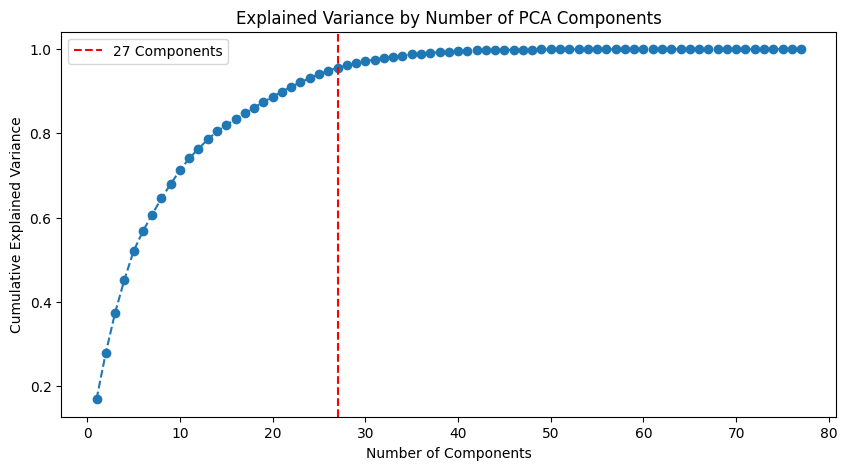

Shape of training set after PCA: (10468590, 27)

Top contributing features for Principal Component 1:
iat_max          0.267279
idle_max         0.266985
idle_mean        0.265659
fwd_iat_max      0.264766
bwd_iat_max      0.262413
idle_min         0.260586
iat_std          0.256090
fwd_iat_std      0.250191
flow_duration    0.242236
fwd_iat_tot      0.239481
Name: PC1, dtype: float64

Top contributing features for Principal Component 2:
bwd_pkt_hdr_len_tot       0.302073
bwd_pkt_cnt               0.301750
bwd_non_empty_pkt_cnt     0.299490
bwd_pkt_len_tot           0.299467
flag_ack                  0.298032
bwd_subflow_pkt_mean      0.284904
bwd_subflow_bytes_mean    0.284116
bwd_bulk_bytes_mean       0.239633
bwd_bulk_pkt_mean         0.239497
flag_psh                  0.202174
Name: PC2, dtype: float64

Top contributing features for Principal Component 3:
pkt_len_std         0.319530
pkt_len_var         0.311253
pkt_len_mean        0.303775
pkt_len_max         0.301595
fwd_pkt_len_

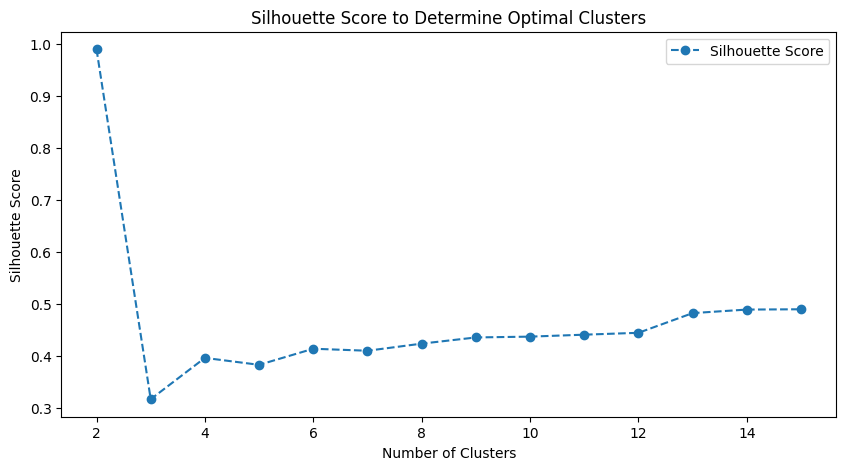

Optimal number of clusters based on silhouette score: 2
Kmeans Cluster distribution:
 Kmeans_Cluster_Label
0    9875015
1     593575
Name: count, dtype: int64
shape after adding Kmeans Cluster label (10468590, 28)


MemoryError: Unable to allocate 2.18 GiB for an array with shape (10468590, 28) and data type float64

In [ ]:
# train all dataset as it is without 
X = joblib.load('last_scaled_X64.pkl')
y = joblib.load('last_y.pkl')

y_binary = y.apply((lambda x: 0 if x == 'Benign' else 1))

optimal_components = determine_optimal_components(X)

# Step 3: Apply PCA with the optimal number of components
pca = IncrementalPCA(n_components=optimal_components)  # Use IncrementalPCA to reduce memory usage
X_pca = pca.fit_transform(X)


# Step 4: Convert PCA-transformed datasets back to DataFrames
pca_columns = [f"PC{i+1}" for i in range(optimal_components)]
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

# Print the shape of the transformed datasets
print(f"Shape of training set after PCA: {X_pca.shape}")

# Print the original features most associated with the principal components
feature_names = X.columns  # Assuming X_resampled is a DataFrame with feature names

components = pd.DataFrame(
    pca.components_, 
    columns=feature_names, 
    index=[f"PC{i+1}" for i in range(optimal_components)]
)

# Display the top contributing features for each principal component
for i in range(optimal_components):
    print(f"\nTop contributing features for Principal Component {i+1}:")
    top_features = components.iloc[i].sort_values(ascending=False).head(10)  # Top 10 features
    print(top_features)


# Determine the optimal number of clusters
sample_size = 10000
X_sampled = X_pca.sample(n=sample_size, random_state=42)


# Determine the optimal number of clusters
# optimal_clusters = determine_optimal_clusters(X_resampled_pca)
optimal_clusters = determine_optimal_clusters(X_sampled)

# Train KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_pca['Kmeans_Cluster_Label'] = kmeans.fit_predict(X_pca)
# Print cluster distribution
print("Kmeans Cluster distribution:\n", X_pca['Kmeans_Cluster_Label'].value_counts())
print(f'shape after adding Kmeans Cluster label {X_pca.shape}')



rewrite got a memory error when trying to train the model using the whole dataset without RUS

rewrite add conclusion and methodolggy strength

# **References**
1. Cantone, M., et al. (2024). *On the Cross-Dataset Generalization of Machine Learning for Network Intrusion Detection*.